In [1]:
import os
import sys
#sys.path.append('/home/cjw/Code/DeepLearning')

import tensorflow as tf
import numpy as np
import pandas as pd

from autoencoder import autoencoder_channels
from autoencoder import network
from autoencoder import utils

/home/cjw/anaconda3/envs/deep/lib/python3.6/site-packages/h5py/__init__.py:36: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
  from ._conv import register_converters as _register_converters


In [4]:
#datadir = "/v/Data/cyto/mmCompensatedTifs"
datadir = "/media/cjw/Data/cyto/mmCompensatedTifs"

mmfiles = utils.list_mmfiles(datadir)
print(mmfiles)

mmdict = dict()

n_all_images = 0
for mmfilename in mmfiles:
#mmfilename = datadir + "Fish6_15_cjw_mean_zero.mm"
#mmfilename = datadir + "mmplate15-1.mm"
    mmheader = np.memmap(mmfilename, dtype="int32", mode='r',
                    shape=(4,))

    header_shape = mmheader.shape
    print(header_shape, mmheader)
    xshape = [mmheader[0], mmheader[1], mmheader[2], mmheader[3]]
    xshape = tuple(xshape)
    del mmheader
    n_all_images += xshape[0]
    
    m3 = np.memmap(mmfilename, dtype='float32', offset=128,
              mode='r', shape=xshape)
    key = mmfilename.split("/")[-1]
    mmdict[key] = m3

print(n_all_images)
mmdict.keys()

['/media/cjw/Data/cyto/mmCompensatedTifs/Fish3_CCB.mm', '/media/cjw/Data/cyto/mmCompensatedTifs/Fish4_ICE.mm', '/media/cjw/Data/cyto/mmCompensatedTifs/Fish3_Untreated.mm', '/media/cjw/Data/cyto/mmCompensatedTifs/Fish6_Untreated.mm', '/media/cjw/Data/cyto/mmCompensatedTifs/Fish2_Untreated.mm', '/media/cjw/Data/cyto/mmCompensatedTifs/Fish1_Ice.mm', '/media/cjw/Data/cyto/mmCompensatedTifs/Fish5_Untreated.mm', '/media/cjw/Data/cyto/mmCompensatedTifs/Fish6_ICE.mm', '/media/cjw/Data/cyto/mmCompensatedTifs/Fish4_CCB.mm', '/media/cjw/Data/cyto/mmCompensatedTifs/Fish6_CCB.mm', '/media/cjw/Data/cyto/mmCompensatedTifs/Fish2_CCB.mm', '/media/cjw/Data/cyto/mmCompensatedTifs/Fish1_Untreated.mm', '/media/cjw/Data/cyto/mmCompensatedTifs/Fish4_Untreated.mm', '/media/cjw/Data/cyto/mmCompensatedTifs/Fish2_ICE.mm', '/media/cjw/Data/cyto/mmCompensatedTifs/Fish5_CCB.mm', '/media/cjw/Data/cyto/mmCompensatedTifs/Fish3_ICE.mm', '/media/cjw/Data/cyto/mmCompensatedTifs/Fish1_CCB.mm', '/media/cjw/Data/cyto/mmComp

dict_keys(['Fish3_CCB.mm', 'Fish4_ICE.mm', 'Fish3_Untreated.mm', 'Fish6_Untreated.mm', 'Fish2_Untreated.mm', 'Fish1_Ice.mm', 'Fish5_Untreated.mm', 'Fish6_ICE.mm', 'Fish4_CCB.mm', 'Fish6_CCB.mm', 'Fish2_CCB.mm', 'Fish1_Untreated.mm', 'Fish4_Untreated.mm', 'Fish2_ICE.mm', 'Fish5_CCB.mm', 'Fish3_ICE.mm', 'Fish1_CCB.mm', 'Fish5_ICE.mm'])

In [5]:
n = xshape[0]
all_ids =  range(n_all_images)
idx = 0
dataframes = list()
for key in mmdict.keys():
    mm = mmdict[key]
    n = mm.shape[0]
    print(n)
    file = n*[key[0:-3]]
    fid = range(n)
    mmfile = n*[key]
    plate = n*[0]
    row = n*[0]
    column = n*[0]
    field = n*[0]
    yc = n*[32]
    xc = n*[32]
    well = n*[0]
    ids = all_ids[idx:idx + n]
    idx += n
    df = pd.DataFrame({'id':ids, 'fid':fid, 'file':file, 'mmfile':mmfile, 'plate':plate,
                     'row':row, 'column':column, 'field':field,
                      'yc':yc, 'xc':xc, 'well':well})

    dataframes.append(df)
    
p_df = pd.concat(dataframes, ignore_index=True)

10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000


Encoder True
Tensor("ExpandDims:0", shape=(?, 32, 32, 1), dtype=float32) (?, 32, 32, 1)
Encoder True
Tensor("ExpandDims_1:0", shape=(?, 32, 32, 1), dtype=float32) (?, 32, 32, 1)
Encoder True
Tensor("ExpandDims_2:0", shape=(?, 32, 32, 1), dtype=float32) (?, 32, 32, 1)
Encoder True
Tensor("ExpandDims_3:0", shape=(?, 32, 32, 1), dtype=float32) (?, 32, 32, 1)
Split [<tf.Tensor 'split:0' shape=(1, ?, 128) dtype=float32>, <tf.Tensor 'split:1' shape=(1, ?, 128) dtype=float32>, <tf.Tensor 'split:2' shape=(1, ?, 128) dtype=float32>, <tf.Tensor 'split:3' shape=(1, ?, 128) dtype=float32>]
Concat [None, 512]
Stack Tensor("stack:0", shape=(4, ?, 128), dtype=float32)
isize:  4 32
dh0 (?, 32, 32, 1)
isize:  4 32
dh0 (?, 32, 32, 1)
isize:  4 32
dh0 (?, 32, 32, 1)
isize:  4 32
dh0 (?, 32, 32, 1)
Comb loss Tensor("ExpandDims_7:0", shape=(?, 32, 32, 1), dtype=float32) Tensor("strided_slice_11:0", shape=(?, 32, 32, 1), dtype=float32) Tensor("packed:0", shape=(4,), dtype=float32) [<tf.Tensor 'Sum:0' shape=

/home/cjw/anaconda3/envs/deep/lib/python3.6/site-packages/matplotlib/cbook/deprecation.py:107: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  warnings.warn(message, mplDeprecation, stacklevel=1)


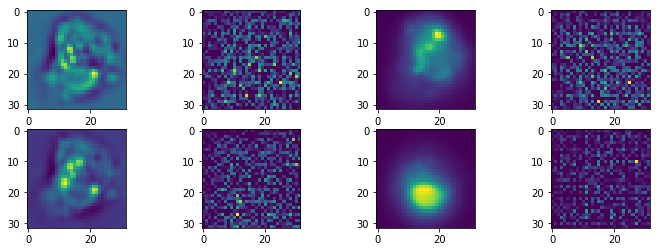

(4, 256, 128)
Epoch:  0 Iteration:  100 Loss:  1427.6785
(32, 32, 4) (4, 32, 32, 1)


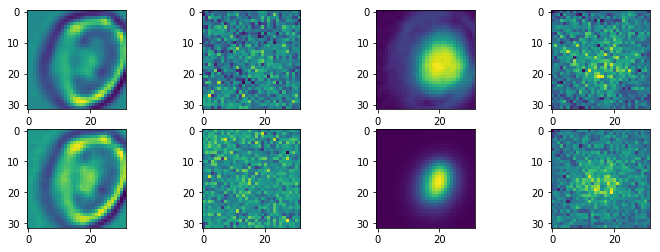

(4, 256, 128)
Epoch:  0 Iteration:  200 Loss:  1531.6272
(32, 32, 4) (4, 32, 32, 1)


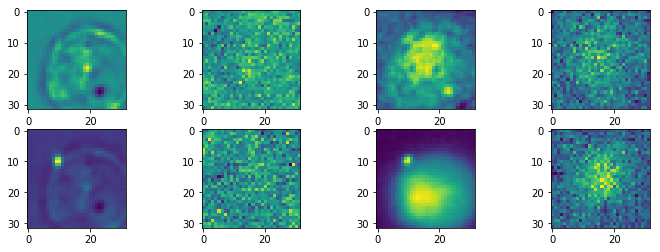

(4, 256, 128)
Epoch:  0 Iteration:  300 Loss:  1024.1184
(32, 32, 4) (4, 32, 32, 1)


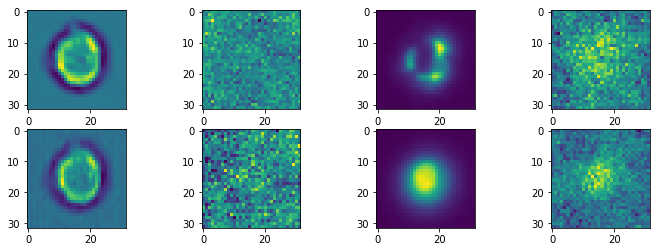

(4, 256, 128)
Epoch:  0 Iteration:  400 Loss:  990.49304
(32, 32, 4) (4, 32, 32, 1)


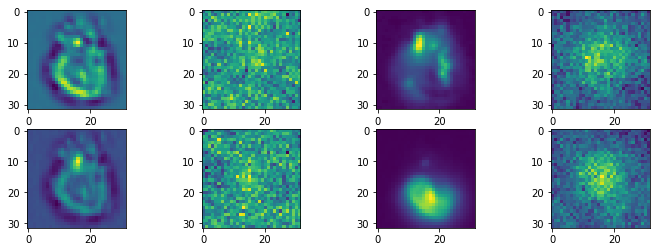

(4, 256, 128)
Epoch:  0 Iteration:  500 Loss:  892.7392
(32, 32, 4) (4, 32, 32, 1)


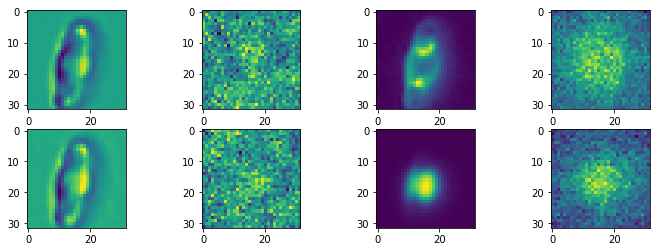

(4, 256, 128)
Epoch:  0 Iteration:  600 Loss:  877.62915
(32, 32, 4) (4, 32, 32, 1)


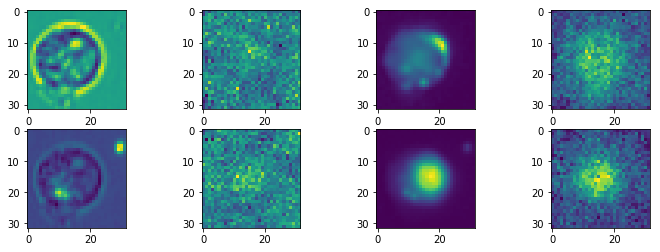

(4, 256, 128)
Epoch:  0 Iteration:  700 Loss:  850.646
(32, 32, 4) (4, 32, 32, 1)


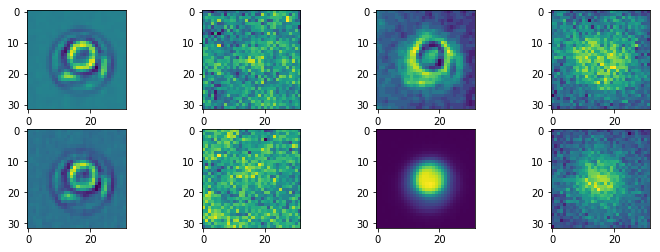

(4, 256, 128)
Epoch:  1 Iteration:  0 Loss:  858.74115
(32, 32, 4) (4, 32, 32, 1)


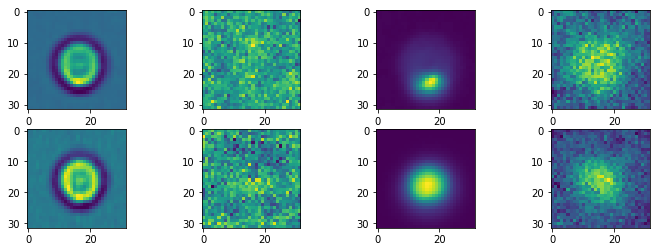

(4, 256, 128)
Epoch:  1 Iteration:  100 Loss:  828.077
(32, 32, 4) (4, 32, 32, 1)


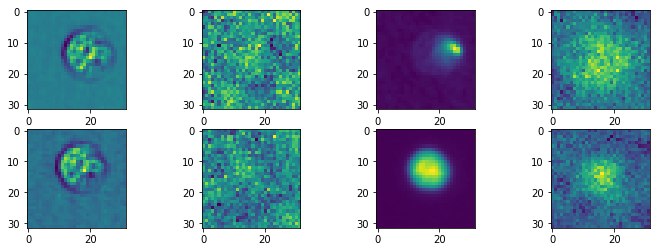

(4, 256, 128)
Epoch:  1 Iteration:  200 Loss:  801.37305
(32, 32, 4) (4, 32, 32, 1)


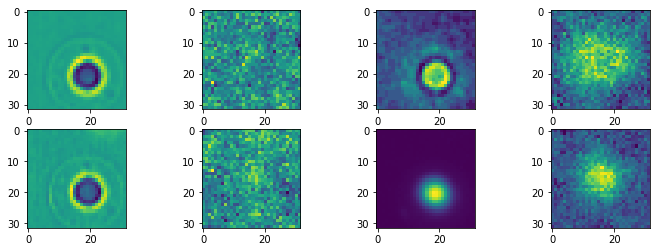

(4, 256, 128)
Epoch:  1 Iteration:  300 Loss:  733.18524
(32, 32, 4) (4, 32, 32, 1)


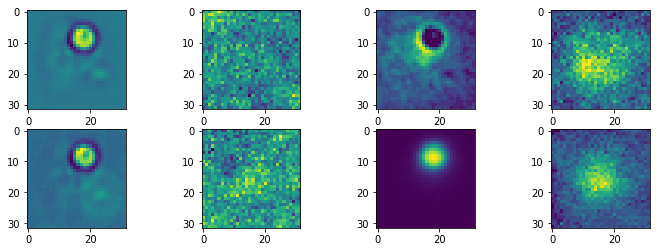

(4, 256, 128)
Epoch:  1 Iteration:  400 Loss:  764.6406
(32, 32, 4) (4, 32, 32, 1)


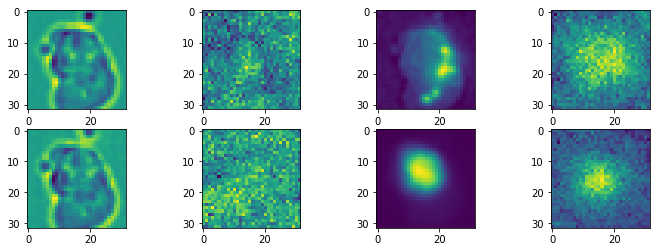

(4, 256, 128)
Epoch:  1 Iteration:  500 Loss:  735.1293
(32, 32, 4) (4, 32, 32, 1)


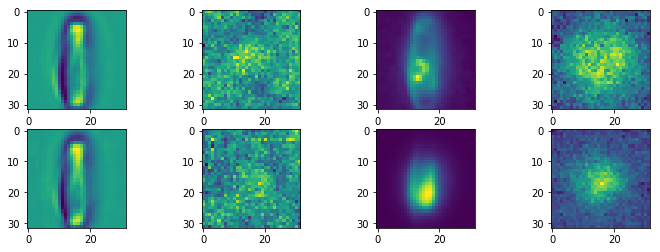

(4, 256, 128)
Epoch:  1 Iteration:  600 Loss:  738.64264
(32, 32, 4) (4, 32, 32, 1)


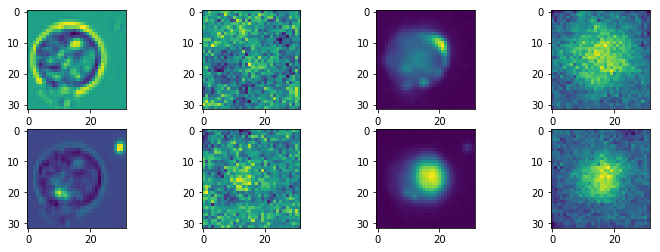

(4, 256, 128)
Epoch:  1 Iteration:  700 Loss:  712.3136
(32, 32, 4) (4, 32, 32, 1)


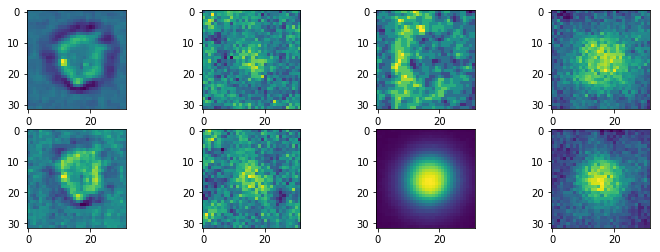

(4, 256, 128)
Epoch:  2 Iteration:  0 Loss:  715.2802
(32, 32, 4) (4, 32, 32, 1)


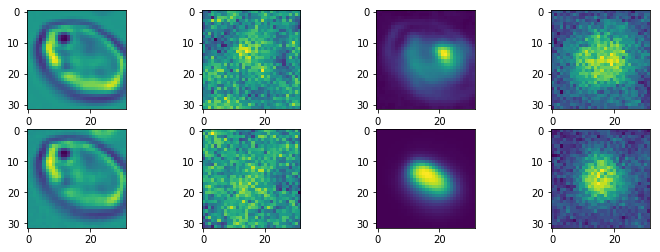

(4, 256, 128)
Epoch:  2 Iteration:  100 Loss:  691.46594
(32, 32, 4) (4, 32, 32, 1)


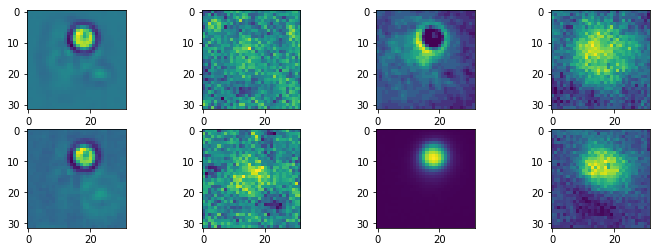

(4, 256, 128)
Epoch:  2 Iteration:  200 Loss:  665.09436
(32, 32, 4) (4, 32, 32, 1)


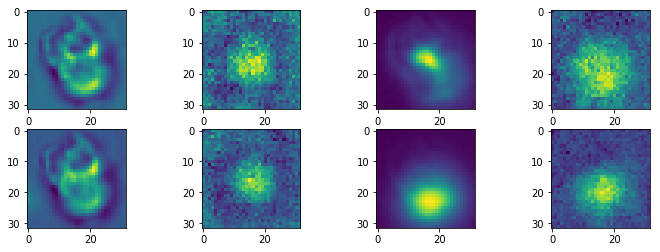

(4, 256, 128)
Epoch:  2 Iteration:  300 Loss:  613.3884
(32, 32, 4) (4, 32, 32, 1)


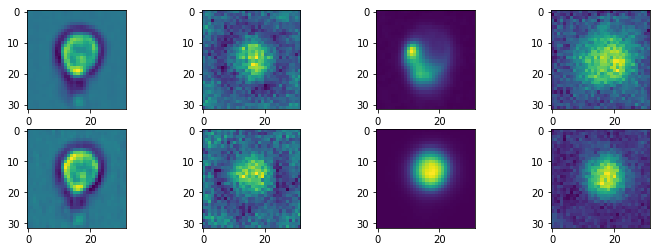

(4, 256, 128)
Epoch:  2 Iteration:  400 Loss:  632.1443
(32, 32, 4) (4, 32, 32, 1)


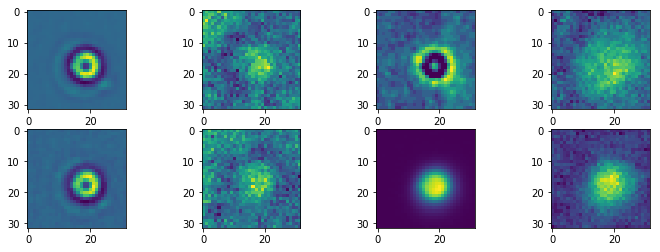

(4, 256, 128)
Epoch:  2 Iteration:  500 Loss:  595.933
(32, 32, 4) (4, 32, 32, 1)


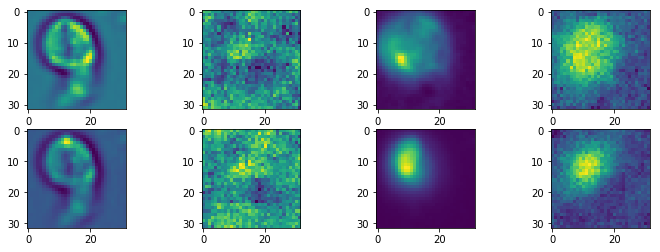

(4, 256, 128)
Epoch:  2 Iteration:  600 Loss:  595.1293
(32, 32, 4) (4, 32, 32, 1)


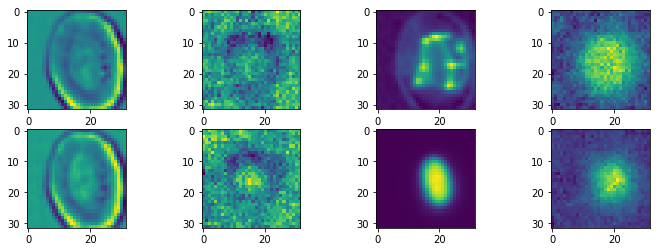

(4, 256, 128)
Epoch:  2 Iteration:  700 Loss:  580.6344
(32, 32, 4) (4, 32, 32, 1)


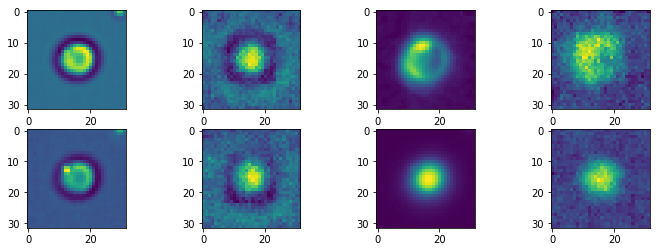

(4, 256, 128)
Epoch:  3 Iteration:  0 Loss:  578.5945
(32, 32, 4) (4, 32, 32, 1)


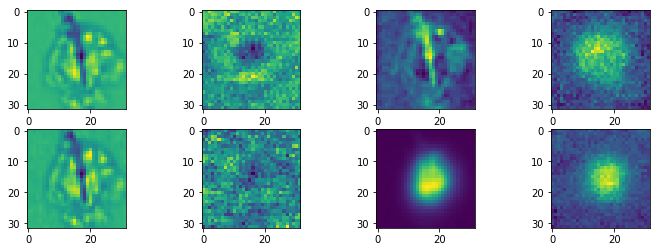

(4, 256, 128)
Epoch:  3 Iteration:  100 Loss:  556.3795
(32, 32, 4) (4, 32, 32, 1)


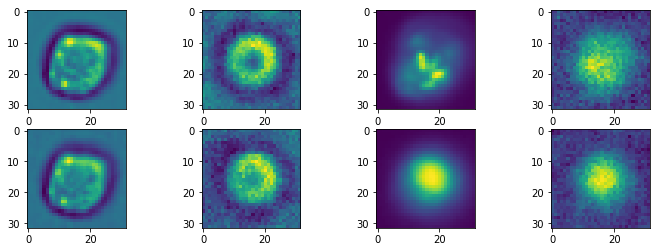

(4, 256, 128)
Epoch:  3 Iteration:  200 Loss:  533.8437
(32, 32, 4) (4, 32, 32, 1)


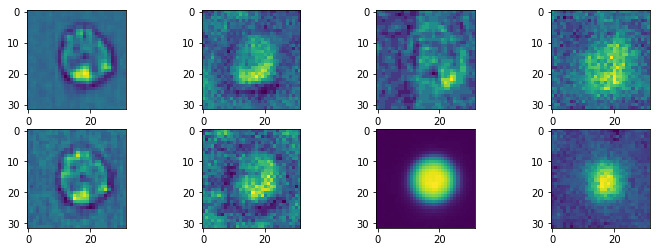

(4, 256, 128)
Epoch:  3 Iteration:  300 Loss:  492.7601
(32, 32, 4) (4, 32, 32, 1)


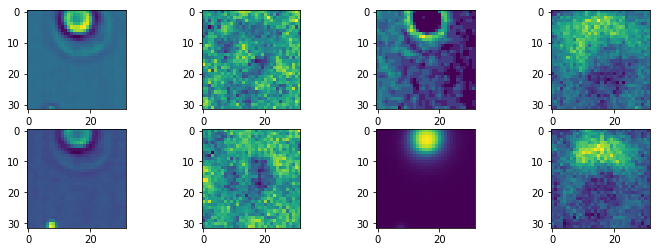

(4, 256, 128)
Epoch:  3 Iteration:  400 Loss:  505.3806
(32, 32, 4) (4, 32, 32, 1)


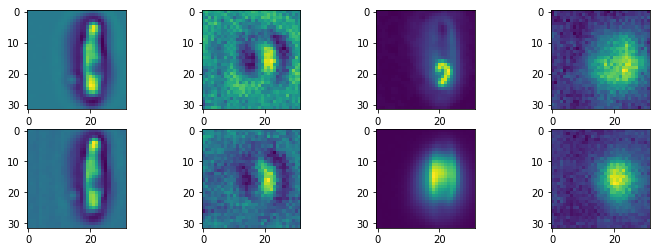

(4, 256, 128)
Epoch:  3 Iteration:  500 Loss:  486.08344
(32, 32, 4) (4, 32, 32, 1)


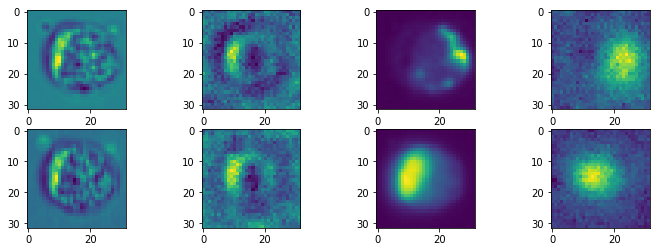

(4, 256, 128)
Epoch:  3 Iteration:  600 Loss:  488.60028
(32, 32, 4) (4, 32, 32, 1)


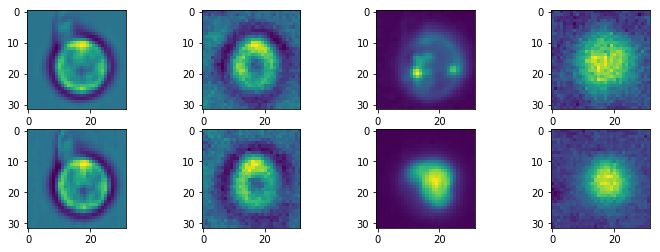

(4, 256, 128)
Epoch:  3 Iteration:  700 Loss:  475.45837
(32, 32, 4) (4, 32, 32, 1)


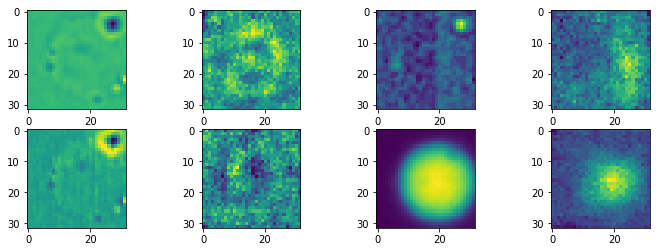

(4, 256, 128)
Epoch:  4 Iteration:  0 Loss:  477.06055
(32, 32, 4) (4, 32, 32, 1)


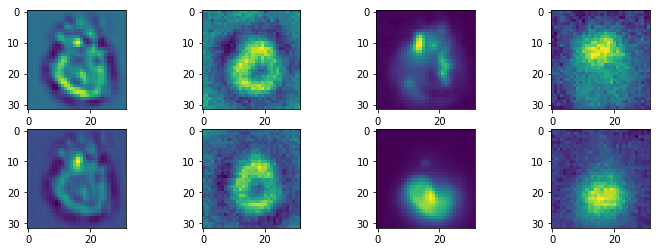

(4, 256, 128)
Epoch:  4 Iteration:  100 Loss:  460.86664
(32, 32, 4) (4, 32, 32, 1)


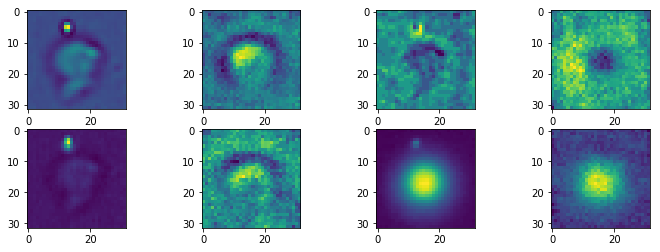

(4, 256, 128)
Epoch:  4 Iteration:  200 Loss:  444.31323
(32, 32, 4) (4, 32, 32, 1)


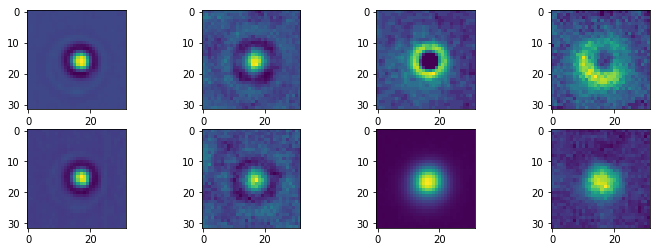

(4, 256, 128)
Epoch:  4 Iteration:  300 Loss:  421.61163
(32, 32, 4) (4, 32, 32, 1)


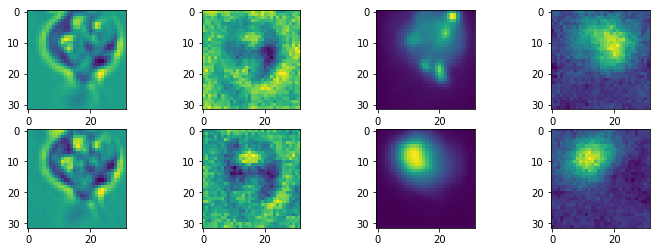

(4, 256, 128)
Epoch:  4 Iteration:  400 Loss:  428.12253
(32, 32, 4) (4, 32, 32, 1)


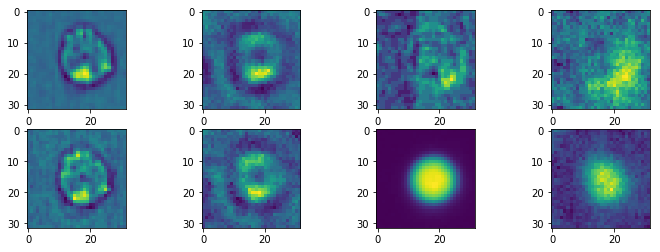

(4, 256, 128)
Epoch:  4 Iteration:  500 Loss:  416.2848
(32, 32, 4) (4, 32, 32, 1)


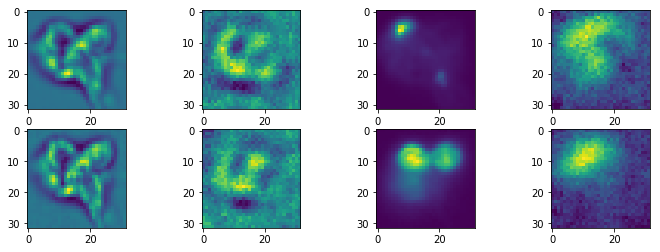

(4, 256, 128)
Epoch:  4 Iteration:  600 Loss:  421.72815
(32, 32, 4) (4, 32, 32, 1)


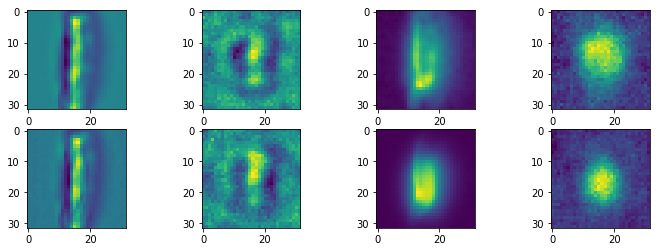

(4, 256, 128)
Epoch:  4 Iteration:  700 Loss:  422.14337
(32, 32, 4) (4, 32, 32, 1)


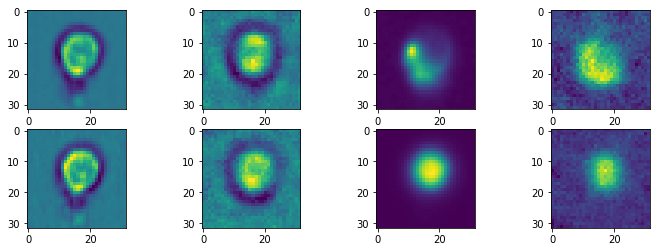

(4, 256, 128)
Epoch:  5 Iteration:  0 Loss:  412.6573
(32, 32, 4) (4, 32, 32, 1)


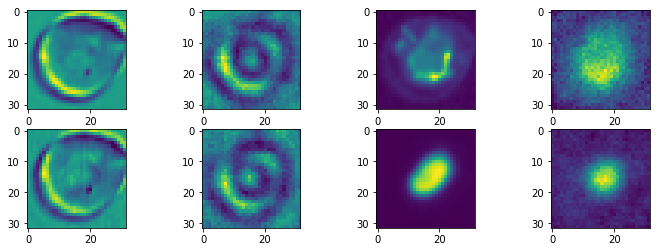

(4, 256, 128)
Epoch:  5 Iteration:  100 Loss:  403.33252
(32, 32, 4) (4, 32, 32, 1)


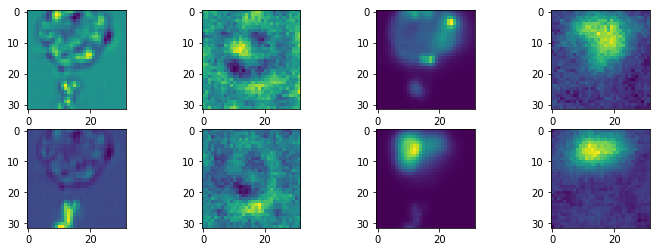

(4, 256, 128)
Epoch:  5 Iteration:  200 Loss:  392.1373
(32, 32, 4) (4, 32, 32, 1)


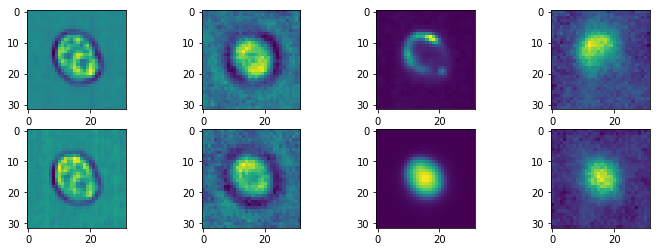

(4, 256, 128)
Epoch:  5 Iteration:  300 Loss:  369.8053
(32, 32, 4) (4, 32, 32, 1)


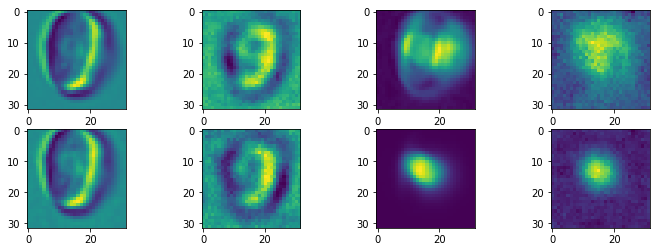

(4, 256, 128)
Epoch:  5 Iteration:  400 Loss:  379.9463
(32, 32, 4) (4, 32, 32, 1)


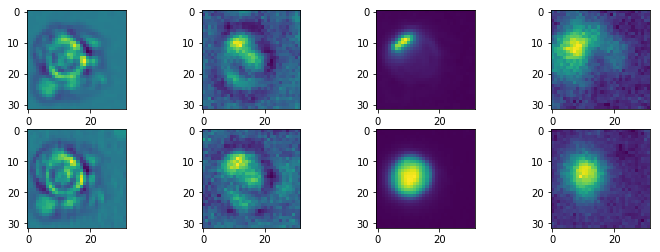

(4, 256, 128)
Epoch:  5 Iteration:  500 Loss:  371.8348
(32, 32, 4) (4, 32, 32, 1)


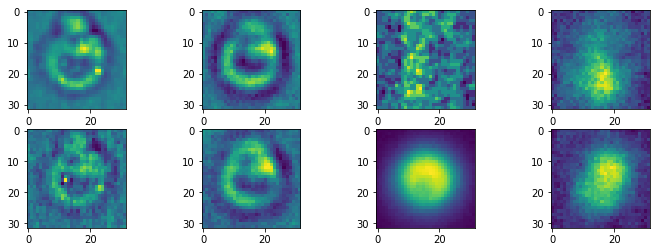

(4, 256, 128)
Epoch:  5 Iteration:  600 Loss:  382.59674
(32, 32, 4) (4, 32, 32, 1)


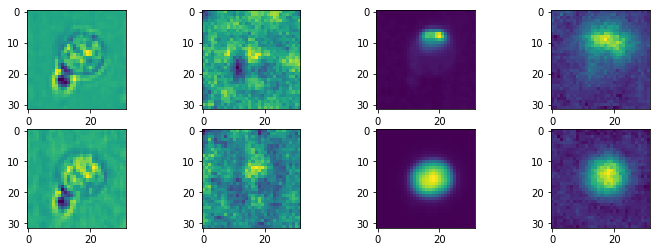

(4, 256, 128)
Epoch:  5 Iteration:  700 Loss:  373.34845
(32, 32, 4) (4, 32, 32, 1)


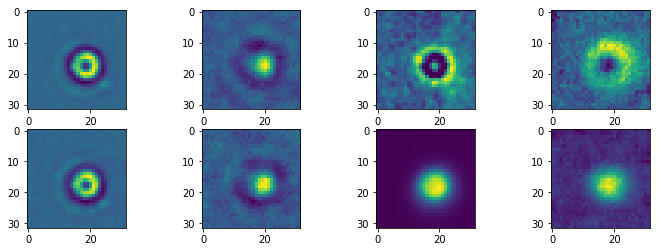

(4, 256, 128)
Epoch:  6 Iteration:  0 Loss:  367.93878
(32, 32, 4) (4, 32, 32, 1)


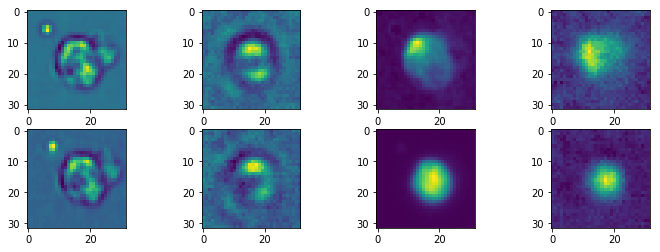

(4, 256, 128)
Epoch:  6 Iteration:  100 Loss:  361.92178
(32, 32, 4) (4, 32, 32, 1)


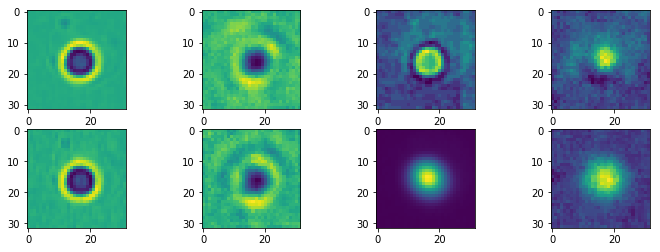

(4, 256, 128)
Epoch:  6 Iteration:  200 Loss:  357.662
(32, 32, 4) (4, 32, 32, 1)


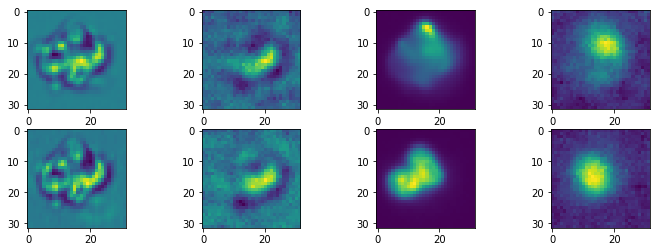

(4, 256, 128)
Epoch:  6 Iteration:  300 Loss:  335.43933
(32, 32, 4) (4, 32, 32, 1)


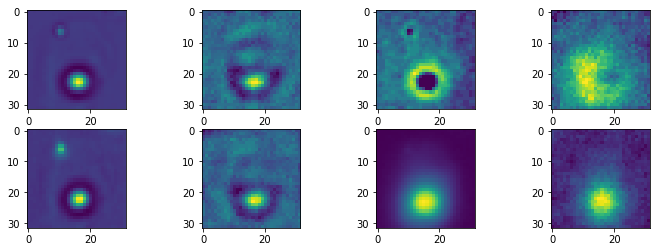

(4, 256, 128)
Epoch:  6 Iteration:  400 Loss:  342.51996
(32, 32, 4) (4, 32, 32, 1)


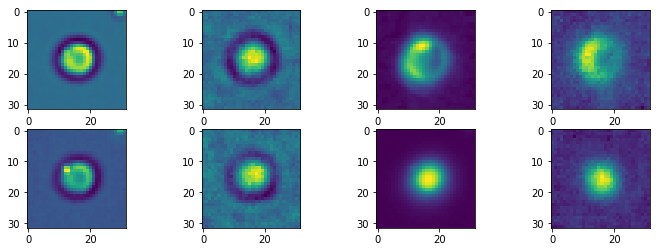

(4, 256, 128)
Epoch:  6 Iteration:  500 Loss:  337.33597
(32, 32, 4) (4, 32, 32, 1)


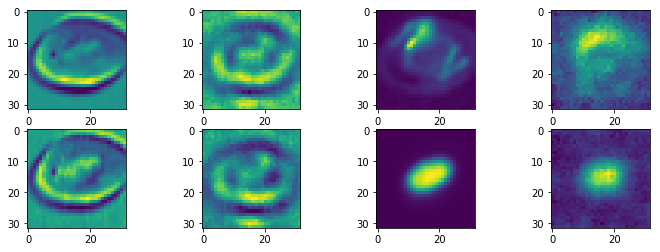

(4, 256, 128)
Epoch:  6 Iteration:  600 Loss:  348.4059
(32, 32, 4) (4, 32, 32, 1)


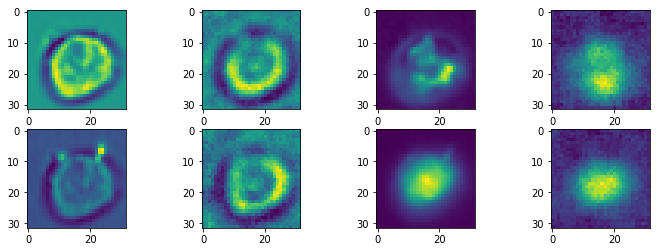

(4, 256, 128)
Epoch:  6 Iteration:  700 Loss:  342.0918
(32, 32, 4) (4, 32, 32, 1)


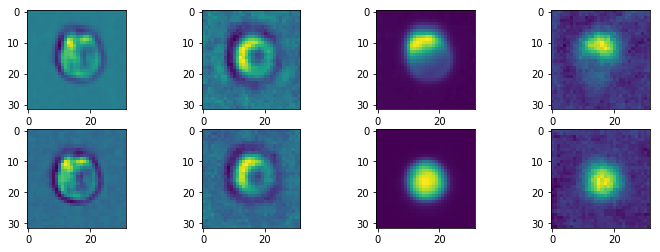

(4, 256, 128)
Epoch:  7 Iteration:  0 Loss:  334.95258
(32, 32, 4) (4, 32, 32, 1)


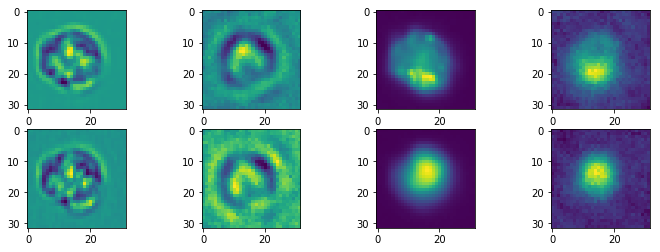

(4, 256, 128)
Epoch:  7 Iteration:  100 Loss:  330.9254
(32, 32, 4) (4, 32, 32, 1)


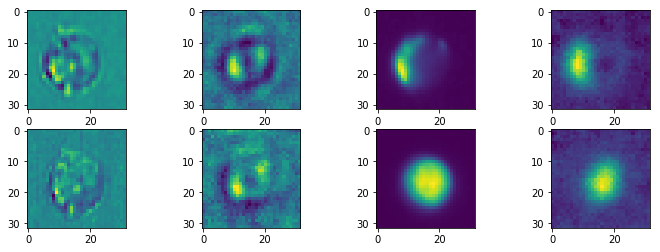

(4, 256, 128)
Epoch:  7 Iteration:  200 Loss:  327.4019
(32, 32, 4) (4, 32, 32, 1)


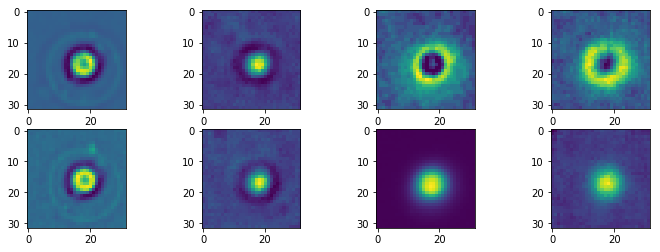

(4, 256, 128)
Epoch:  7 Iteration:  300 Loss:  310.4246
(32, 32, 4) (4, 32, 32, 1)


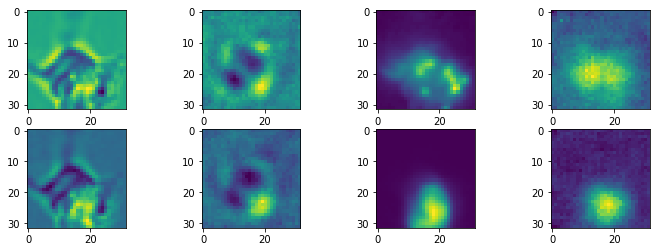

(4, 256, 128)
Epoch:  7 Iteration:  400 Loss:  316.982
(32, 32, 4) (4, 32, 32, 1)


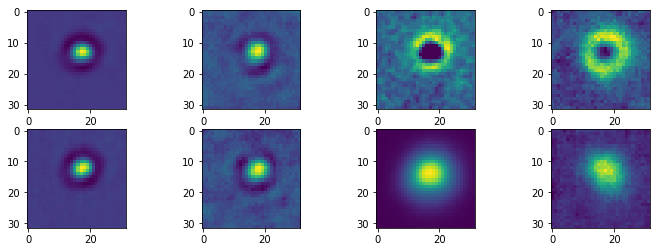

(4, 256, 128)
Epoch:  7 Iteration:  500 Loss:  312.40265
(32, 32, 4) (4, 32, 32, 1)


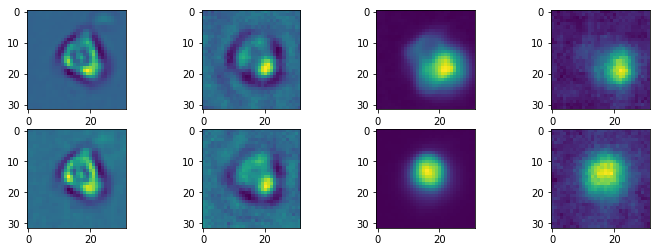

(4, 256, 128)
Epoch:  7 Iteration:  600 Loss:  320.77386
(32, 32, 4) (4, 32, 32, 1)


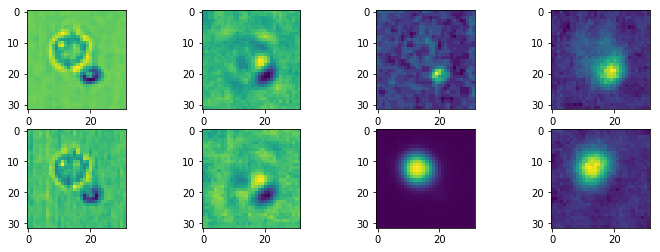

(4, 256, 128)
Epoch:  7 Iteration:  700 Loss:  313.39062
(32, 32, 4) (4, 32, 32, 1)


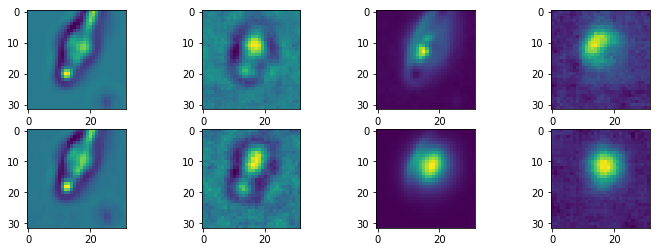

(4, 256, 128)
Epoch:  8 Iteration:  0 Loss:  312.98035
(32, 32, 4) (4, 32, 32, 1)


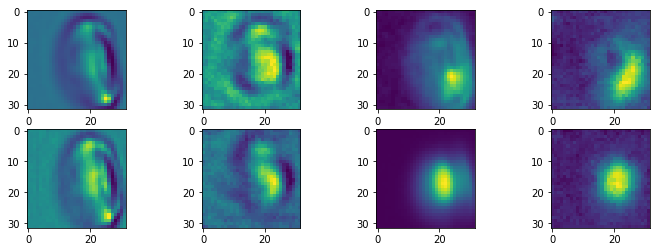

(4, 256, 128)
Epoch:  8 Iteration:  100 Loss:  305.54388
(32, 32, 4) (4, 32, 32, 1)


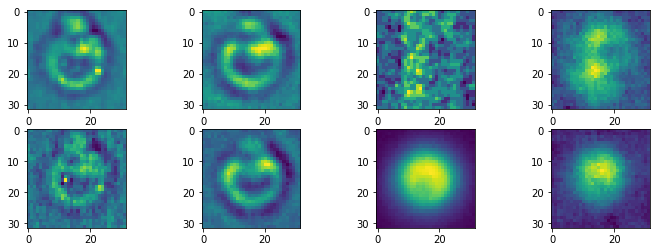

(4, 256, 128)
Epoch:  8 Iteration:  200 Loss:  300.6891
(32, 32, 4) (4, 32, 32, 1)


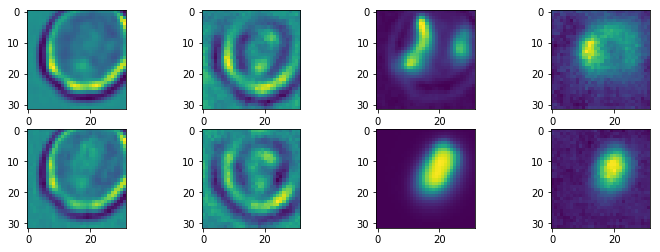

(4, 256, 128)
Epoch:  8 Iteration:  300 Loss:  289.05804
(32, 32, 4) (4, 32, 32, 1)


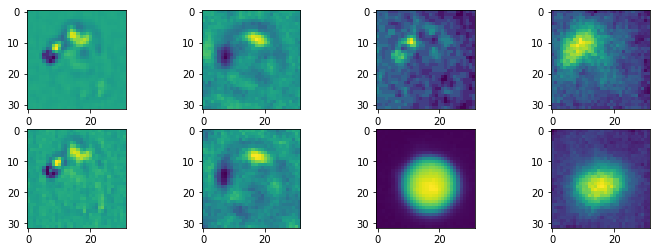

(4, 256, 128)
Epoch:  8 Iteration:  400 Loss:  296.85953
(32, 32, 4) (4, 32, 32, 1)


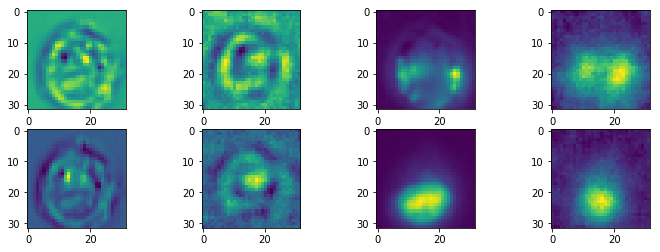

(4, 256, 128)
Epoch:  8 Iteration:  500 Loss:  293.4821
(32, 32, 4) (4, 32, 32, 1)


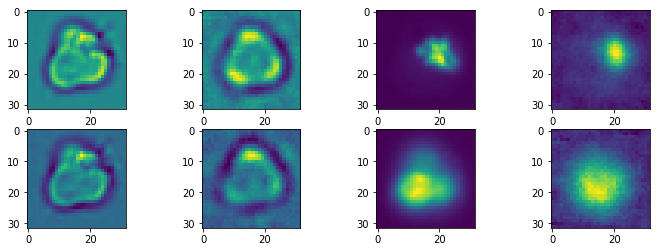

(4, 256, 128)
Epoch:  8 Iteration:  600 Loss:  299.22034
(32, 32, 4) (4, 32, 32, 1)


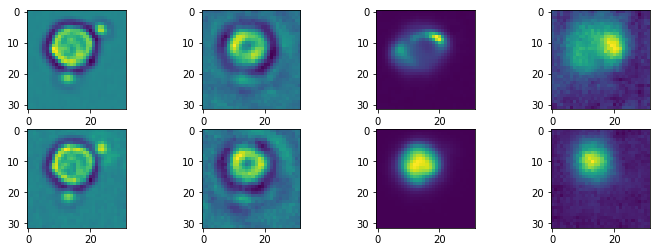

(4, 256, 128)
Epoch:  8 Iteration:  700 Loss:  297.2298
(32, 32, 4) (4, 32, 32, 1)


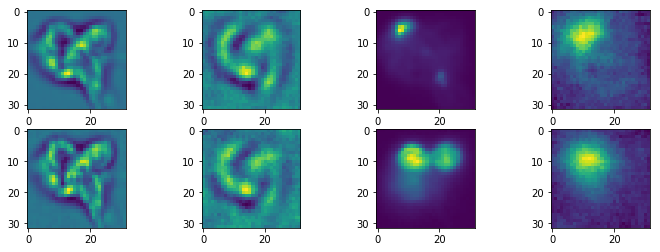

(4, 256, 128)
Epoch:  9 Iteration:  0 Loss:  290.53583
(32, 32, 4) (4, 32, 32, 1)


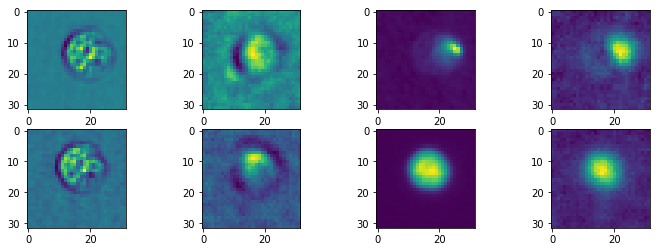

(4, 256, 128)
Epoch:  9 Iteration:  100 Loss:  288.58948
(32, 32, 4) (4, 32, 32, 1)


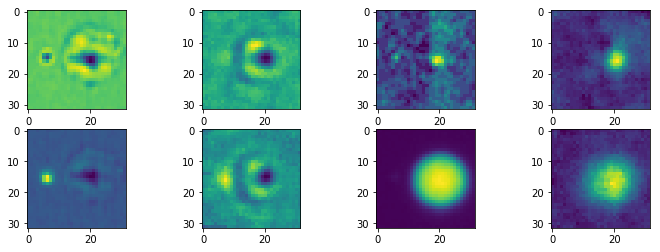

(4, 256, 128)
Epoch:  9 Iteration:  200 Loss:  279.90533
(32, 32, 4) (4, 32, 32, 1)


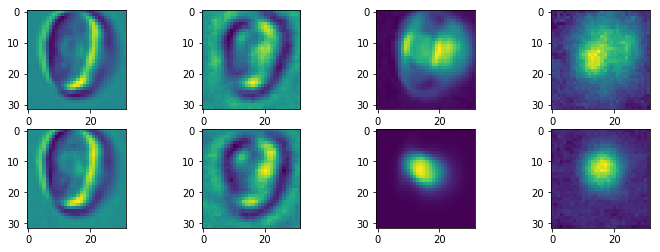

(4, 256, 128)
Epoch:  9 Iteration:  300 Loss:  276.5589
(32, 32, 4) (4, 32, 32, 1)


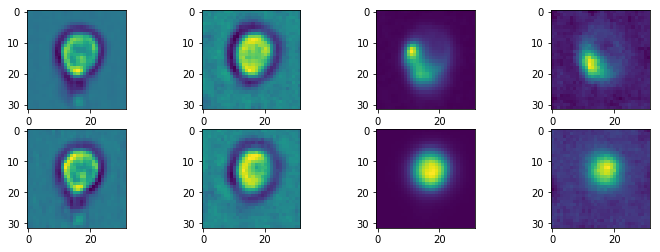

(4, 256, 128)
Epoch:  9 Iteration:  400 Loss:  275.61795
(32, 32, 4) (4, 32, 32, 1)


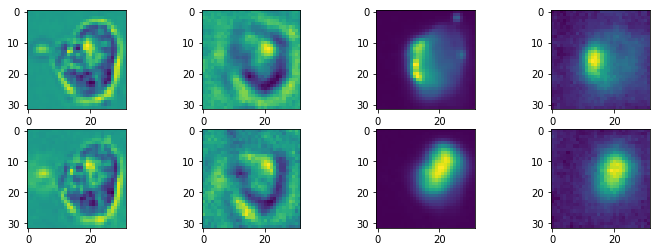

(4, 256, 128)
Epoch:  9 Iteration:  500 Loss:  275.77368
(32, 32, 4) (4, 32, 32, 1)


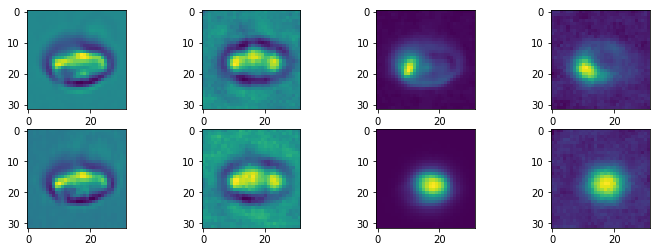

(4, 256, 128)
Epoch:  9 Iteration:  600 Loss:  283.08856
(32, 32, 4) (4, 32, 32, 1)


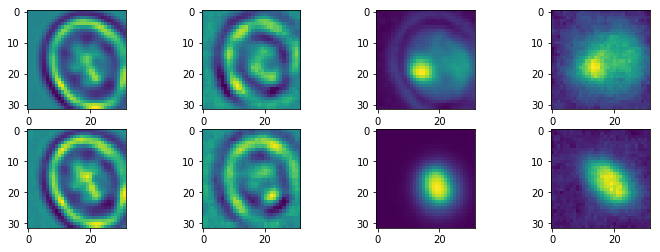

(4, 256, 128)
Epoch:  9 Iteration:  700 Loss:  274.00366
(32, 32, 4) (4, 32, 32, 1)


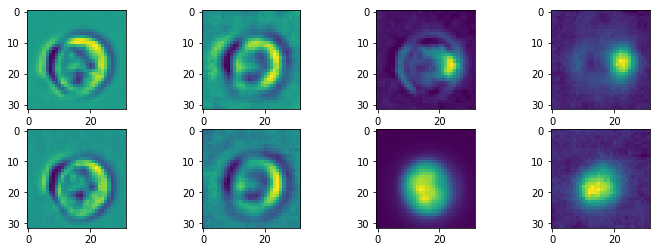

(4, 256, 128)
Epoch:  10 Iteration:  0 Loss:  272.4368
(32, 32, 4) (4, 32, 32, 1)


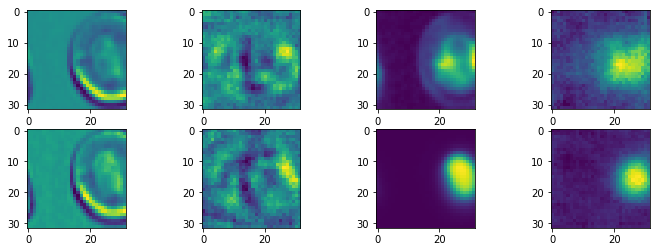

(4, 256, 128)
Epoch:  10 Iteration:  100 Loss:  269.11725
(32, 32, 4) (4, 32, 32, 1)


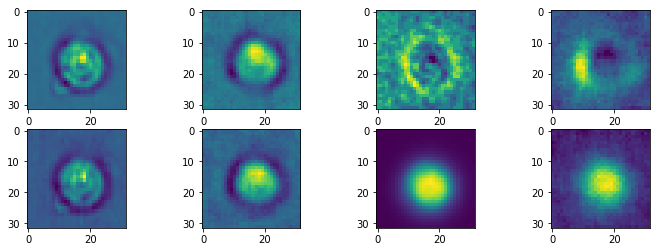

(4, 256, 128)
Epoch:  10 Iteration:  200 Loss:  262.88318
(32, 32, 4) (4, 32, 32, 1)


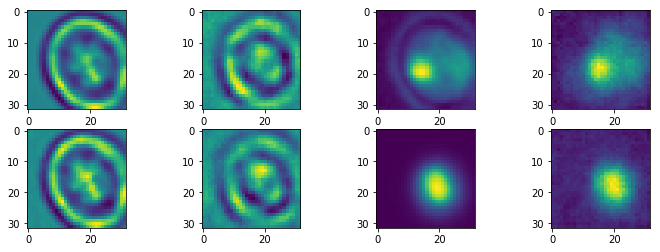

(4, 256, 128)
Epoch:  10 Iteration:  300 Loss:  262.65265
(32, 32, 4) (4, 32, 32, 1)


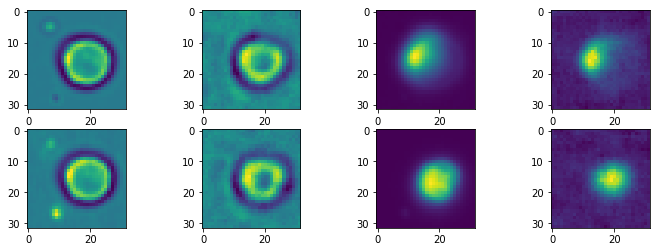

(4, 256, 128)
Epoch:  10 Iteration:  400 Loss:  261.79724
(32, 32, 4) (4, 32, 32, 1)


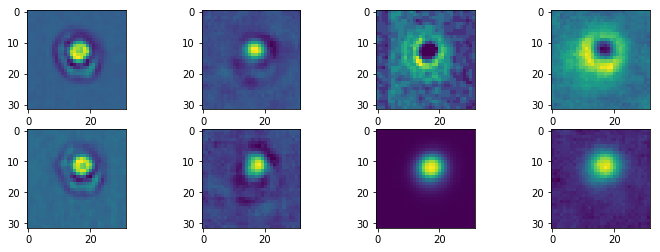

(4, 256, 128)
Epoch:  10 Iteration:  500 Loss:  259.5508
(32, 32, 4) (4, 32, 32, 1)


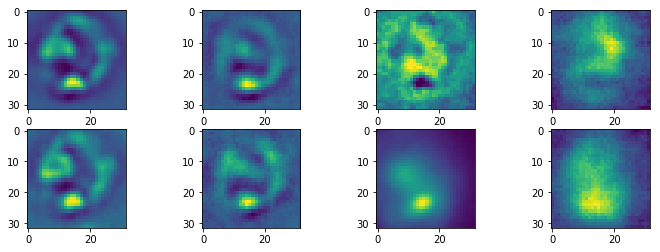

(4, 256, 128)
Epoch:  10 Iteration:  600 Loss:  264.7442
(32, 32, 4) (4, 32, 32, 1)


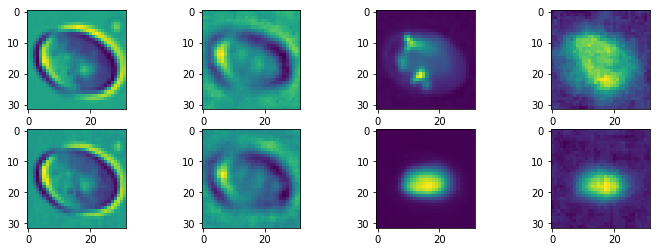

(4, 256, 128)
Epoch:  10 Iteration:  700 Loss:  261.8545
(32, 32, 4) (4, 32, 32, 1)


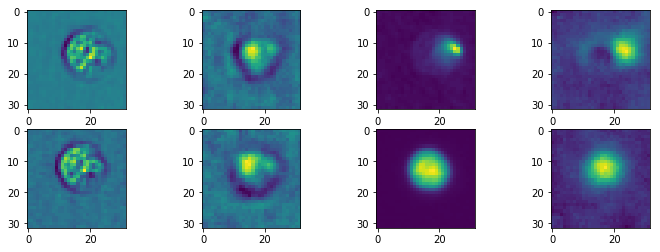

(4, 256, 128)
Epoch:  11 Iteration:  0 Loss:  257.62973
(32, 32, 4) (4, 32, 32, 1)


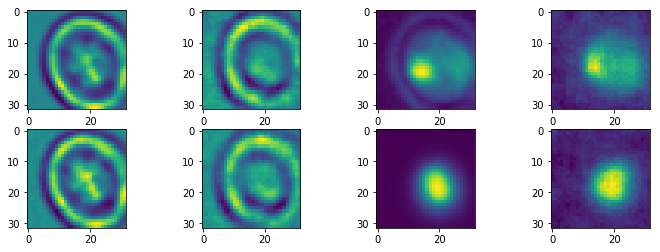

(4, 256, 128)
Epoch:  11 Iteration:  100 Loss:  250.41739
(32, 32, 4) (4, 32, 32, 1)


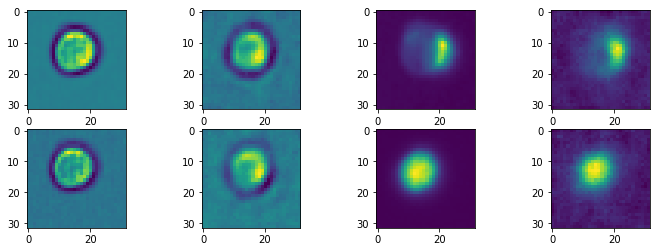

(4, 256, 128)
Epoch:  11 Iteration:  200 Loss:  250.79645
(32, 32, 4) (4, 32, 32, 1)


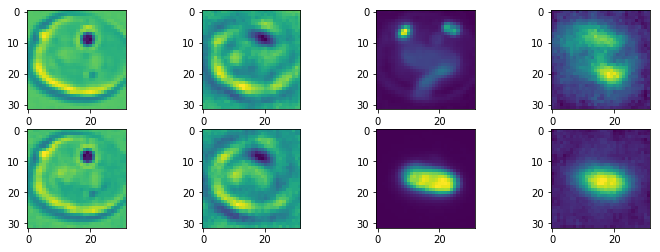

(4, 256, 128)
Epoch:  11 Iteration:  300 Loss:  247.0543
(32, 32, 4) (4, 32, 32, 1)


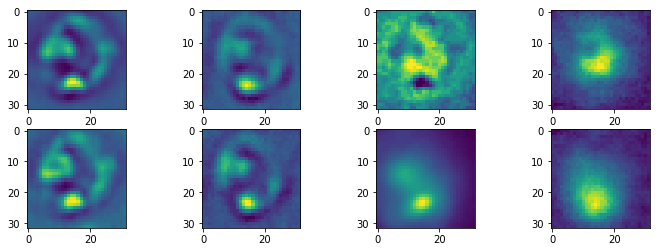

(4, 256, 128)
Epoch:  11 Iteration:  400 Loss:  249.51814
(32, 32, 4) (4, 32, 32, 1)


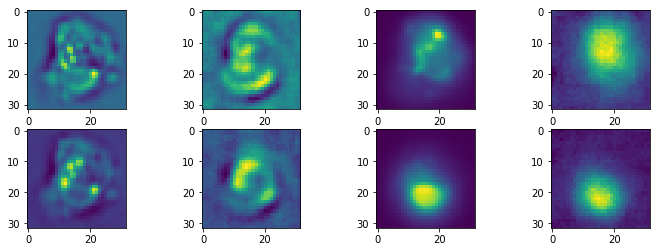

(4, 256, 128)
Epoch:  11 Iteration:  500 Loss:  247.34087
(32, 32, 4) (4, 32, 32, 1)


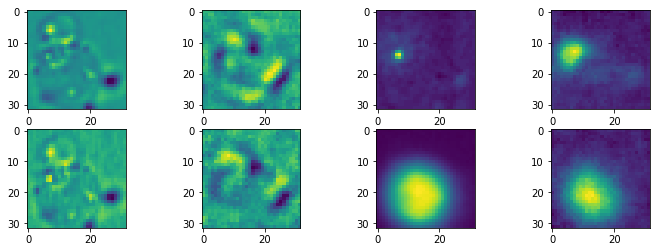

(4, 256, 128)
Epoch:  11 Iteration:  600 Loss:  254.85983
(32, 32, 4) (4, 32, 32, 1)


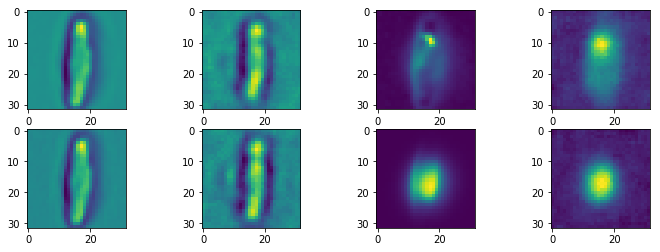

(4, 256, 128)
Epoch:  11 Iteration:  700 Loss:  249.07123
(32, 32, 4) (4, 32, 32, 1)


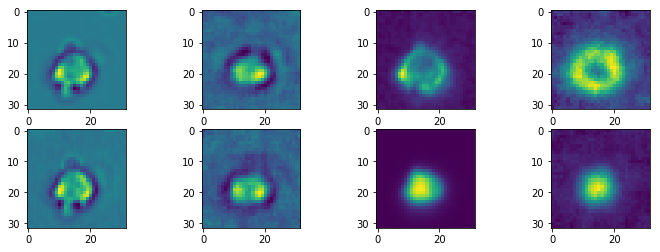

(4, 256, 128)
Epoch:  12 Iteration:  0 Loss:  246.7559
(32, 32, 4) (4, 32, 32, 1)


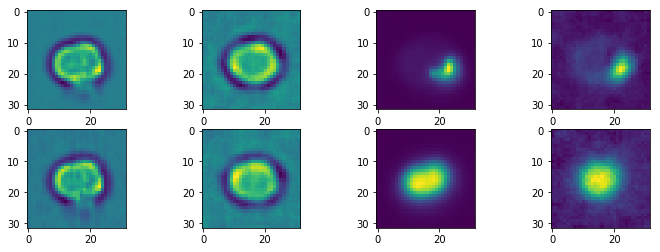

(4, 256, 128)
Epoch:  12 Iteration:  100 Loss:  242.84909
(32, 32, 4) (4, 32, 32, 1)


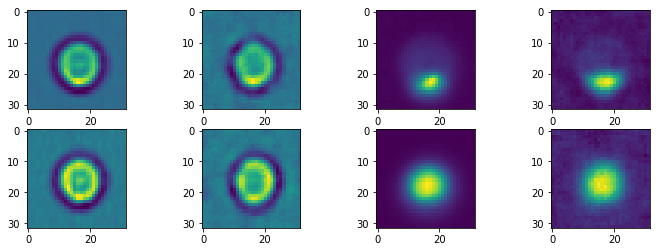

(4, 256, 128)
Epoch:  12 Iteration:  200 Loss:  238.23016
(32, 32, 4) (4, 32, 32, 1)


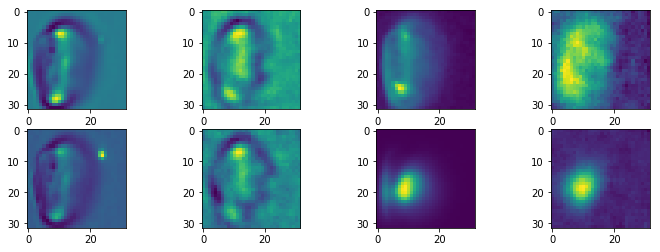

(4, 256, 128)
Epoch:  12 Iteration:  300 Loss:  238.04381
(32, 32, 4) (4, 32, 32, 1)


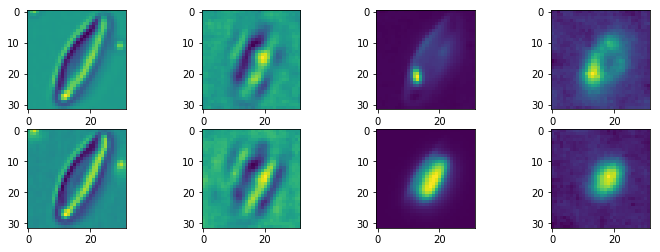

(4, 256, 128)
Epoch:  12 Iteration:  400 Loss:  236.48318
(32, 32, 4) (4, 32, 32, 1)


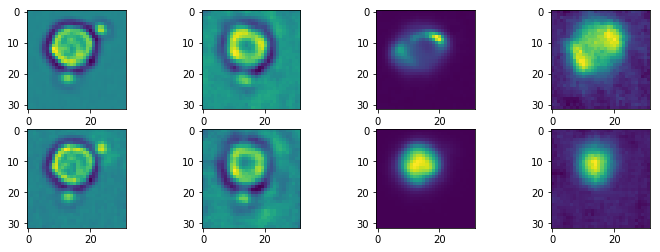

(4, 256, 128)
Epoch:  12 Iteration:  500 Loss:  237.39886
(32, 32, 4) (4, 32, 32, 1)


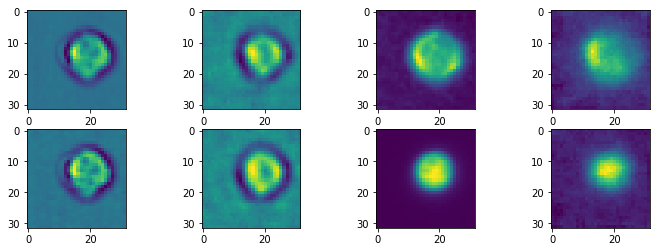

(4, 256, 128)
Epoch:  12 Iteration:  600 Loss:  243.48611
(32, 32, 4) (4, 32, 32, 1)


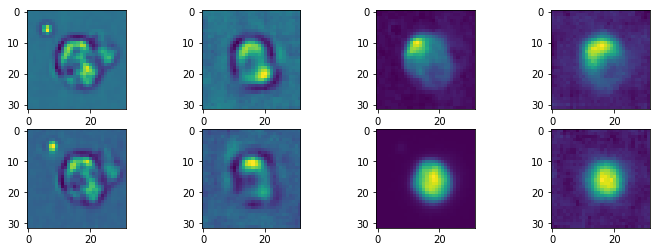

(4, 256, 128)
Epoch:  12 Iteration:  700 Loss:  238.56352
(32, 32, 4) (4, 32, 32, 1)


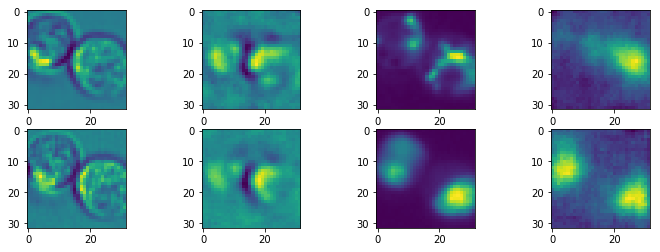

(4, 256, 128)
Epoch:  13 Iteration:  0 Loss:  237.30478
(32, 32, 4) (4, 32, 32, 1)


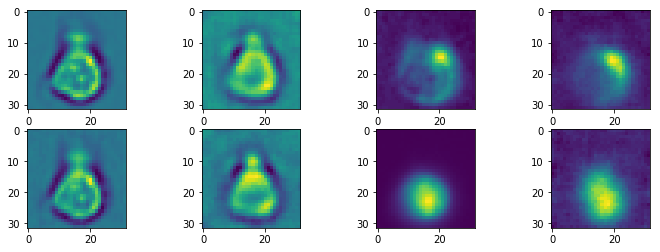

(4, 256, 128)
Epoch:  13 Iteration:  100 Loss:  229.97417
(32, 32, 4) (4, 32, 32, 1)


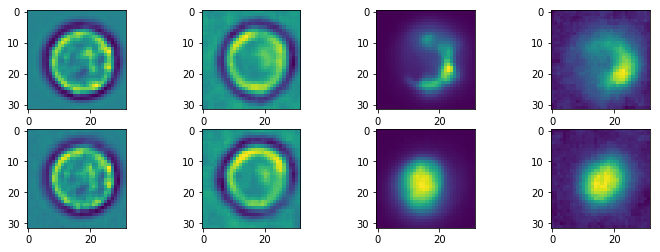

(4, 256, 128)
Epoch:  13 Iteration:  200 Loss:  229.29102
(32, 32, 4) (4, 32, 32, 1)


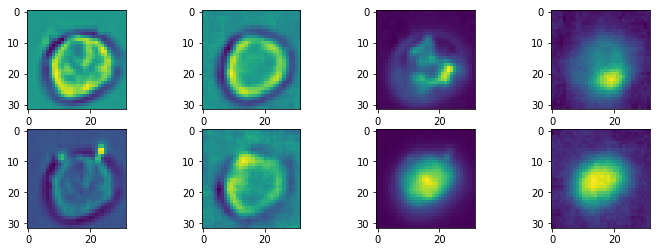

(4, 256, 128)
Epoch:  13 Iteration:  300 Loss:  226.25342
(32, 32, 4) (4, 32, 32, 1)


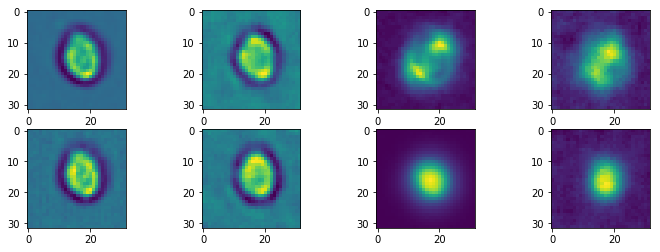

(4, 256, 128)
Epoch:  13 Iteration:  400 Loss:  229.35611
(32, 32, 4) (4, 32, 32, 1)


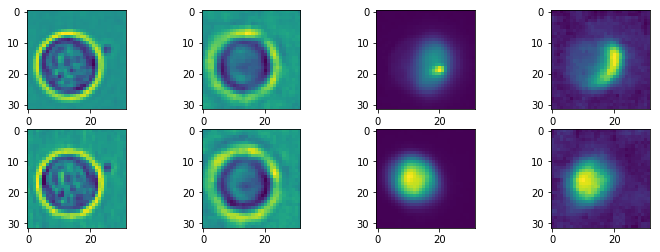

(4, 256, 128)
Epoch:  13 Iteration:  500 Loss:  228.01482
(32, 32, 4) (4, 32, 32, 1)


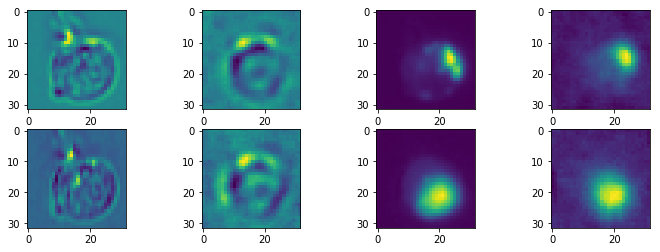

(4, 256, 128)
Epoch:  13 Iteration:  600 Loss:  232.83583
(32, 32, 4) (4, 32, 32, 1)


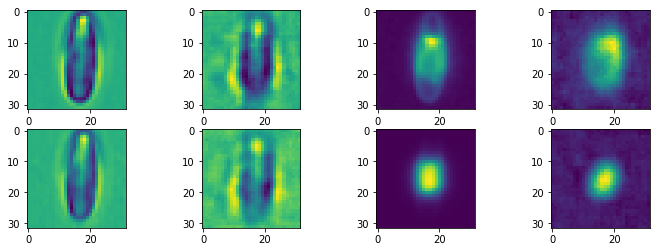

(4, 256, 128)
Epoch:  13 Iteration:  700 Loss:  230.01828
(32, 32, 4) (4, 32, 32, 1)


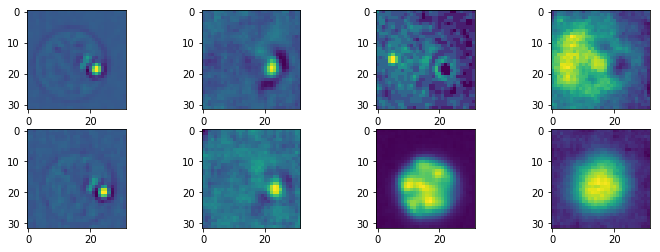

(4, 256, 128)
Epoch:  14 Iteration:  0 Loss:  227.6942
(32, 32, 4) (4, 32, 32, 1)


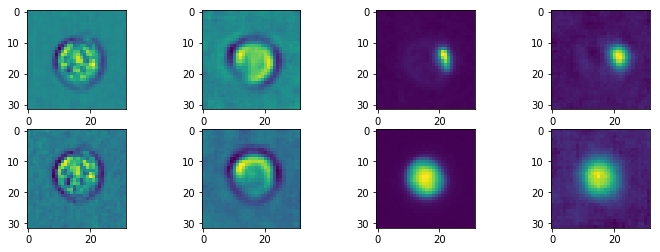

(4, 256, 128)
Epoch:  14 Iteration:  100 Loss:  221.72078
(32, 32, 4) (4, 32, 32, 1)


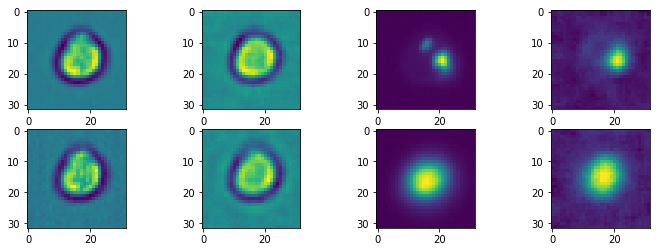

(4, 256, 128)
Epoch:  14 Iteration:  200 Loss:  216.71776
(32, 32, 4) (4, 32, 32, 1)


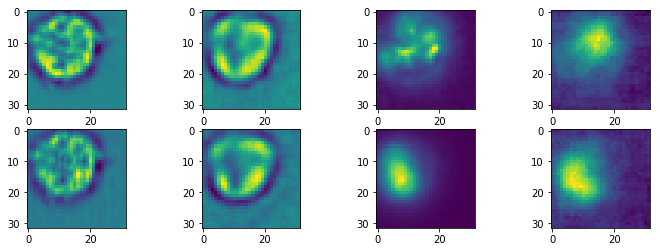

(4, 256, 128)
Epoch:  14 Iteration:  300 Loss:  218.67543
(32, 32, 4) (4, 32, 32, 1)


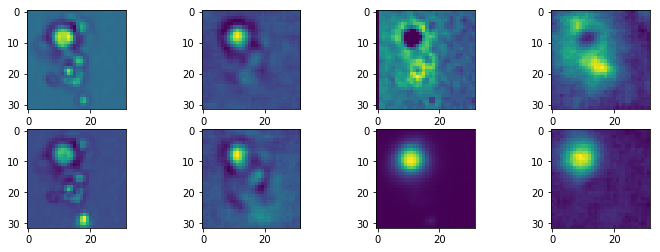

(4, 256, 128)
Epoch:  14 Iteration:  400 Loss:  221.89886
(32, 32, 4) (4, 32, 32, 1)


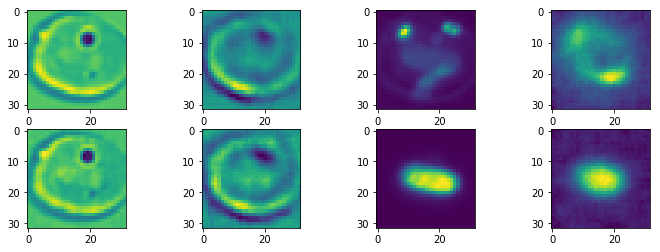

(4, 256, 128)
Epoch:  14 Iteration:  500 Loss:  220.69803
(32, 32, 4) (4, 32, 32, 1)


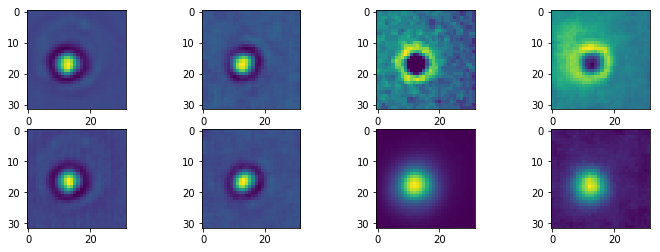

(4, 256, 128)
Epoch:  14 Iteration:  600 Loss:  225.65884
(32, 32, 4) (4, 32, 32, 1)


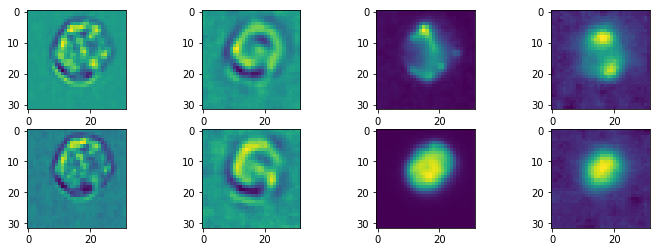

(4, 256, 128)
Epoch:  14 Iteration:  700 Loss:  219.43314
(32, 32, 4) (4, 32, 32, 1)


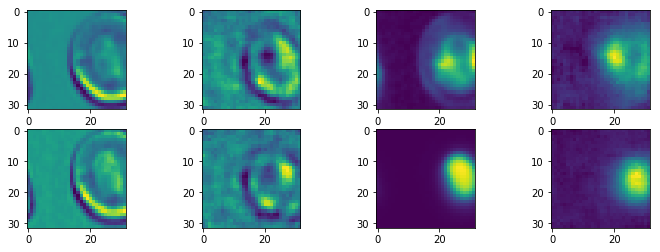

(4, 256, 128)
Epoch:  15 Iteration:  0 Loss:  219.82343
(32, 32, 4) (4, 32, 32, 1)


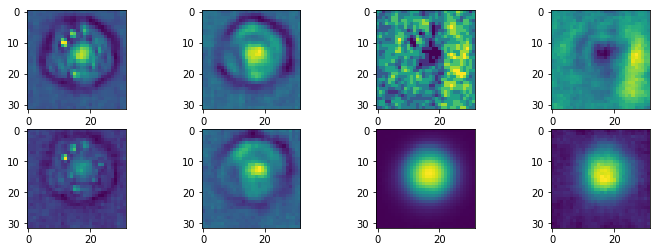

(4, 256, 128)
Epoch:  15 Iteration:  100 Loss:  215.0234
(32, 32, 4) (4, 32, 32, 1)


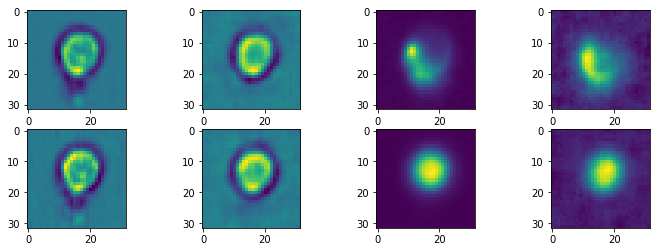

(4, 256, 128)
Epoch:  15 Iteration:  200 Loss:  211.12662
(32, 32, 4) (4, 32, 32, 1)


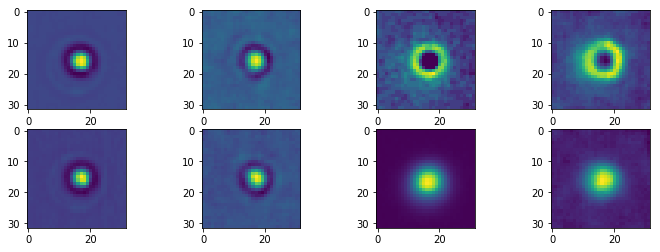

(4, 256, 128)
Epoch:  15 Iteration:  300 Loss:  213.62271
(32, 32, 4) (4, 32, 32, 1)


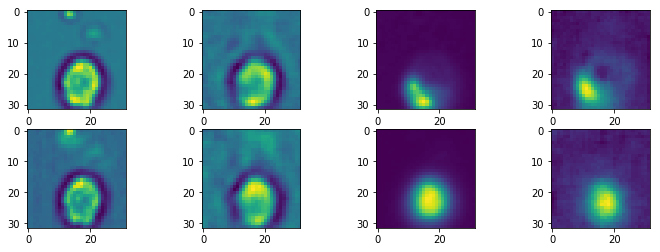

(4, 256, 128)
Epoch:  15 Iteration:  400 Loss:  215.4245
(32, 32, 4) (4, 32, 32, 1)


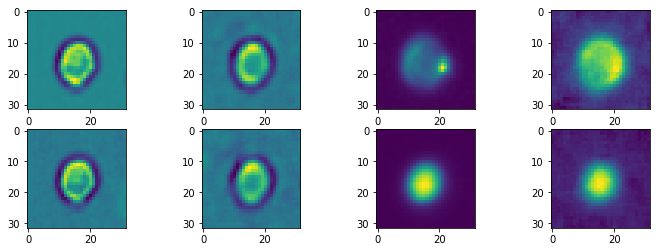

(4, 256, 128)
Epoch:  15 Iteration:  500 Loss:  218.17912
(32, 32, 4) (4, 32, 32, 1)


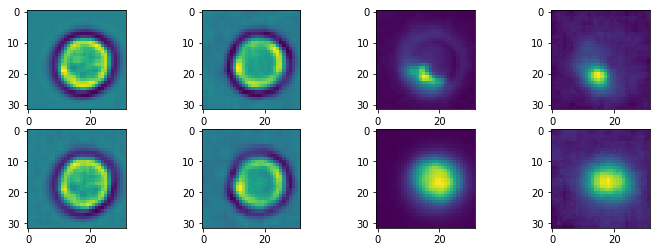

(4, 256, 128)
Epoch:  15 Iteration:  600 Loss:  219.41241
(32, 32, 4) (4, 32, 32, 1)


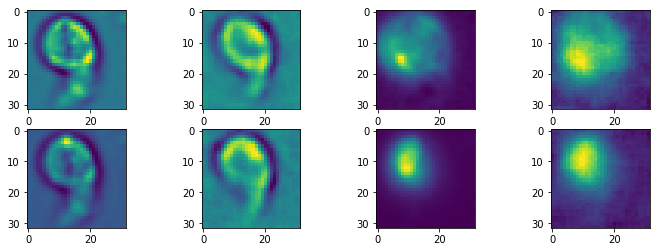

(4, 256, 128)
Epoch:  15 Iteration:  700 Loss:  215.89346
(32, 32, 4) (4, 32, 32, 1)


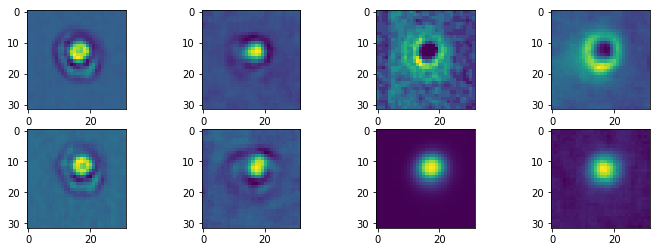

(4, 256, 128)
Epoch:  16 Iteration:  0 Loss:  212.84595
(32, 32, 4) (4, 32, 32, 1)


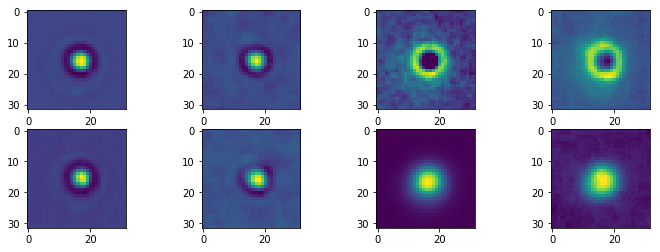

(4, 256, 128)
Epoch:  16 Iteration:  100 Loss:  208.3655
(32, 32, 4) (4, 32, 32, 1)


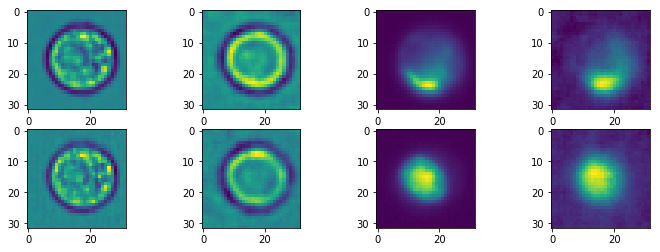

(4, 256, 128)
Epoch:  16 Iteration:  200 Loss:  209.00566
(32, 32, 4) (4, 32, 32, 1)


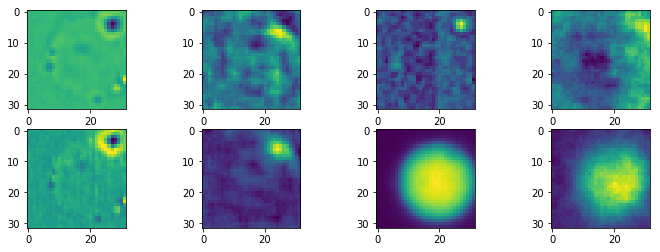

(4, 256, 128)
Epoch:  16 Iteration:  300 Loss:  207.54945
(32, 32, 4) (4, 32, 32, 1)


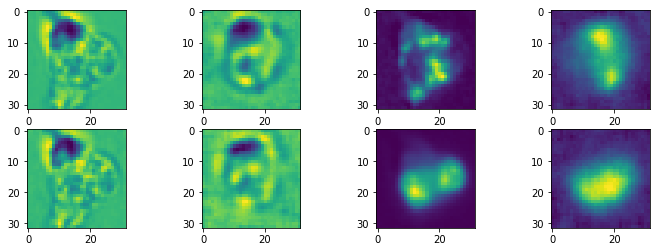

(4, 256, 128)
Epoch:  16 Iteration:  400 Loss:  209.29276
(32, 32, 4) (4, 32, 32, 1)


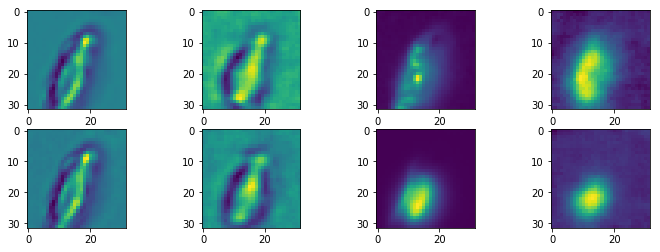

(4, 256, 128)
Epoch:  16 Iteration:  500 Loss:  212.00906
(32, 32, 4) (4, 32, 32, 1)


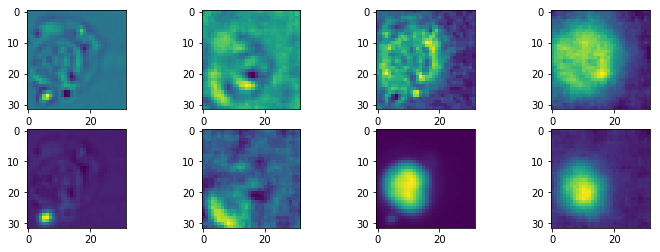

(4, 256, 128)
Epoch:  16 Iteration:  600 Loss:  213.52148
(32, 32, 4) (4, 32, 32, 1)


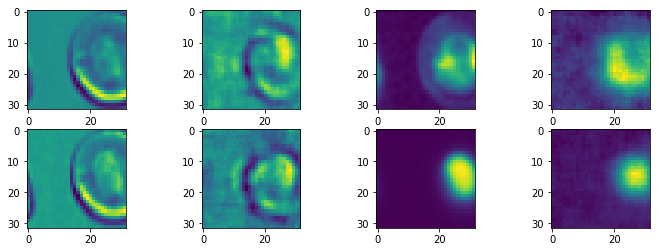

(4, 256, 128)
Epoch:  16 Iteration:  700 Loss:  210.12885
(32, 32, 4) (4, 32, 32, 1)


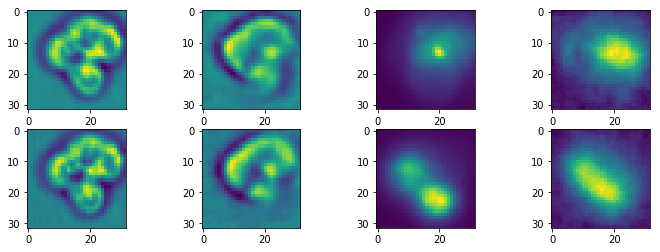

(4, 256, 128)
Epoch:  17 Iteration:  0 Loss:  208.89536
(32, 32, 4) (4, 32, 32, 1)


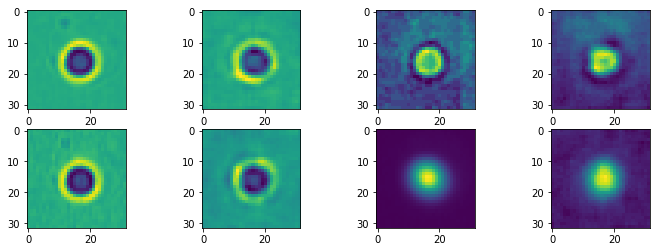

(4, 256, 128)
Epoch:  17 Iteration:  100 Loss:  203.69441
(32, 32, 4) (4, 32, 32, 1)


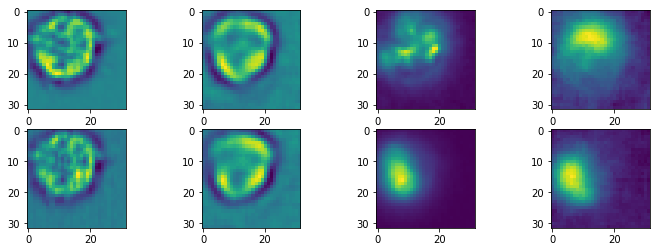

(4, 256, 128)
Epoch:  17 Iteration:  200 Loss:  202.69614
(32, 32, 4) (4, 32, 32, 1)


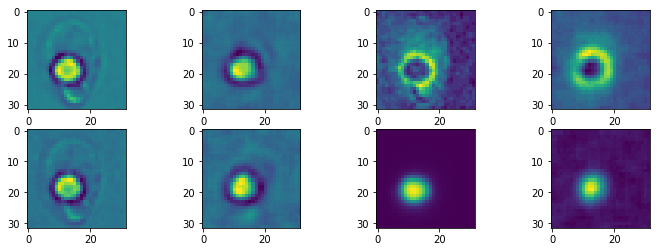

(4, 256, 128)
Epoch:  17 Iteration:  300 Loss:  202.39758
(32, 32, 4) (4, 32, 32, 1)


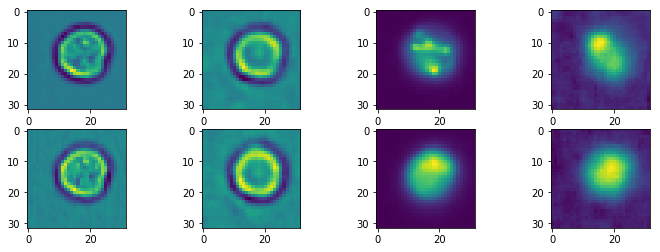

(4, 256, 128)
Epoch:  17 Iteration:  400 Loss:  204.32106
(32, 32, 4) (4, 32, 32, 1)


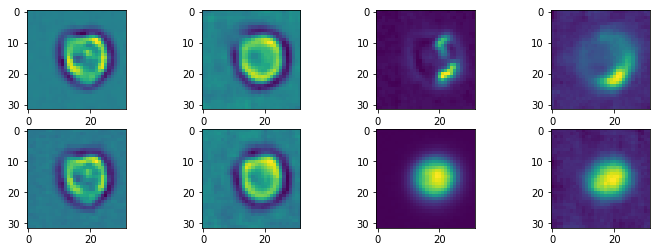

(4, 256, 128)
Epoch:  17 Iteration:  500 Loss:  207.07257
(32, 32, 4) (4, 32, 32, 1)


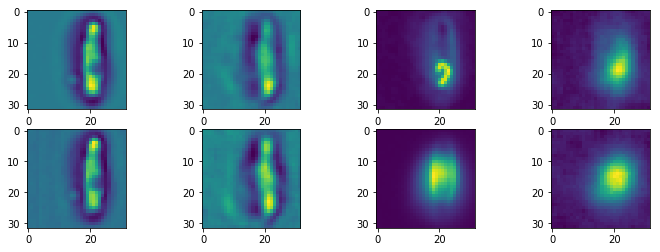

(4, 256, 128)
Epoch:  17 Iteration:  600 Loss:  208.45032
(32, 32, 4) (4, 32, 32, 1)


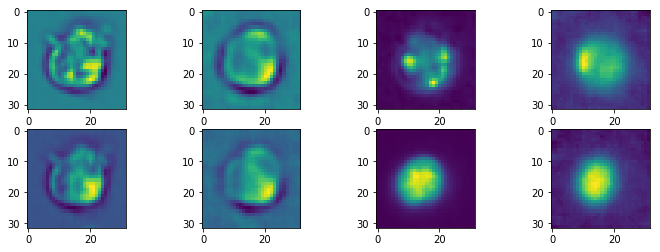

(4, 256, 128)
Epoch:  17 Iteration:  700 Loss:  207.20612
(32, 32, 4) (4, 32, 32, 1)


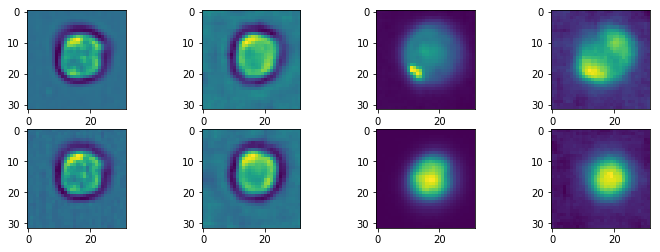

(4, 256, 128)
Epoch:  18 Iteration:  0 Loss:  203.35907
(32, 32, 4) (4, 32, 32, 1)


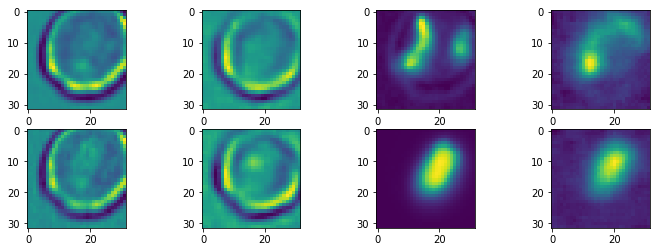

(4, 256, 128)
Epoch:  18 Iteration:  100 Loss:  198.769
(32, 32, 4) (4, 32, 32, 1)


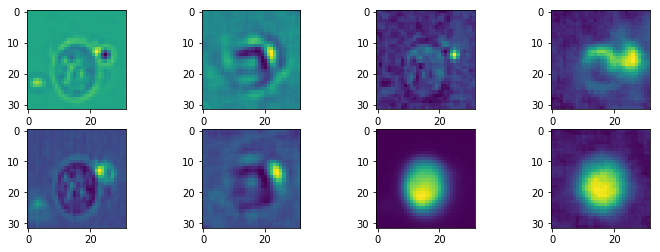

(4, 256, 128)
Epoch:  18 Iteration:  200 Loss:  197.4518
(32, 32, 4) (4, 32, 32, 1)


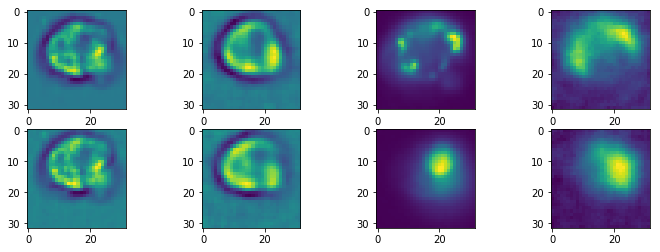

(4, 256, 128)
Epoch:  18 Iteration:  300 Loss:  199.66774
(32, 32, 4) (4, 32, 32, 1)


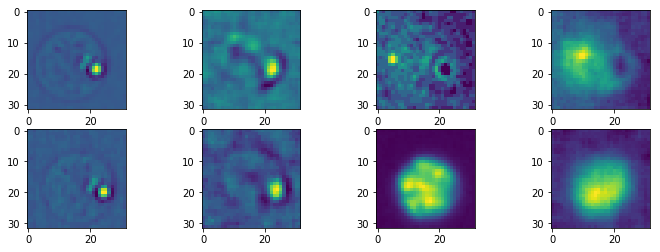

(4, 256, 128)
Epoch:  18 Iteration:  400 Loss:  201.62155
(32, 32, 4) (4, 32, 32, 1)


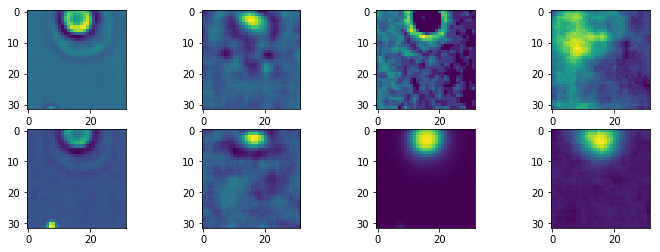

(4, 256, 128)
Epoch:  18 Iteration:  500 Loss:  205.73407
(32, 32, 4) (4, 32, 32, 1)


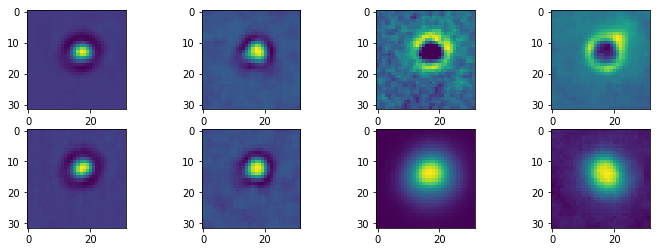

(4, 256, 128)
Epoch:  18 Iteration:  600 Loss:  204.3598
(32, 32, 4) (4, 32, 32, 1)


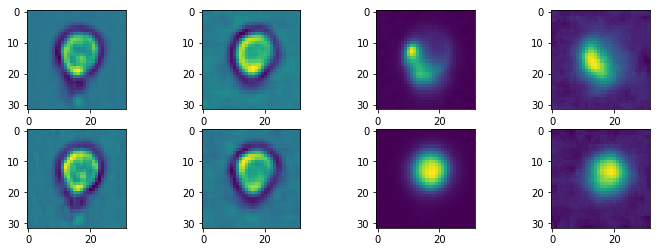

(4, 256, 128)
Epoch:  18 Iteration:  700 Loss:  202.34674
(32, 32, 4) (4, 32, 32, 1)


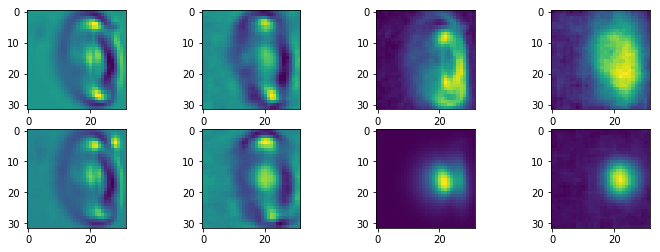

(4, 256, 128)
Epoch:  19 Iteration:  0 Loss:  197.5267
(32, 32, 4) (4, 32, 32, 1)


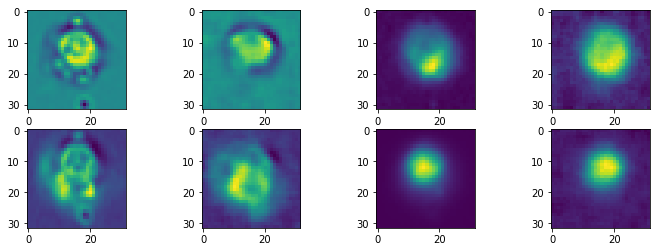

(4, 256, 128)
Epoch:  19 Iteration:  100 Loss:  192.5376
(32, 32, 4) (4, 32, 32, 1)


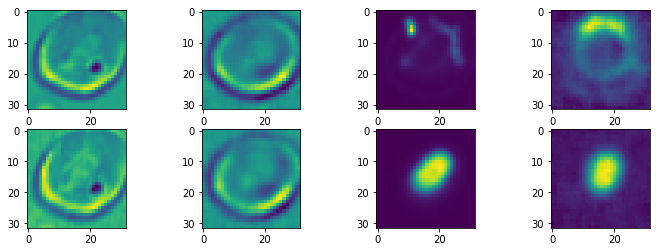

(4, 256, 128)
Epoch:  19 Iteration:  200 Loss:  193.1626
(32, 32, 4) (4, 32, 32, 1)


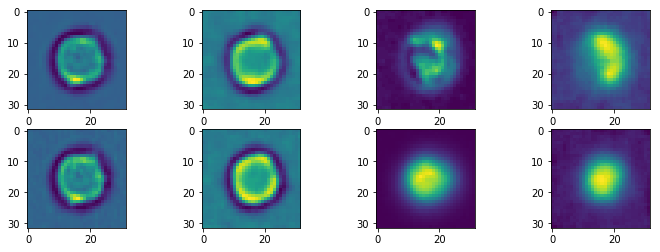

(4, 256, 128)
Epoch:  19 Iteration:  300 Loss:  195.6535
(32, 32, 4) (4, 32, 32, 1)


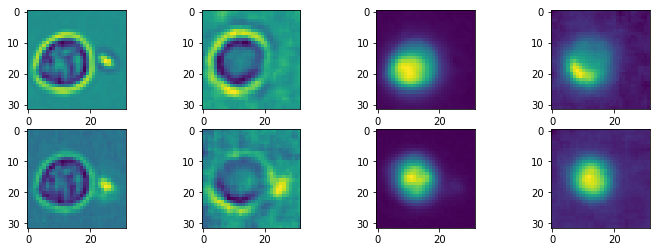

(4, 256, 128)
Epoch:  19 Iteration:  400 Loss:  199.70743
(32, 32, 4) (4, 32, 32, 1)


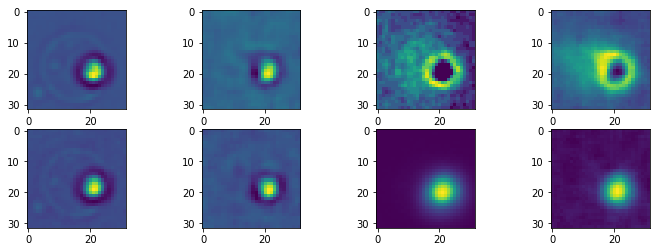

(4, 256, 128)
Epoch:  19 Iteration:  500 Loss:  202.70674
(32, 32, 4) (4, 32, 32, 1)


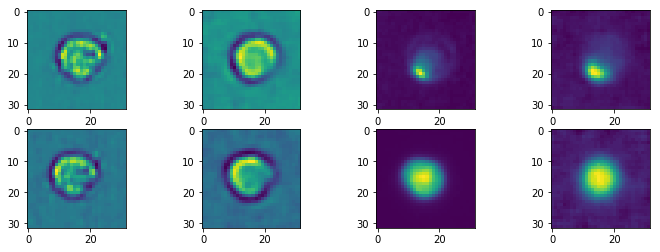

(4, 256, 128)
Epoch:  19 Iteration:  600 Loss:  203.55551
(32, 32, 4) (4, 32, 32, 1)


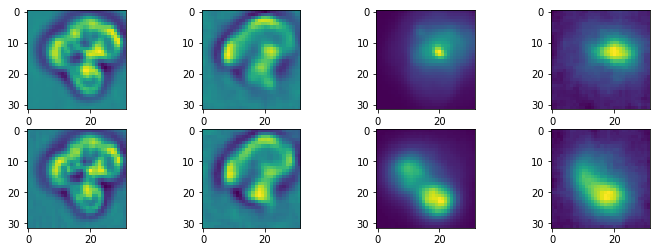

(4, 256, 128)
Epoch:  19 Iteration:  700 Loss:  199.50528
(32, 32, 4) (4, 32, 32, 1)


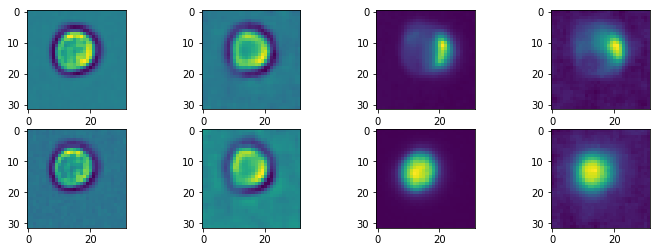

(4, 256, 128)
Epoch:  20 Iteration:  0 Loss:  195.888
(32, 32, 4) (4, 32, 32, 1)


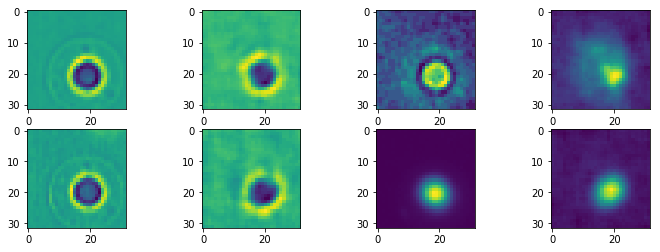

(4, 256, 128)
Epoch:  20 Iteration:  100 Loss:  192.22191
(32, 32, 4) (4, 32, 32, 1)


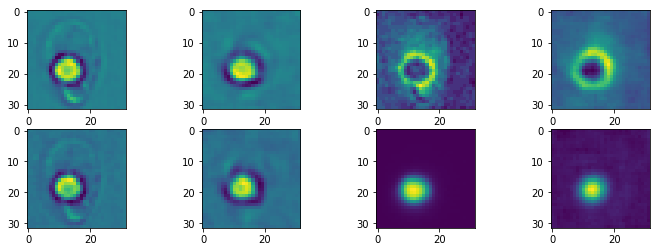

(4, 256, 128)
Epoch:  20 Iteration:  200 Loss:  190.64594
(32, 32, 4) (4, 32, 32, 1)


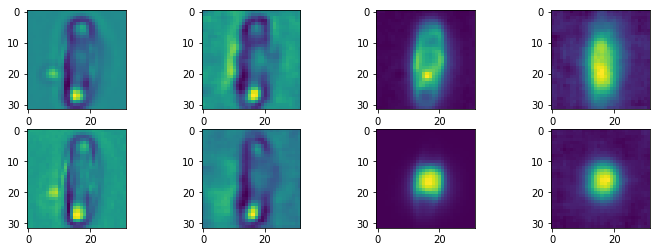

(4, 256, 128)
Epoch:  20 Iteration:  300 Loss:  192.87091
(32, 32, 4) (4, 32, 32, 1)


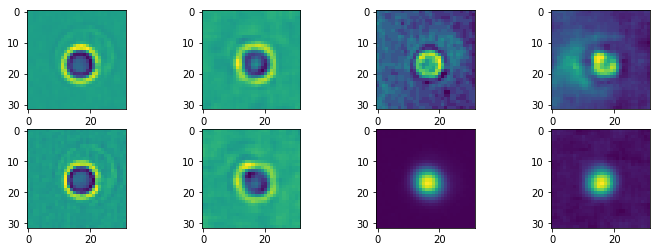

(4, 256, 128)
Epoch:  20 Iteration:  400 Loss:  194.264
(32, 32, 4) (4, 32, 32, 1)


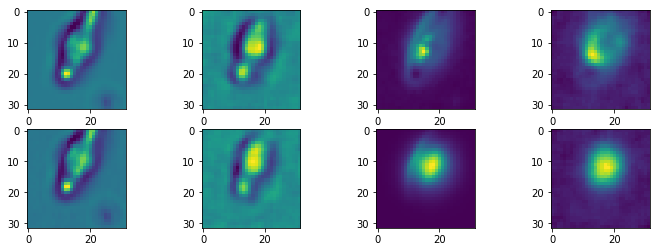

(4, 256, 128)
Epoch:  20 Iteration:  500 Loss:  195.68246
(32, 32, 4) (4, 32, 32, 1)


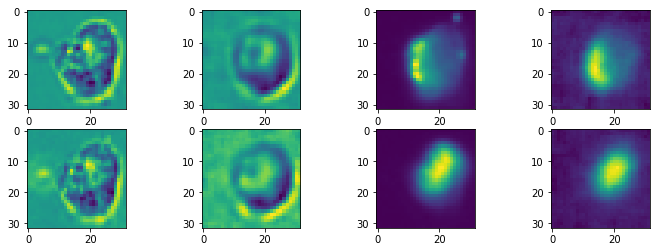

(4, 256, 128)
Epoch:  20 Iteration:  600 Loss:  195.59337
(32, 32, 4) (4, 32, 32, 1)


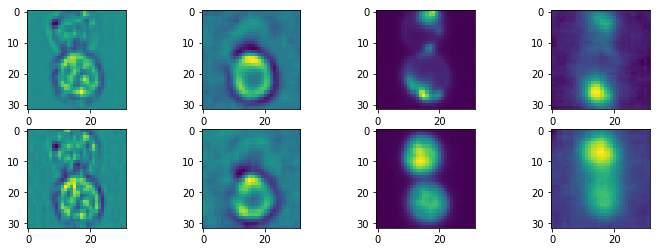

(4, 256, 128)
Epoch:  20 Iteration:  700 Loss:  196.48434
(32, 32, 4) (4, 32, 32, 1)


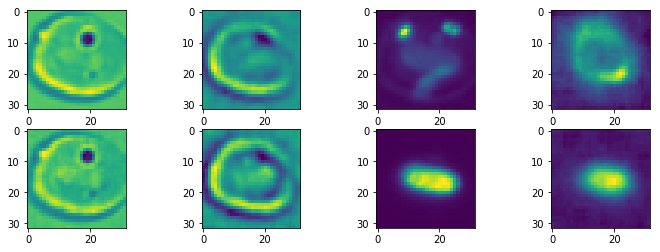

(4, 256, 128)
Epoch:  21 Iteration:  0 Loss:  192.3205
(32, 32, 4) (4, 32, 32, 1)


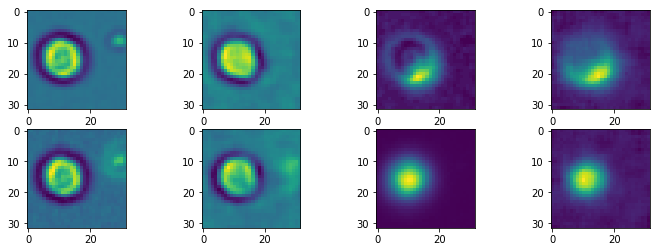

(4, 256, 128)
Epoch:  21 Iteration:  100 Loss:  189.41501
(32, 32, 4) (4, 32, 32, 1)


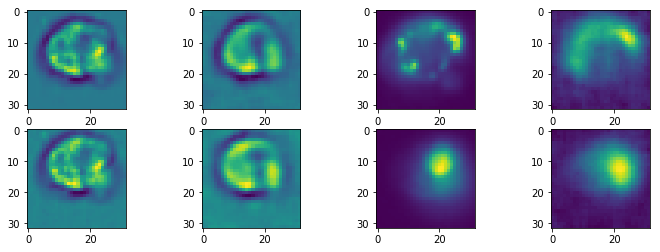

(4, 256, 128)
Epoch:  21 Iteration:  200 Loss:  190.09842
(32, 32, 4) (4, 32, 32, 1)


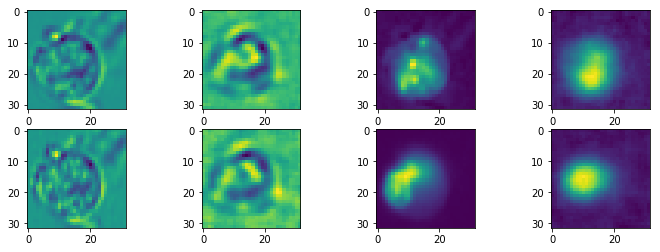

(4, 256, 128)
Epoch:  21 Iteration:  300 Loss:  190.50557
(32, 32, 4) (4, 32, 32, 1)


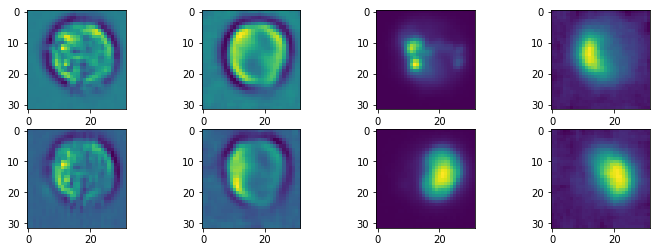

(4, 256, 128)
Epoch:  21 Iteration:  400 Loss:  190.1239
(32, 32, 4) (4, 32, 32, 1)


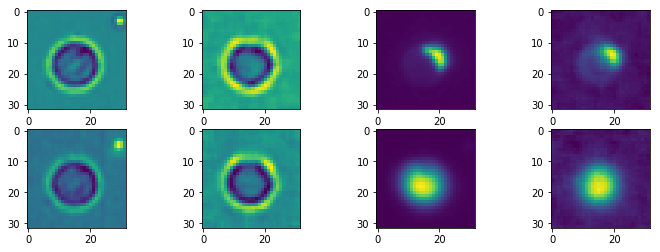

(4, 256, 128)
Epoch:  21 Iteration:  500 Loss:  193.78645
(32, 32, 4) (4, 32, 32, 1)


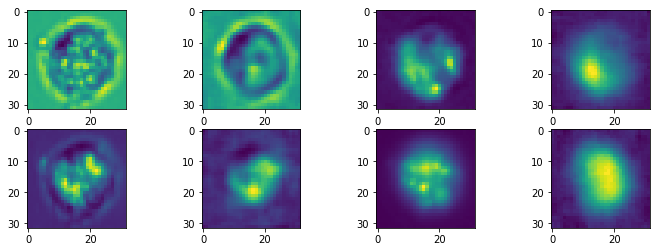

(4, 256, 128)
Epoch:  21 Iteration:  600 Loss:  192.98857
(32, 32, 4) (4, 32, 32, 1)


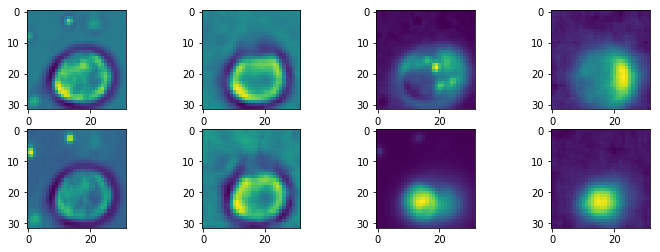

(4, 256, 128)
Epoch:  21 Iteration:  700 Loss:  194.35489
(32, 32, 4) (4, 32, 32, 1)


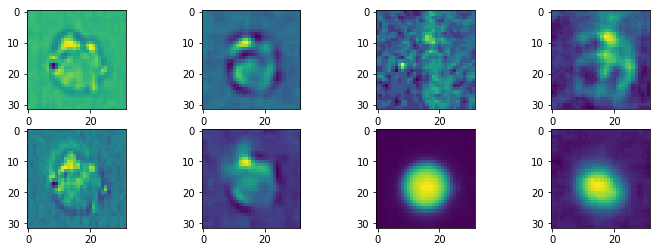

(4, 256, 128)
Epoch:  22 Iteration:  0 Loss:  192.46082
(32, 32, 4) (4, 32, 32, 1)


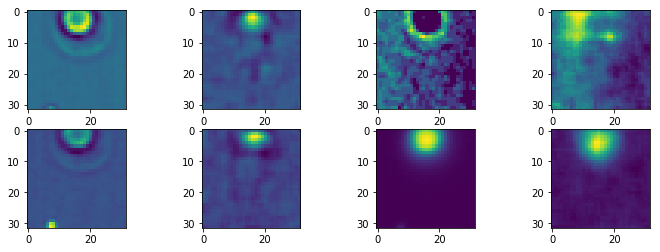

(4, 256, 128)
Epoch:  22 Iteration:  100 Loss:  185.0953
(32, 32, 4) (4, 32, 32, 1)


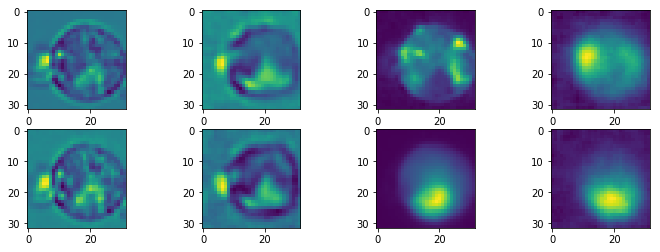

(4, 256, 128)
Epoch:  22 Iteration:  200 Loss:  184.83914
(32, 32, 4) (4, 32, 32, 1)


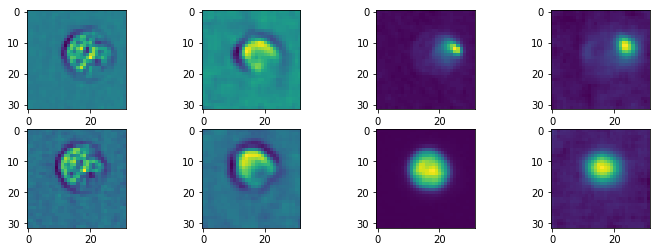

(4, 256, 128)
Epoch:  22 Iteration:  300 Loss:  186.2575
(32, 32, 4) (4, 32, 32, 1)


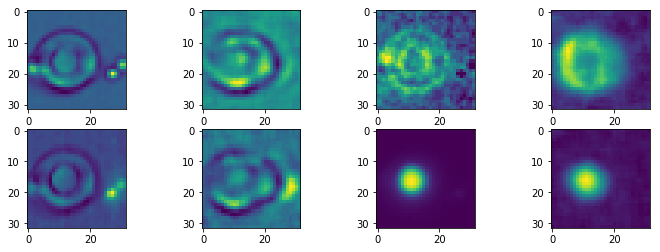

(4, 256, 128)
Epoch:  22 Iteration:  400 Loss:  189.37318
(32, 32, 4) (4, 32, 32, 1)


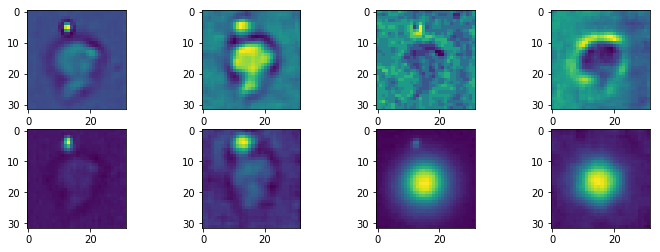

(4, 256, 128)
Epoch:  22 Iteration:  500 Loss:  192.21463
(32, 32, 4) (4, 32, 32, 1)


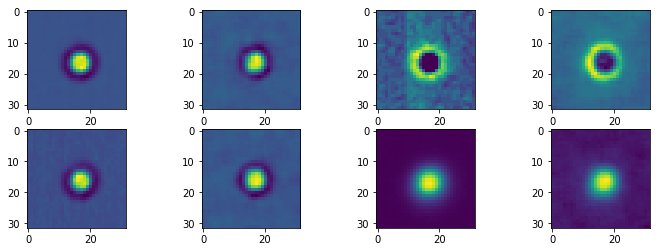

(4, 256, 128)
Epoch:  22 Iteration:  600 Loss:  193.14934
(32, 32, 4) (4, 32, 32, 1)


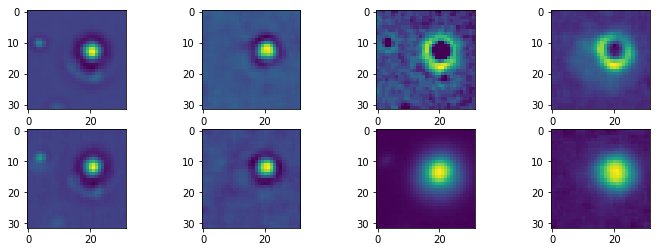

(4, 256, 128)
Epoch:  22 Iteration:  700 Loss:  192.07672
(32, 32, 4) (4, 32, 32, 1)


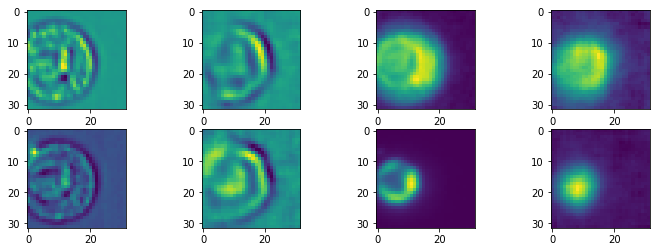

(4, 256, 128)
Epoch:  23 Iteration:  0 Loss:  186.51506
(32, 32, 4) (4, 32, 32, 1)


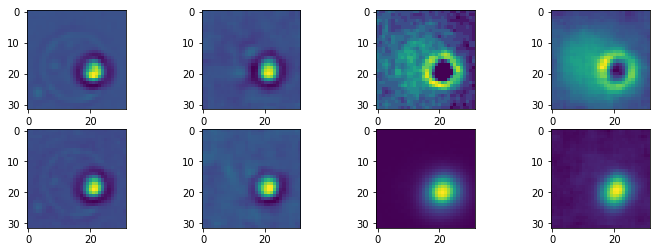

(4, 256, 128)
Epoch:  23 Iteration:  100 Loss:  180.31992
(32, 32, 4) (4, 32, 32, 1)


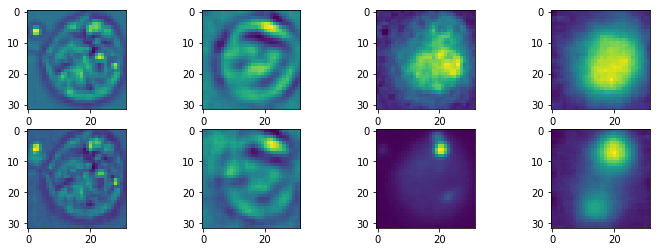

(4, 256, 128)
Epoch:  23 Iteration:  200 Loss:  181.01263
(32, 32, 4) (4, 32, 32, 1)


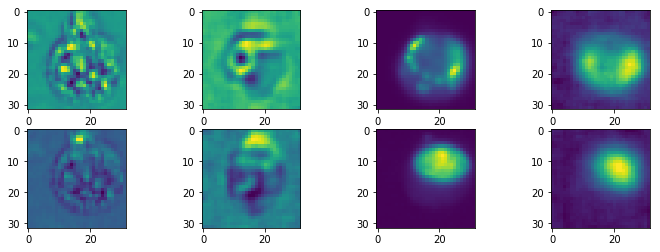

(4, 256, 128)
Epoch:  23 Iteration:  300 Loss:  186.49448
(32, 32, 4) (4, 32, 32, 1)


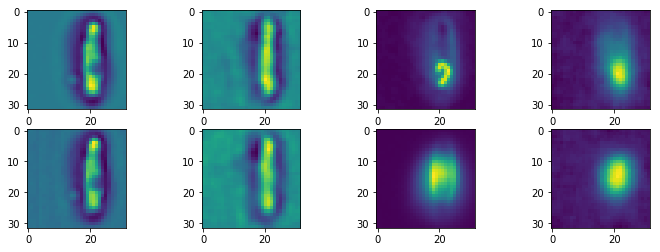

(4, 256, 128)
Epoch:  23 Iteration:  400 Loss:  187.75531
(32, 32, 4) (4, 32, 32, 1)


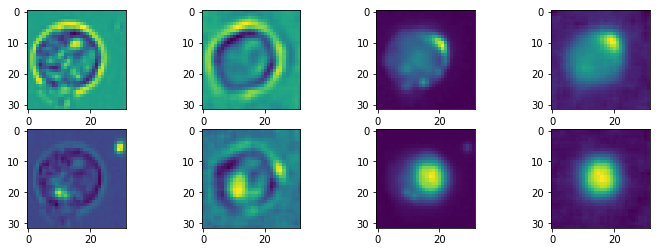

(4, 256, 128)
Epoch:  23 Iteration:  500 Loss:  190.44482
(32, 32, 4) (4, 32, 32, 1)


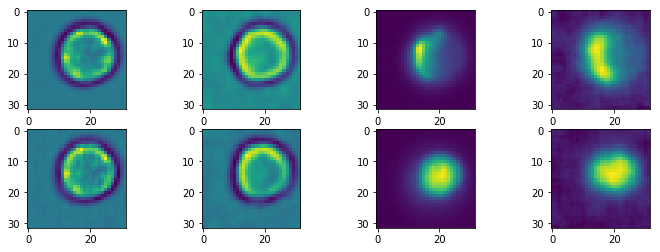

(4, 256, 128)
Epoch:  23 Iteration:  600 Loss:  191.58041
(32, 32, 4) (4, 32, 32, 1)


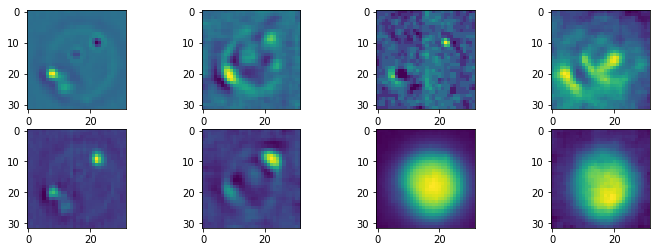

(4, 256, 128)
Epoch:  23 Iteration:  700 Loss:  188.77063
(32, 32, 4) (4, 32, 32, 1)


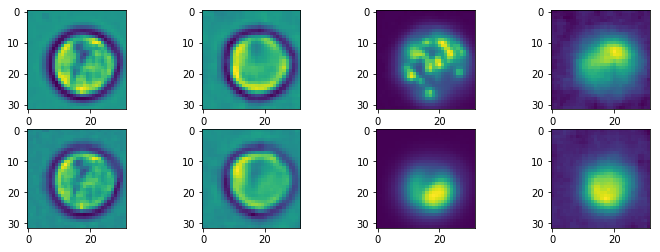

(4, 256, 128)
Epoch:  24 Iteration:  0 Loss:  185.2146
(32, 32, 4) (4, 32, 32, 1)


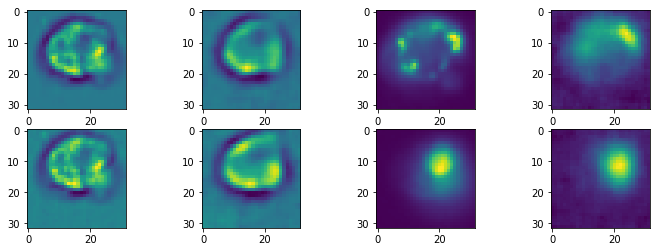

(4, 256, 128)
Epoch:  24 Iteration:  100 Loss:  178.89261
(32, 32, 4) (4, 32, 32, 1)


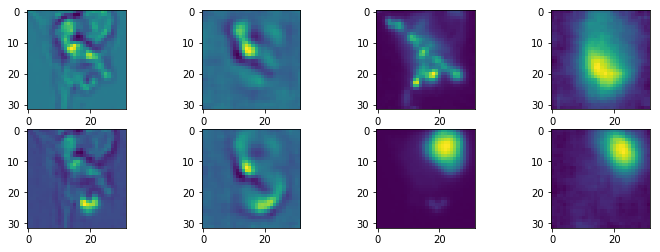

(4, 256, 128)
Epoch:  24 Iteration:  200 Loss:  180.41022
(32, 32, 4) (4, 32, 32, 1)


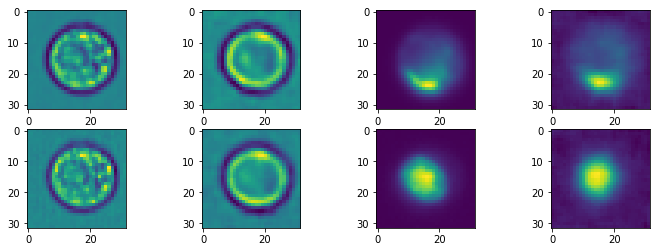

(4, 256, 128)
Epoch:  24 Iteration:  300 Loss:  182.51704
(32, 32, 4) (4, 32, 32, 1)


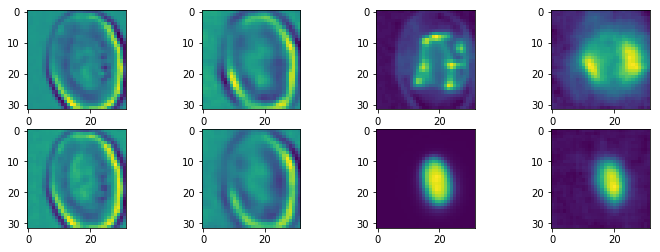

(4, 256, 128)
Epoch:  24 Iteration:  400 Loss:  185.07762
(32, 32, 4) (4, 32, 32, 1)


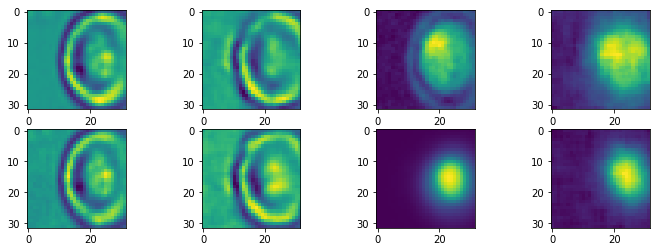

(4, 256, 128)
Epoch:  24 Iteration:  500 Loss:  187.98184
(32, 32, 4) (4, 32, 32, 1)


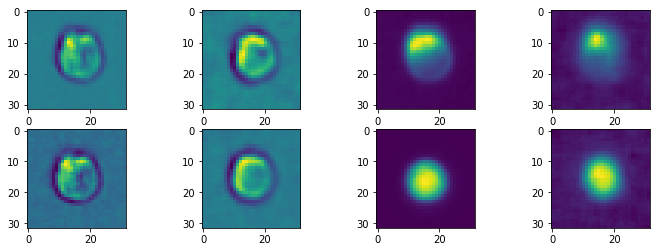

(4, 256, 128)
Epoch:  24 Iteration:  600 Loss:  189.06052
(32, 32, 4) (4, 32, 32, 1)


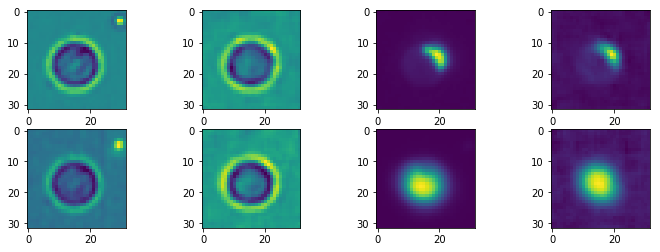

(4, 256, 128)
Epoch:  24 Iteration:  700 Loss:  188.74583
(32, 32, 4) (4, 32, 32, 1)


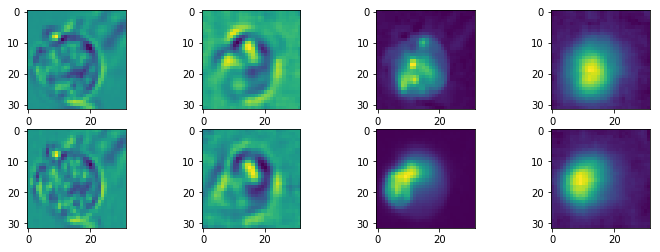

(4, 256, 128)
Epoch:  25 Iteration:  0 Loss:  183.6161
(32, 32, 4) (4, 32, 32, 1)


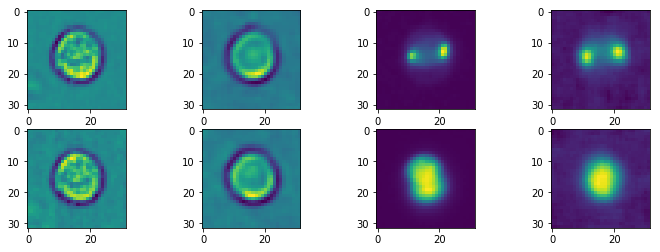

(4, 256, 128)
Epoch:  25 Iteration:  100 Loss:  175.50232
(32, 32, 4) (4, 32, 32, 1)


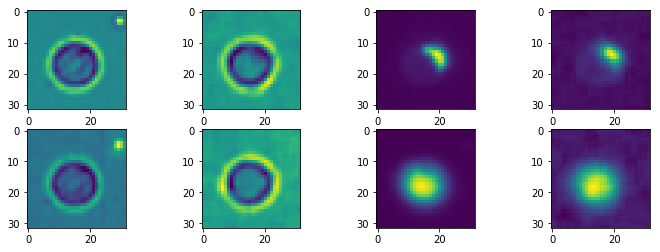

(4, 256, 128)
Epoch:  25 Iteration:  200 Loss:  177.60493
(32, 32, 4) (4, 32, 32, 1)


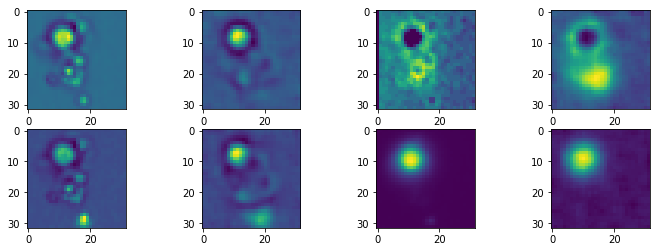

(4, 256, 128)
Epoch:  25 Iteration:  300 Loss:  179.05244
(32, 32, 4) (4, 32, 32, 1)


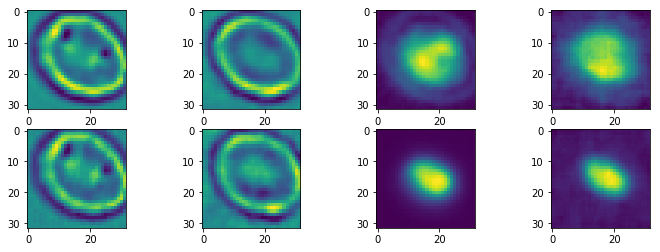

(4, 256, 128)
Epoch:  25 Iteration:  400 Loss:  181.1694
(32, 32, 4) (4, 32, 32, 1)


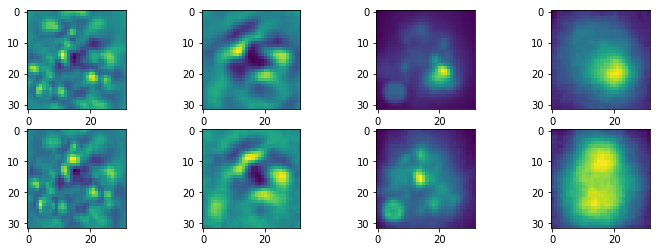

(4, 256, 128)
Epoch:  25 Iteration:  500 Loss:  185.73074
(32, 32, 4) (4, 32, 32, 1)


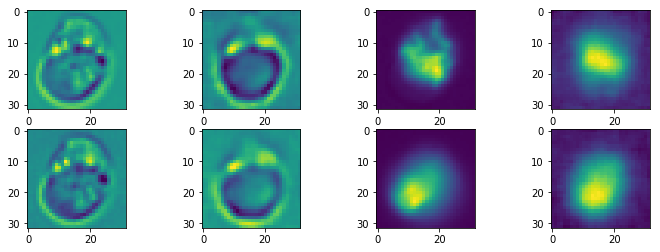

(4, 256, 128)
Epoch:  25 Iteration:  600 Loss:  186.7559
(32, 32, 4) (4, 32, 32, 1)


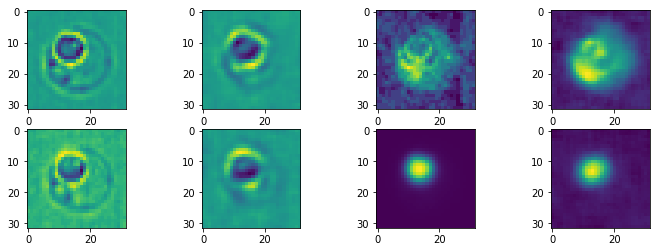

(4, 256, 128)
Epoch:  25 Iteration:  700 Loss:  187.67874
(32, 32, 4) (4, 32, 32, 1)


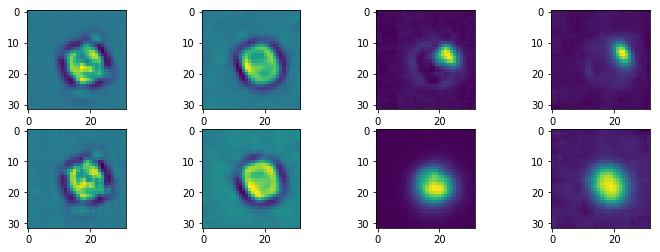

(4, 256, 128)
Epoch:  26 Iteration:  0 Loss:  183.12155
(32, 32, 4) (4, 32, 32, 1)


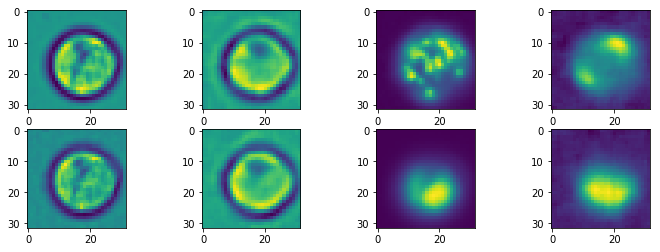

(4, 256, 128)
Epoch:  26 Iteration:  100 Loss:  176.26949
(32, 32, 4) (4, 32, 32, 1)


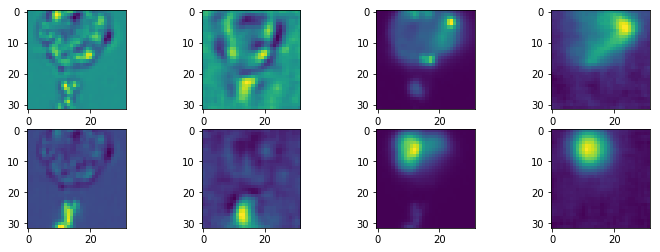

(4, 256, 128)
Epoch:  26 Iteration:  200 Loss:  175.23087
(32, 32, 4) (4, 32, 32, 1)


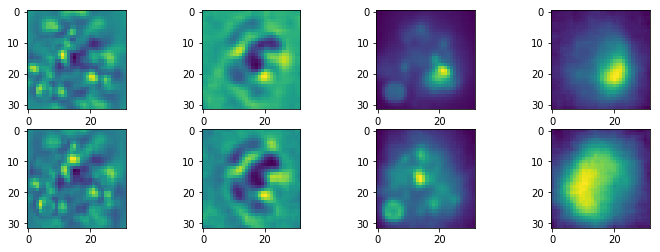

(4, 256, 128)
Epoch:  26 Iteration:  300 Loss:  178.46341
(32, 32, 4) (4, 32, 32, 1)


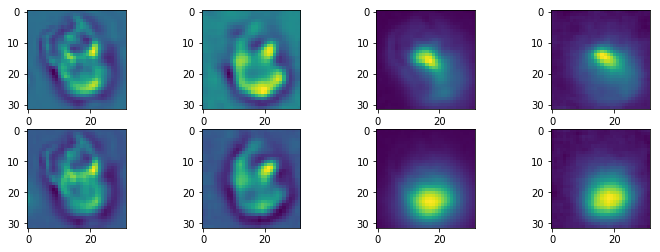

(4, 256, 128)
Epoch:  26 Iteration:  400 Loss:  179.1636
(32, 32, 4) (4, 32, 32, 1)


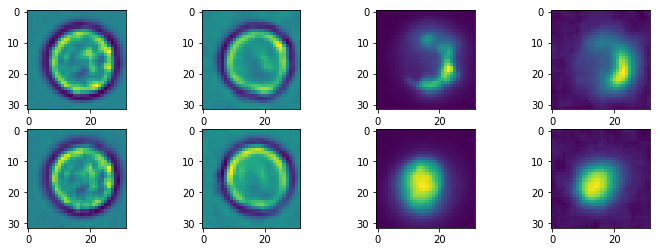

(4, 256, 128)
Epoch:  26 Iteration:  500 Loss:  183.2858
(32, 32, 4) (4, 32, 32, 1)


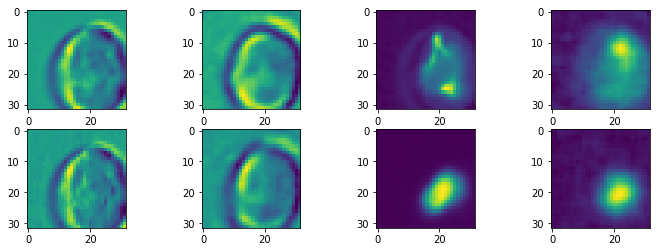

(4, 256, 128)
Epoch:  26 Iteration:  600 Loss:  183.70456
(32, 32, 4) (4, 32, 32, 1)


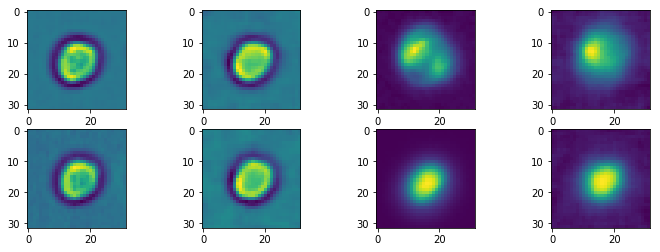

(4, 256, 128)
Epoch:  26 Iteration:  700 Loss:  183.0068
(32, 32, 4) (4, 32, 32, 1)


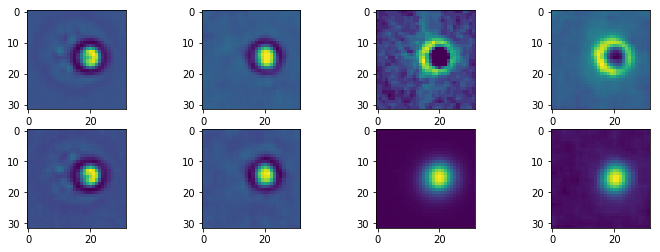

(4, 256, 128)
Epoch:  27 Iteration:  0 Loss:  180.66296
(32, 32, 4) (4, 32, 32, 1)


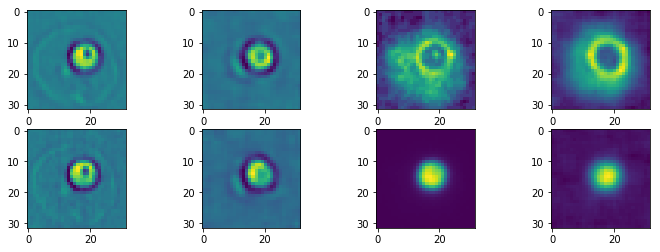

(4, 256, 128)
Epoch:  27 Iteration:  100 Loss:  174.39789
(32, 32, 4) (4, 32, 32, 1)


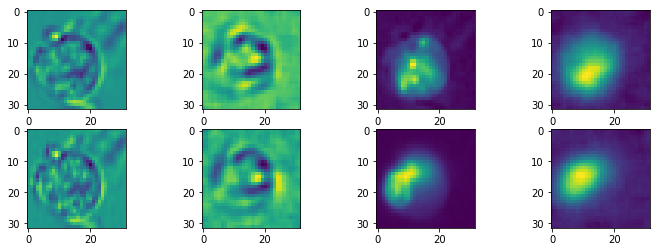

(4, 256, 128)
Epoch:  27 Iteration:  200 Loss:  176.9223
(32, 32, 4) (4, 32, 32, 1)


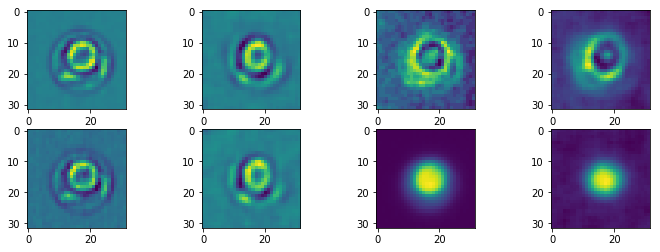

(4, 256, 128)
Epoch:  27 Iteration:  300 Loss:  176.14934
(32, 32, 4) (4, 32, 32, 1)


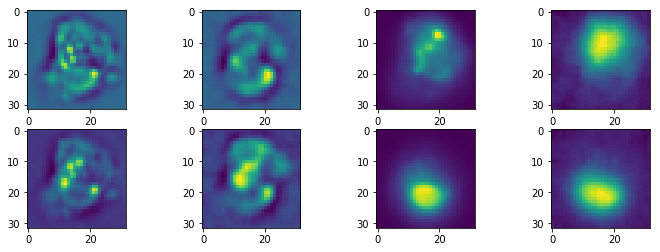

(4, 256, 128)
Epoch:  27 Iteration:  400 Loss:  178.82558
(32, 32, 4) (4, 32, 32, 1)


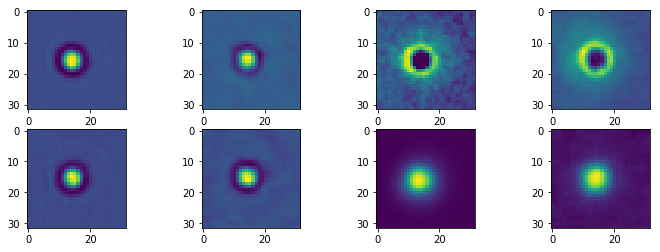

(4, 256, 128)
Epoch:  27 Iteration:  500 Loss:  184.4631
(32, 32, 4) (4, 32, 32, 1)


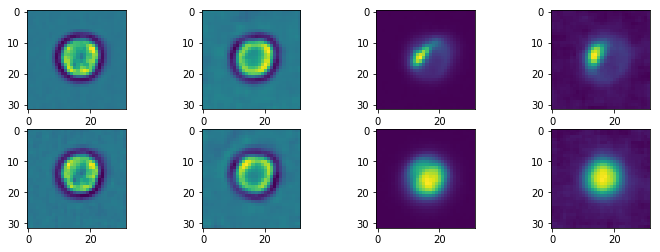

(4, 256, 128)
Epoch:  27 Iteration:  600 Loss:  183.47528
(32, 32, 4) (4, 32, 32, 1)


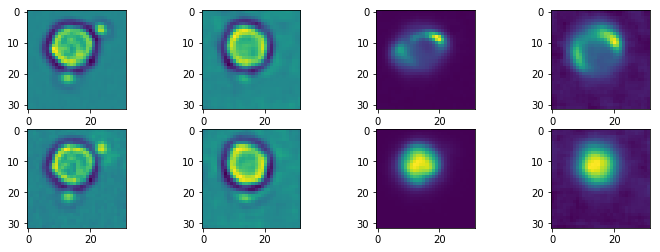

(4, 256, 128)
Epoch:  27 Iteration:  700 Loss:  182.7541
(32, 32, 4) (4, 32, 32, 1)


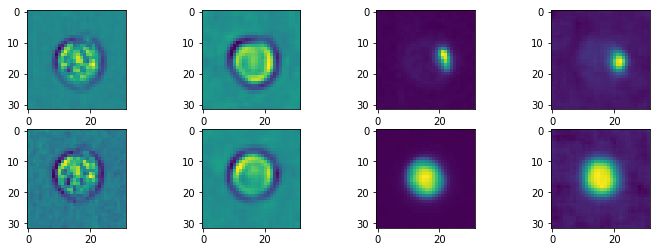

(4, 256, 128)
Epoch:  28 Iteration:  0 Loss:  178.41489
(32, 32, 4) (4, 32, 32, 1)


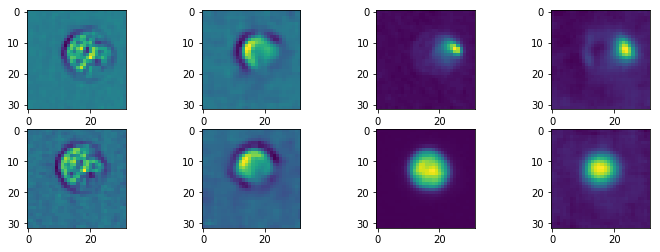

(4, 256, 128)
Epoch:  28 Iteration:  100 Loss:  172.63297
(32, 32, 4) (4, 32, 32, 1)


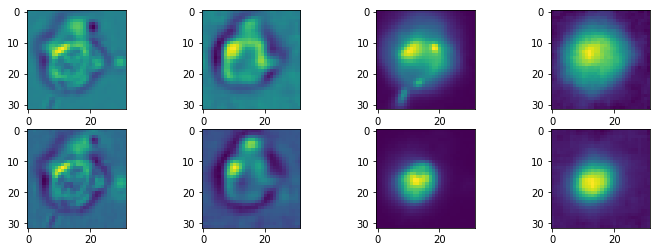

(4, 256, 128)
Epoch:  28 Iteration:  200 Loss:  174.13298
(32, 32, 4) (4, 32, 32, 1)


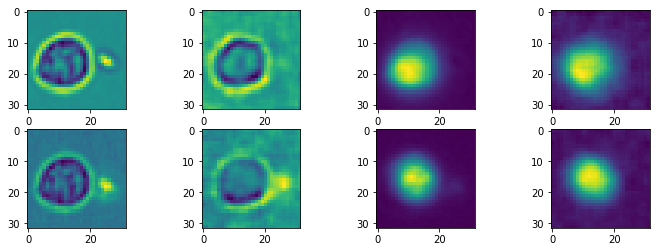

(4, 256, 128)
Epoch:  28 Iteration:  300 Loss:  176.28159
(32, 32, 4) (4, 32, 32, 1)


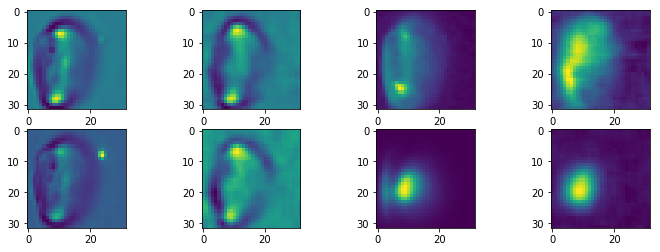

(4, 256, 128)
Epoch:  28 Iteration:  400 Loss:  176.66501
(32, 32, 4) (4, 32, 32, 1)


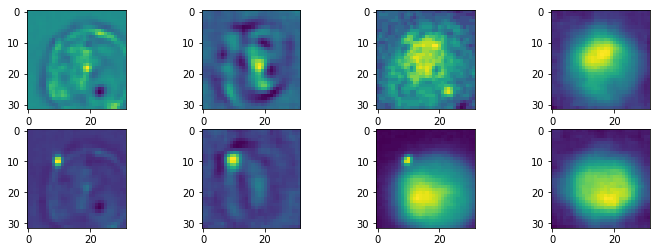

(4, 256, 128)
Epoch:  28 Iteration:  500 Loss:  182.46774
(32, 32, 4) (4, 32, 32, 1)


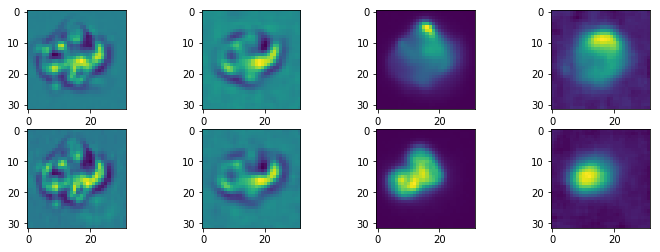

(4, 256, 128)
Epoch:  28 Iteration:  600 Loss:  182.25064
(32, 32, 4) (4, 32, 32, 1)


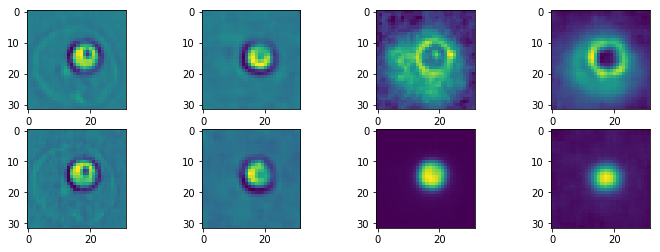

(4, 256, 128)
Epoch:  28 Iteration:  700 Loss:  181.88757
(32, 32, 4) (4, 32, 32, 1)


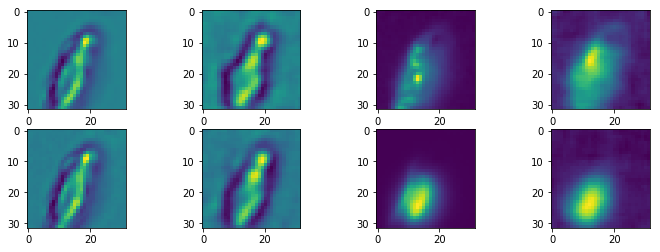

(4, 256, 128)
Epoch:  29 Iteration:  0 Loss:  178.26248
(32, 32, 4) (4, 32, 32, 1)


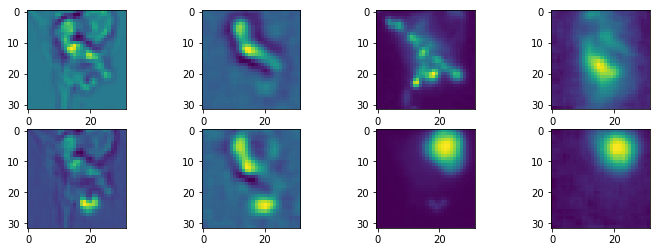

(4, 256, 128)
Epoch:  29 Iteration:  100 Loss:  170.69264
(32, 32, 4) (4, 32, 32, 1)


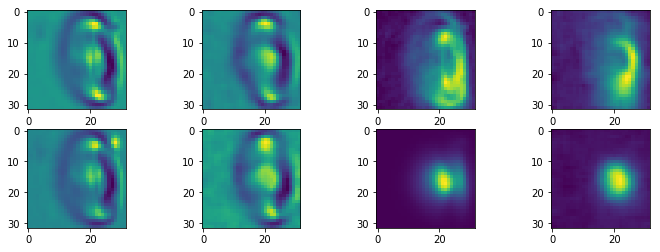

(4, 256, 128)
Epoch:  29 Iteration:  200 Loss:  172.95671
(32, 32, 4) (4, 32, 32, 1)


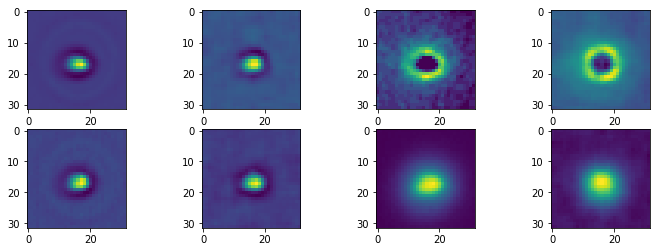

(4, 256, 128)
Epoch:  29 Iteration:  300 Loss:  175.02588
(32, 32, 4) (4, 32, 32, 1)


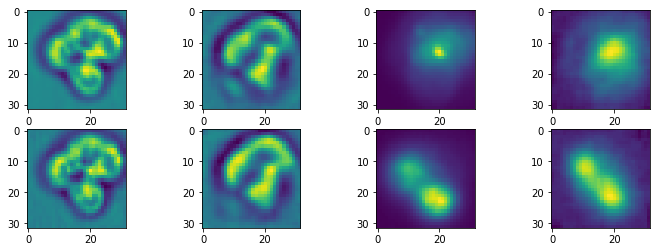

(4, 256, 128)
Epoch:  29 Iteration:  400 Loss:  177.71376
(32, 32, 4) (4, 32, 32, 1)


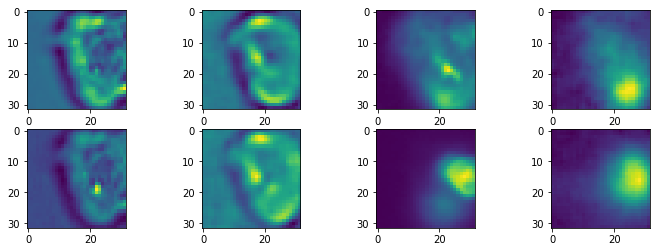

(4, 256, 128)
Epoch:  29 Iteration:  500 Loss:  179.10803
(32, 32, 4) (4, 32, 32, 1)


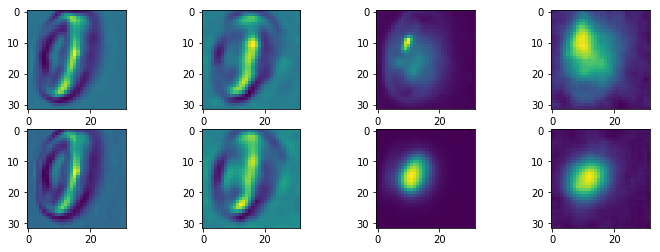

(4, 256, 128)
Epoch:  29 Iteration:  600 Loss:  179.94104
(32, 32, 4) (4, 32, 32, 1)


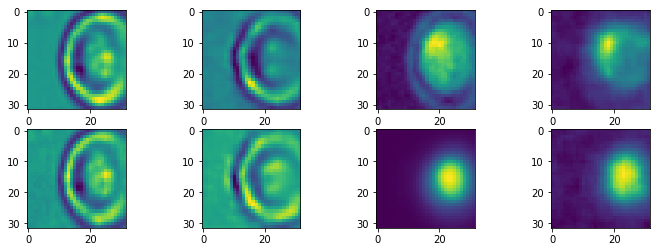

(4, 256, 128)
Epoch:  29 Iteration:  700 Loss:  180.16948
(32, 32, 4) (4, 32, 32, 1)


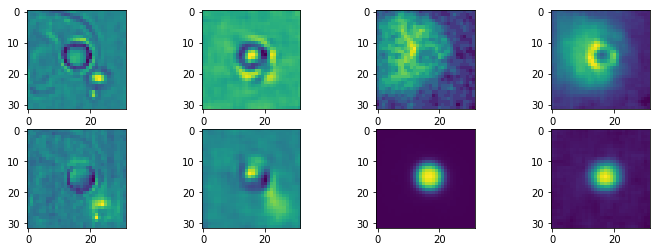

(4, 256, 128)
Epoch:  30 Iteration:  0 Loss:  177.04716
(32, 32, 4) (4, 32, 32, 1)


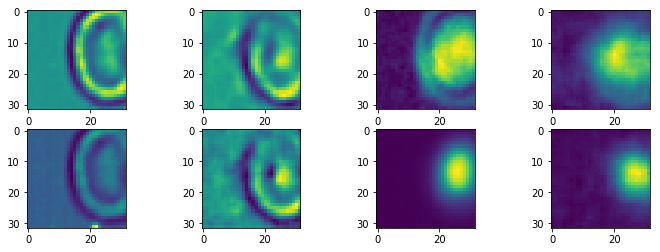

(4, 256, 128)
Epoch:  30 Iteration:  100 Loss:  169.34747
(32, 32, 4) (4, 32, 32, 1)


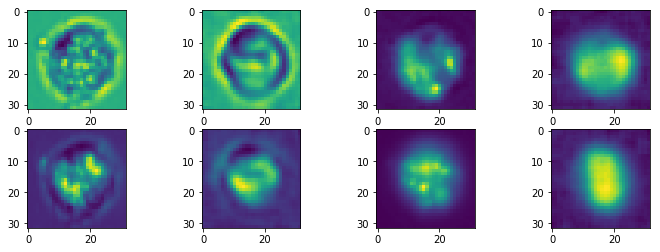

(4, 256, 128)
Epoch:  30 Iteration:  200 Loss:  171.36281
(32, 32, 4) (4, 32, 32, 1)


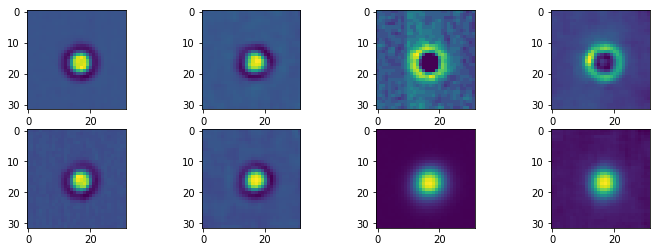

(4, 256, 128)
Epoch:  30 Iteration:  300 Loss:  171.27467
(32, 32, 4) (4, 32, 32, 1)


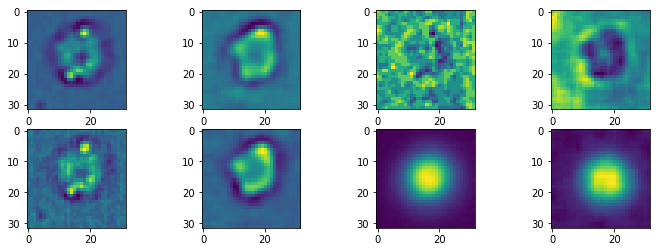

(4, 256, 128)
Epoch:  30 Iteration:  400 Loss:  173.74503
(32, 32, 4) (4, 32, 32, 1)


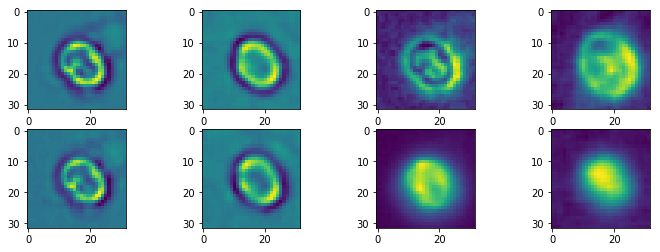

(4, 256, 128)
Epoch:  30 Iteration:  500 Loss:  178.00934
(32, 32, 4) (4, 32, 32, 1)


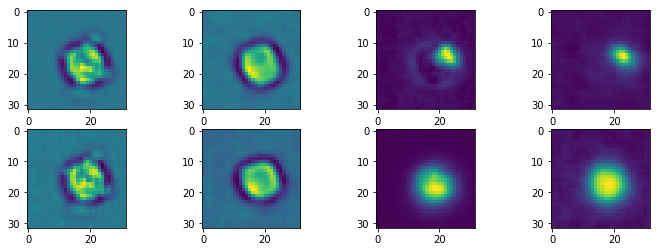

(4, 256, 128)
Epoch:  30 Iteration:  600 Loss:  179.1688
(32, 32, 4) (4, 32, 32, 1)


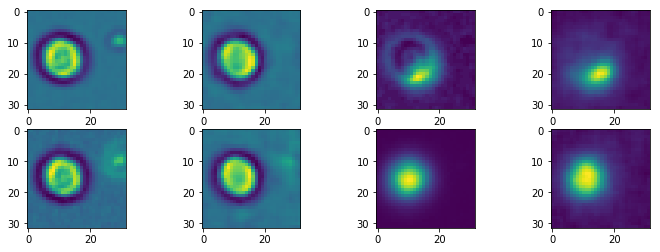

(4, 256, 128)
Epoch:  30 Iteration:  700 Loss:  177.86307
(32, 32, 4) (4, 32, 32, 1)


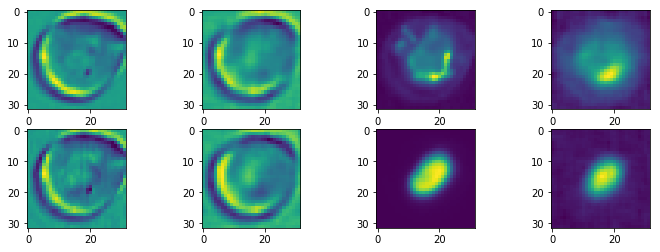

(4, 256, 128)
Epoch:  31 Iteration:  0 Loss:  172.85243
(32, 32, 4) (4, 32, 32, 1)


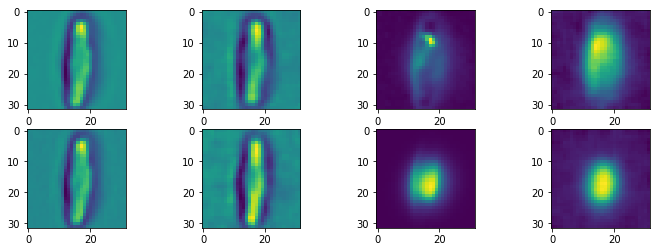

(4, 256, 128)
Epoch:  31 Iteration:  100 Loss:  171.42458
(32, 32, 4) (4, 32, 32, 1)


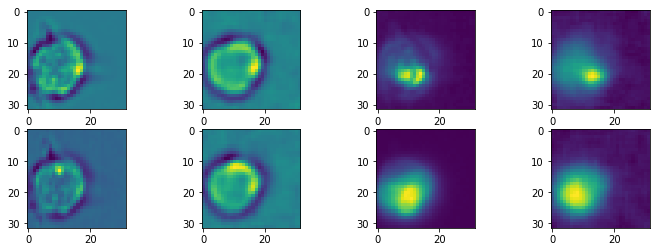

(4, 256, 128)
Epoch:  31 Iteration:  200 Loss:  171.80345
(32, 32, 4) (4, 32, 32, 1)


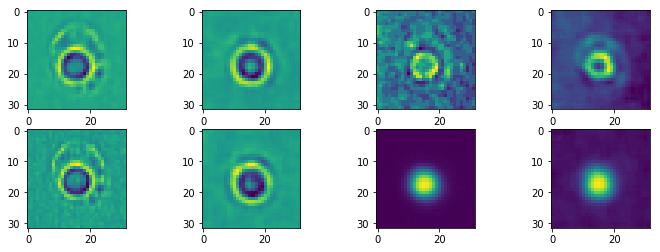

(4, 256, 128)
Epoch:  31 Iteration:  300 Loss:  172.67967
(32, 32, 4) (4, 32, 32, 1)


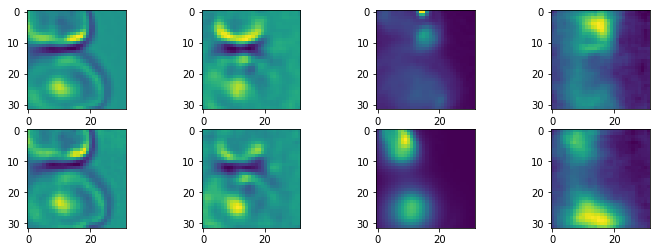

(4, 256, 128)
Epoch:  31 Iteration:  400 Loss:  171.21222
(32, 32, 4) (4, 32, 32, 1)


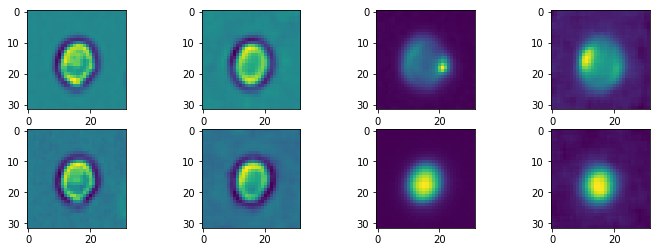

(4, 256, 128)
Epoch:  31 Iteration:  500 Loss:  179.05486
(32, 32, 4) (4, 32, 32, 1)


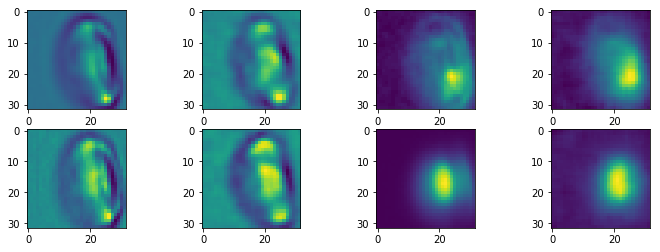

(4, 256, 128)
Epoch:  31 Iteration:  600 Loss:  176.37422
(32, 32, 4) (4, 32, 32, 1)


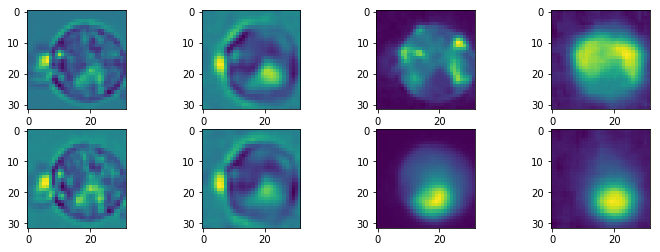

(4, 256, 128)
Epoch:  31 Iteration:  700 Loss:  176.76715
(32, 32, 4) (4, 32, 32, 1)


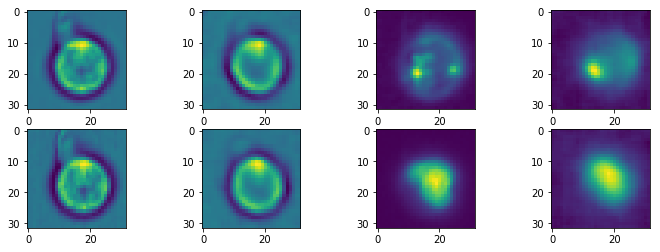

(4, 256, 128)
Epoch:  32 Iteration:  0 Loss:  175.65344
(32, 32, 4) (4, 32, 32, 1)


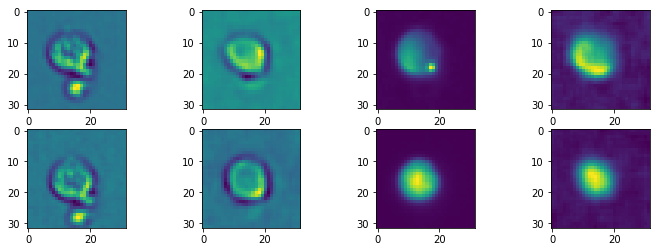

(4, 256, 128)
Epoch:  32 Iteration:  100 Loss:  167.93875
(32, 32, 4) (4, 32, 32, 1)


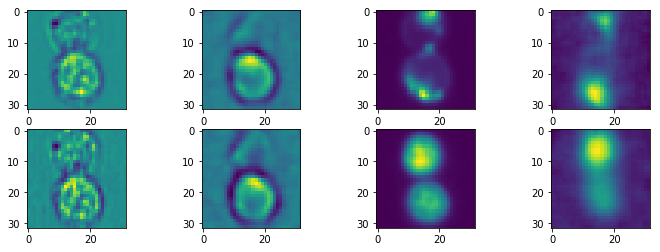

(4, 256, 128)
Epoch:  32 Iteration:  200 Loss:  169.41322
(32, 32, 4) (4, 32, 32, 1)


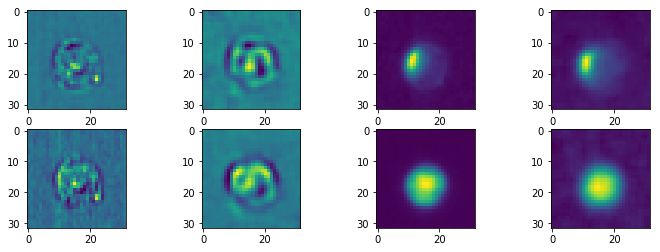

(4, 256, 128)
Epoch:  32 Iteration:  300 Loss:  170.57425
(32, 32, 4) (4, 32, 32, 1)


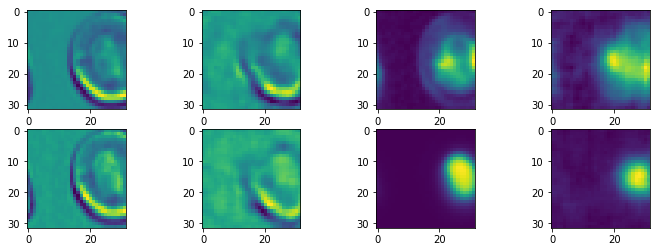

(4, 256, 128)
Epoch:  32 Iteration:  400 Loss:  172.47433
(32, 32, 4) (4, 32, 32, 1)


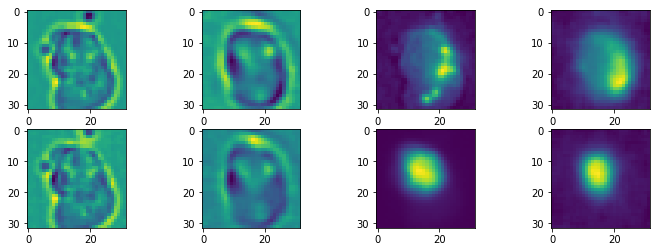

(4, 256, 128)
Epoch:  32 Iteration:  500 Loss:  177.26163
(32, 32, 4) (4, 32, 32, 1)


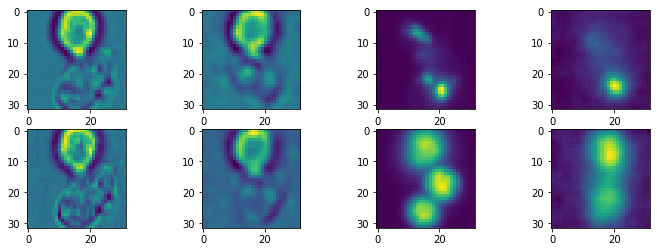

(4, 256, 128)
Epoch:  32 Iteration:  600 Loss:  175.42628
(32, 32, 4) (4, 32, 32, 1)


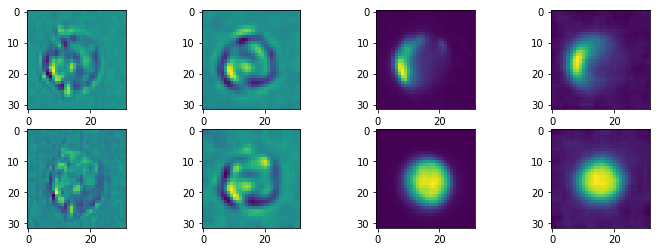

(4, 256, 128)
Epoch:  32 Iteration:  700 Loss:  177.20978
(32, 32, 4) (4, 32, 32, 1)


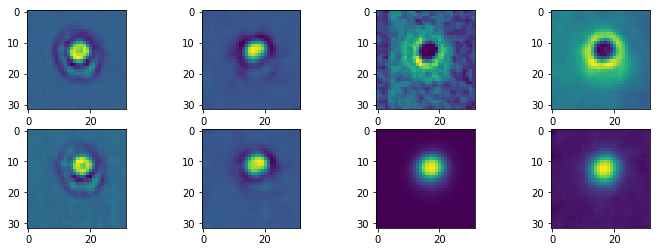

(4, 256, 128)
Epoch:  33 Iteration:  0 Loss:  172.85863
(32, 32, 4) (4, 32, 32, 1)


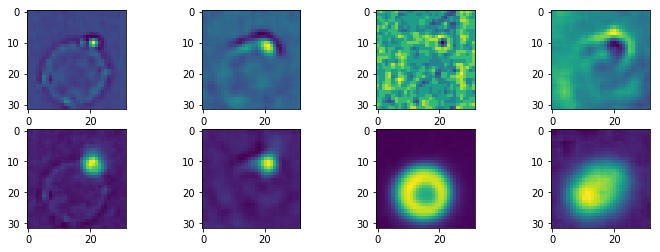

(4, 256, 128)
Epoch:  33 Iteration:  100 Loss:  166.08954
(32, 32, 4) (4, 32, 32, 1)


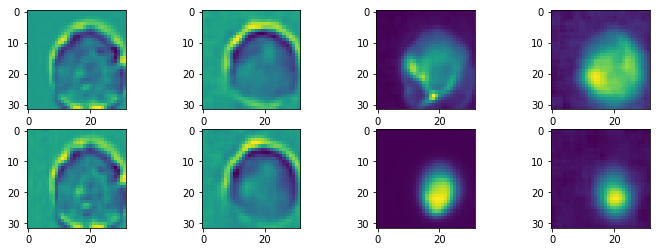

(4, 256, 128)
Epoch:  33 Iteration:  200 Loss:  165.61069
(32, 32, 4) (4, 32, 32, 1)


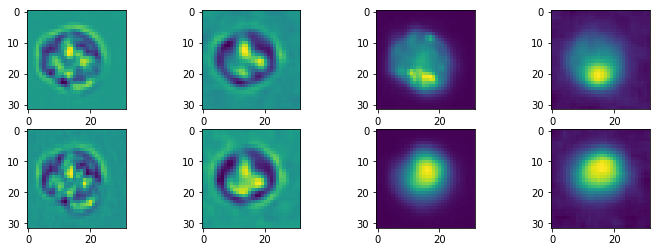

(4, 256, 128)
Epoch:  33 Iteration:  300 Loss:  168.43051
(32, 32, 4) (4, 32, 32, 1)


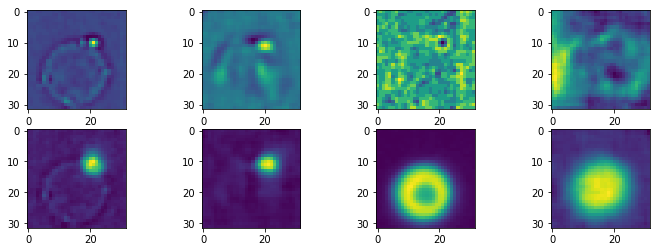

(4, 256, 128)
Epoch:  33 Iteration:  400 Loss:  170.92023
(32, 32, 4) (4, 32, 32, 1)


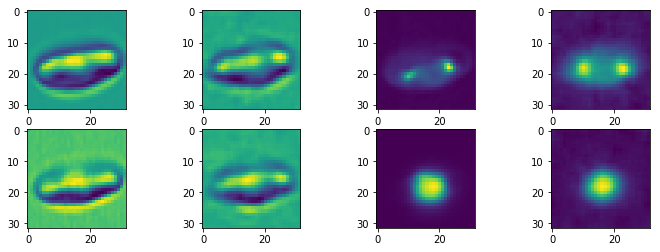

(4, 256, 128)
Epoch:  33 Iteration:  500 Loss:  174.51802
(32, 32, 4) (4, 32, 32, 1)


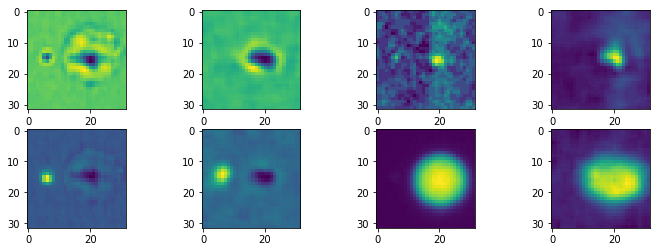

(4, 256, 128)
Epoch:  33 Iteration:  600 Loss:  175.95639
(32, 32, 4) (4, 32, 32, 1)


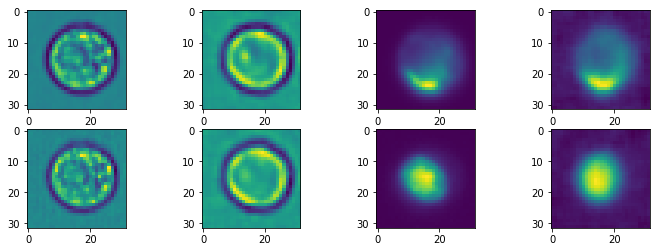

(4, 256, 128)
Epoch:  33 Iteration:  700 Loss:  174.43922
(32, 32, 4) (4, 32, 32, 1)


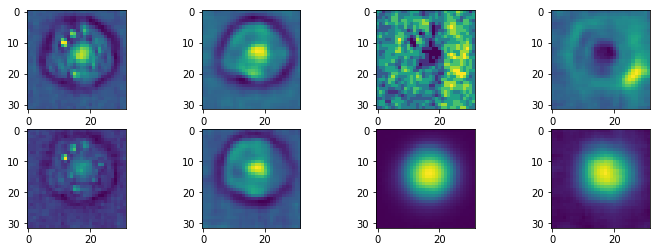

(4, 256, 128)
Epoch:  34 Iteration:  0 Loss:  172.15628
(32, 32, 4) (4, 32, 32, 1)


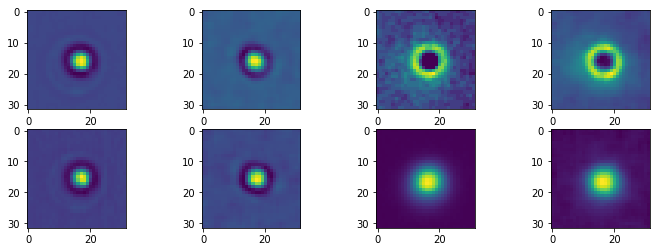

(4, 256, 128)
Epoch:  34 Iteration:  100 Loss:  164.52933
(32, 32, 4) (4, 32, 32, 1)


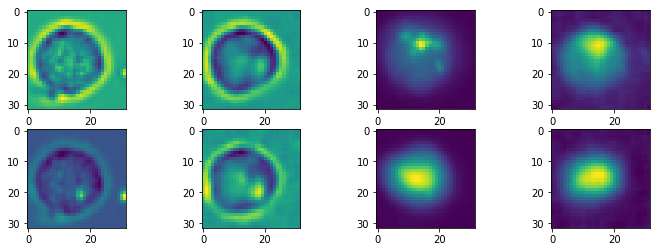

(4, 256, 128)
Epoch:  34 Iteration:  200 Loss:  165.35428
(32, 32, 4) (4, 32, 32, 1)


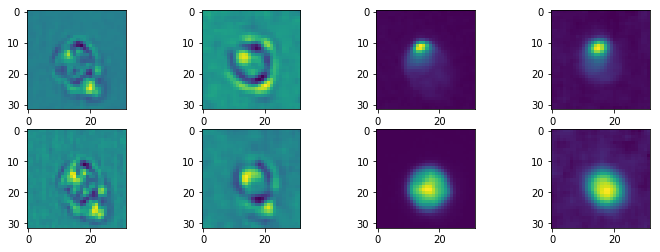

(4, 256, 128)
Epoch:  34 Iteration:  300 Loss:  170.05933
(32, 32, 4) (4, 32, 32, 1)


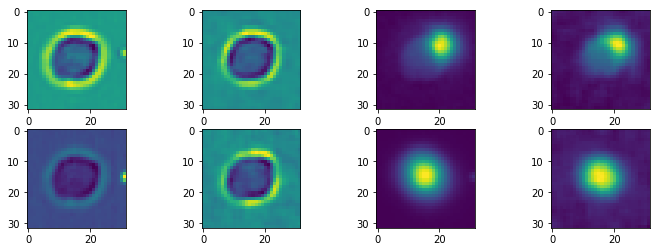

(4, 256, 128)
Epoch:  34 Iteration:  400 Loss:  169.88464
(32, 32, 4) (4, 32, 32, 1)


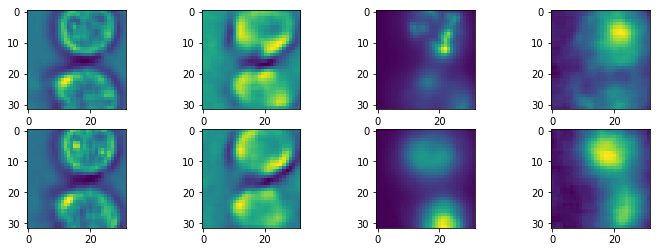

(4, 256, 128)
Epoch:  34 Iteration:  500 Loss:  173.63403
(32, 32, 4) (4, 32, 32, 1)


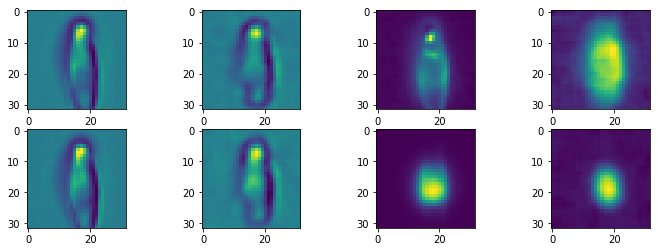

(4, 256, 128)
Epoch:  34 Iteration:  600 Loss:  174.39755
(32, 32, 4) (4, 32, 32, 1)


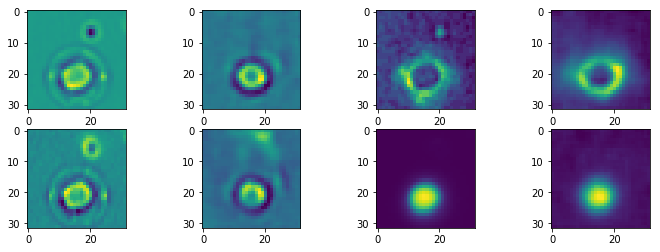

(4, 256, 128)
Epoch:  34 Iteration:  700 Loss:  173.93552
(32, 32, 4) (4, 32, 32, 1)


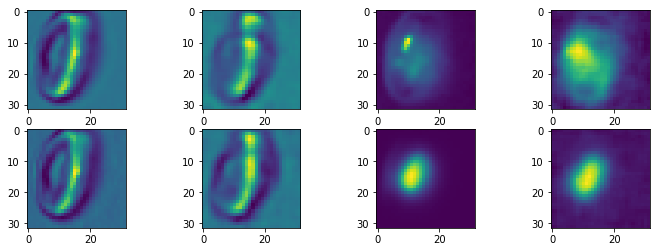

(4, 256, 128)
Epoch:  35 Iteration:  0 Loss:  170.21237
(32, 32, 4) (4, 32, 32, 1)


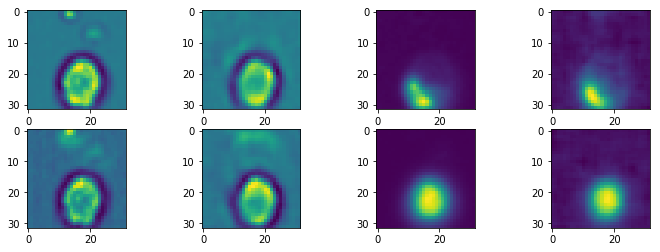

(4, 256, 128)
Epoch:  35 Iteration:  100 Loss:  163.22119
(32, 32, 4) (4, 32, 32, 1)


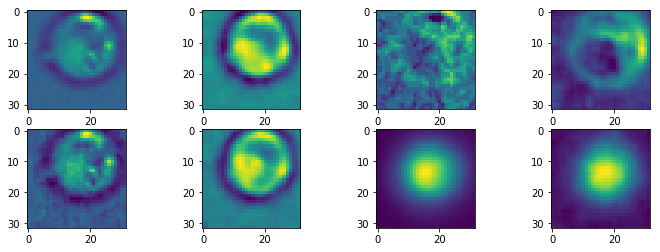

(4, 256, 128)
Epoch:  35 Iteration:  200 Loss:  166.39743
(32, 32, 4) (4, 32, 32, 1)


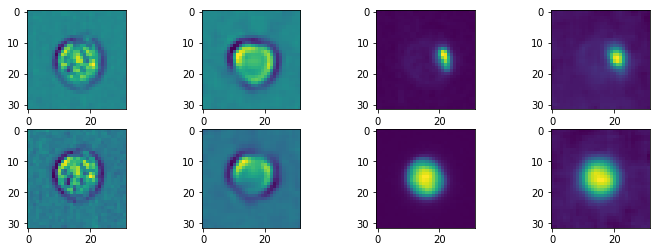

(4, 256, 128)
Epoch:  35 Iteration:  300 Loss:  167.87762
(32, 32, 4) (4, 32, 32, 1)


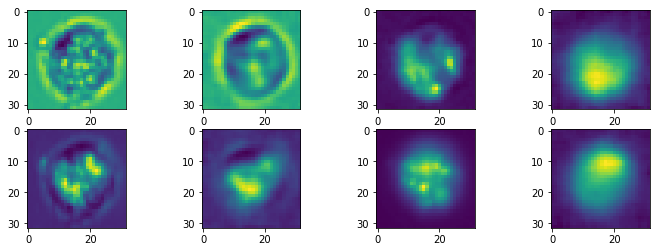

(4, 256, 128)
Epoch:  35 Iteration:  400 Loss:  170.87737
(32, 32, 4) (4, 32, 32, 1)


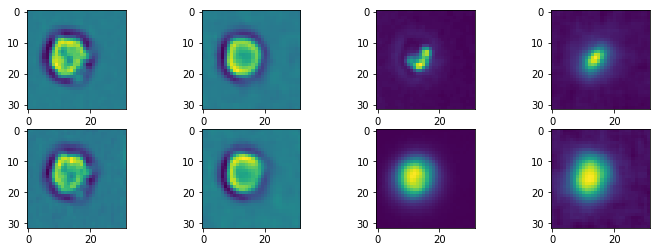

(4, 256, 128)
Epoch:  35 Iteration:  500 Loss:  172.69875
(32, 32, 4) (4, 32, 32, 1)


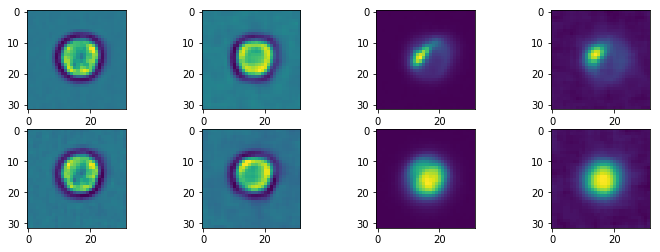

(4, 256, 128)
Epoch:  35 Iteration:  600 Loss:  174.61191
(32, 32, 4) (4, 32, 32, 1)


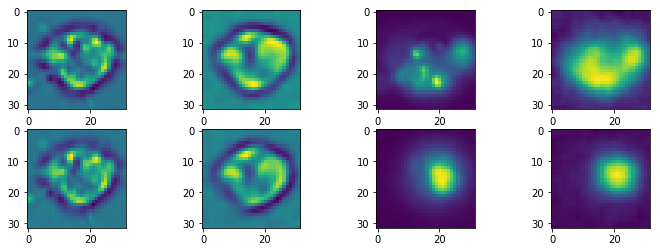

(4, 256, 128)
Epoch:  35 Iteration:  700 Loss:  174.49112
(32, 32, 4) (4, 32, 32, 1)


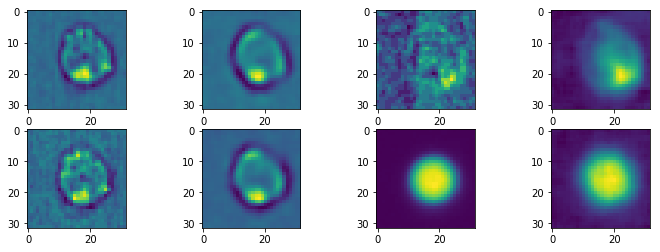

(4, 256, 128)
Epoch:  36 Iteration:  0 Loss:  168.77301
(32, 32, 4) (4, 32, 32, 1)


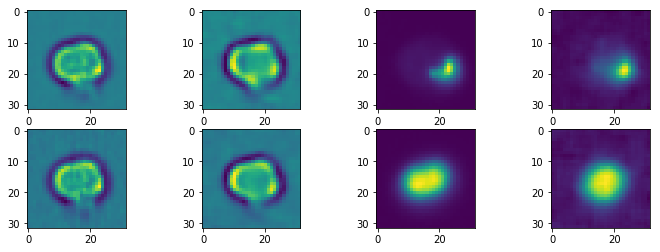

(4, 256, 128)
Epoch:  36 Iteration:  100 Loss:  165.42992
(32, 32, 4) (4, 32, 32, 1)


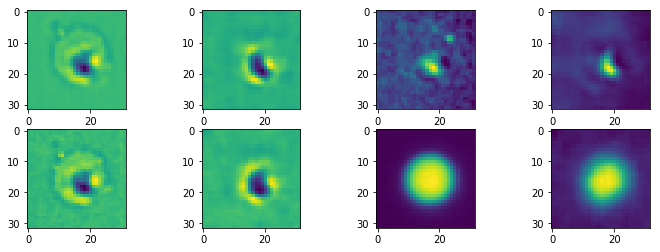

(4, 256, 128)
Epoch:  36 Iteration:  200 Loss:  167.3862
(32, 32, 4) (4, 32, 32, 1)


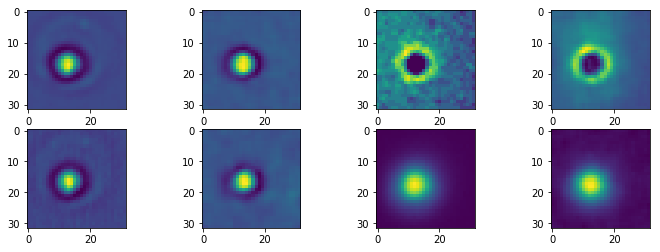

(4, 256, 128)
Epoch:  36 Iteration:  300 Loss:  167.74765
(32, 32, 4) (4, 32, 32, 1)


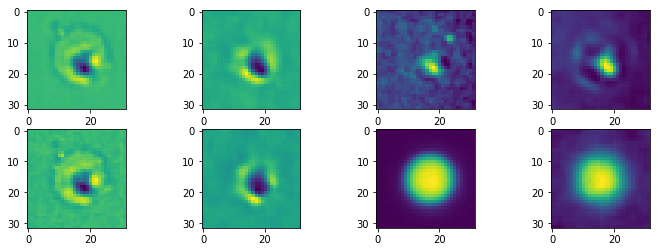

(4, 256, 128)
Epoch:  36 Iteration:  400 Loss:  166.32538
(32, 32, 4) (4, 32, 32, 1)


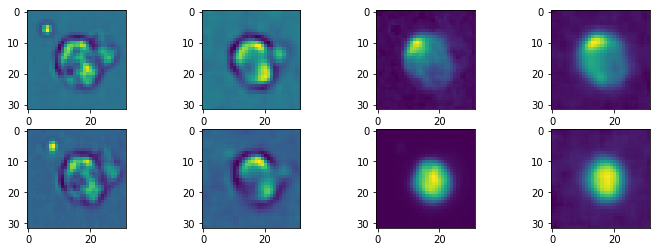

(4, 256, 128)
Epoch:  36 Iteration:  500 Loss:  169.2175
(32, 32, 4) (4, 32, 32, 1)


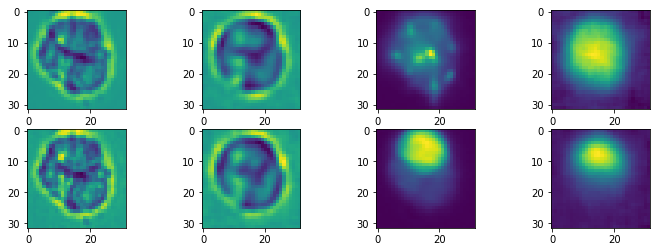

(4, 256, 128)
Epoch:  36 Iteration:  600 Loss:  171.37216
(32, 32, 4) (4, 32, 32, 1)


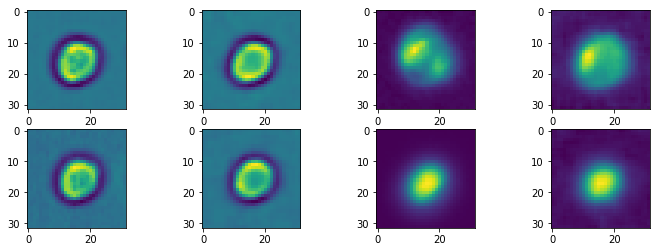

(4, 256, 128)
Epoch:  36 Iteration:  700 Loss:  171.1956
(32, 32, 4) (4, 32, 32, 1)


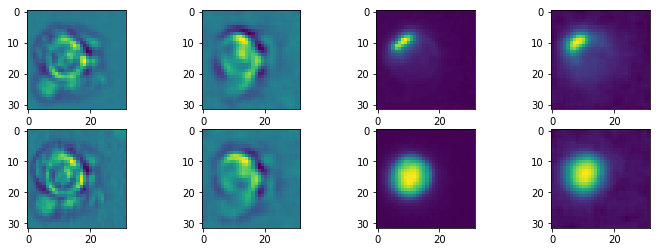

(4, 256, 128)
Epoch:  37 Iteration:  0 Loss:  167.29373
(32, 32, 4) (4, 32, 32, 1)


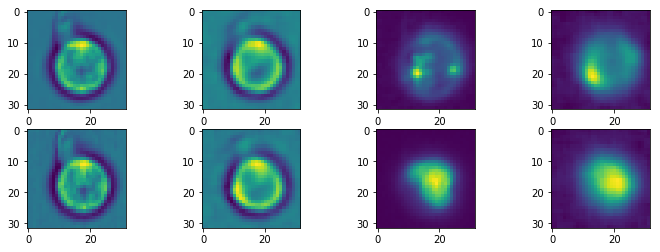

(4, 256, 128)
Epoch:  37 Iteration:  100 Loss:  161.23074
(32, 32, 4) (4, 32, 32, 1)


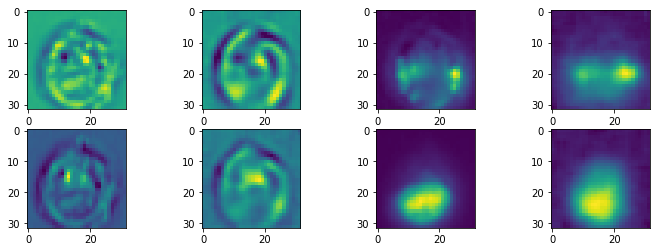

(4, 256, 128)
Epoch:  37 Iteration:  200 Loss:  163.49164
(32, 32, 4) (4, 32, 32, 1)


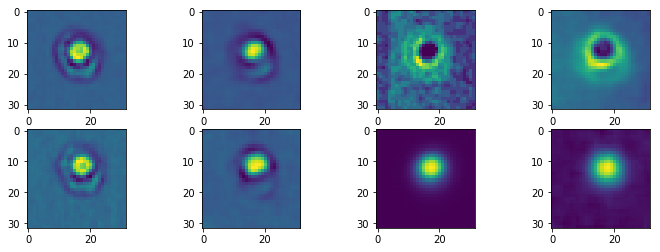

(4, 256, 128)
Epoch:  37 Iteration:  300 Loss:  166.15744
(32, 32, 4) (4, 32, 32, 1)


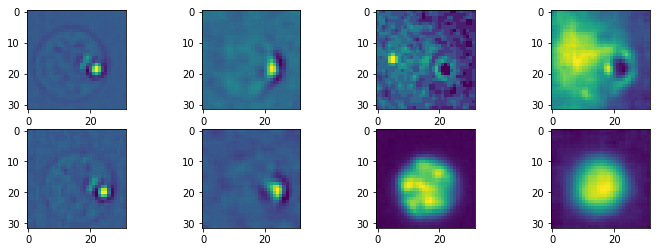

(4, 256, 128)
Epoch:  37 Iteration:  400 Loss:  167.89214
(32, 32, 4) (4, 32, 32, 1)


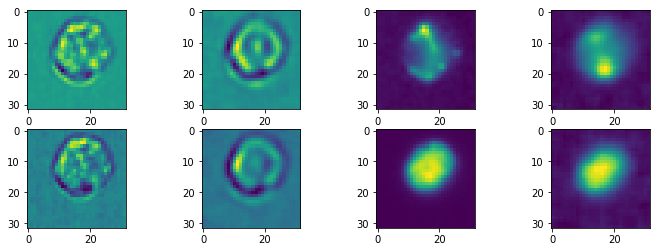

(4, 256, 128)
Epoch:  37 Iteration:  500 Loss:  171.6662
(32, 32, 4) (4, 32, 32, 1)


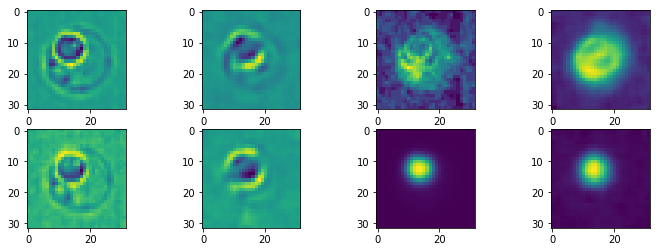

(4, 256, 128)
Epoch:  37 Iteration:  600 Loss:  172.01642
(32, 32, 4) (4, 32, 32, 1)


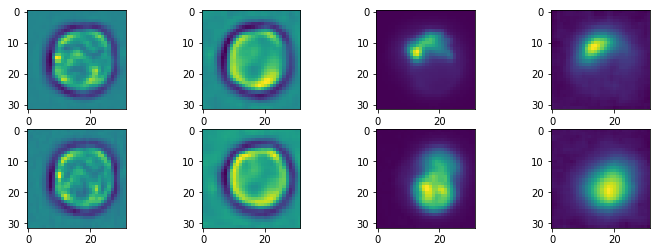

(4, 256, 128)
Epoch:  37 Iteration:  700 Loss:  171.3334
(32, 32, 4) (4, 32, 32, 1)


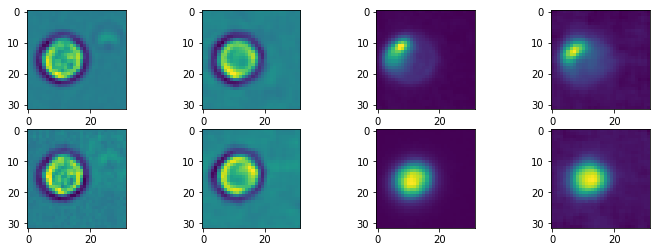

(4, 256, 128)
Epoch:  38 Iteration:  0 Loss:  168.2148
(32, 32, 4) (4, 32, 32, 1)


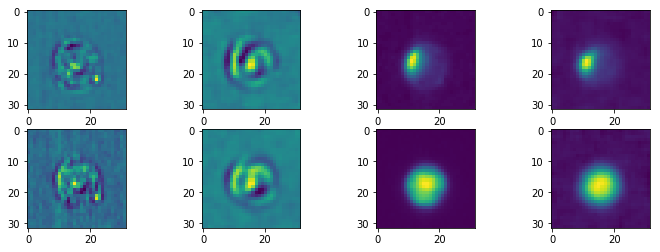

(4, 256, 128)
Epoch:  38 Iteration:  100 Loss:  158.70818
(32, 32, 4) (4, 32, 32, 1)


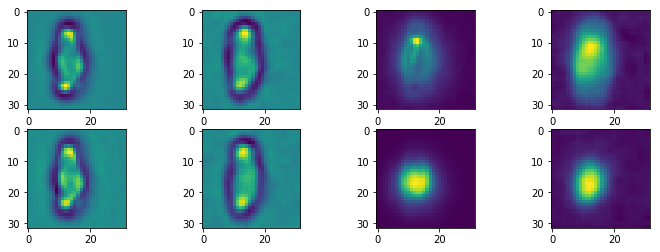

(4, 256, 128)
Epoch:  38 Iteration:  200 Loss:  163.63657
(32, 32, 4) (4, 32, 32, 1)


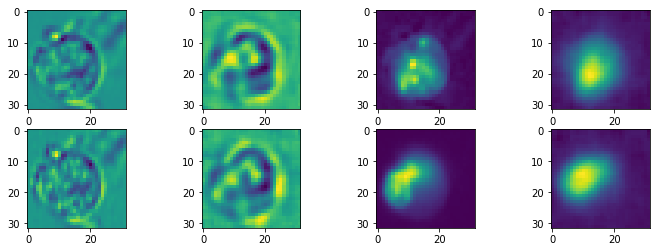

(4, 256, 128)
Epoch:  38 Iteration:  300 Loss:  164.105
(32, 32, 4) (4, 32, 32, 1)


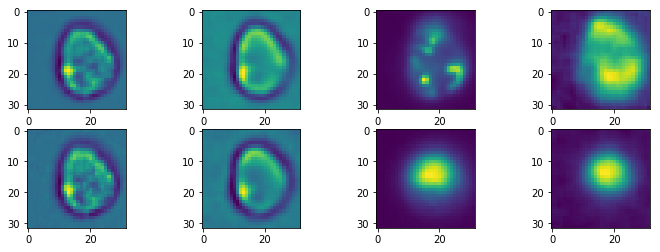

(4, 256, 128)
Epoch:  38 Iteration:  400 Loss:  166.31561
(32, 32, 4) (4, 32, 32, 1)


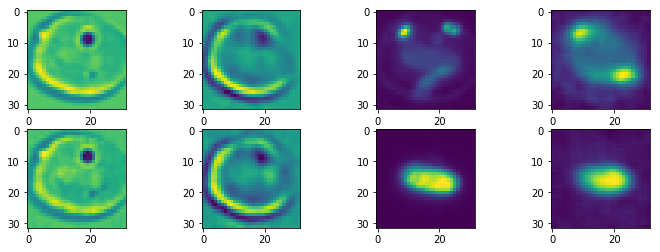

(4, 256, 128)
Epoch:  38 Iteration:  500 Loss:  170.13602
(32, 32, 4) (4, 32, 32, 1)


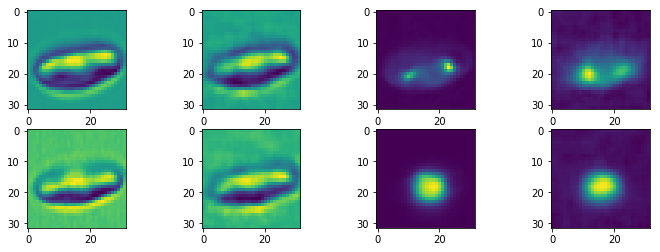

(4, 256, 128)
Epoch:  38 Iteration:  600 Loss:  171.84839
(32, 32, 4) (4, 32, 32, 1)


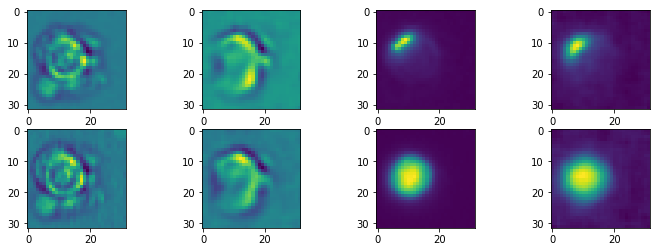

(4, 256, 128)
Epoch:  38 Iteration:  700 Loss:  170.5911
(32, 32, 4) (4, 32, 32, 1)


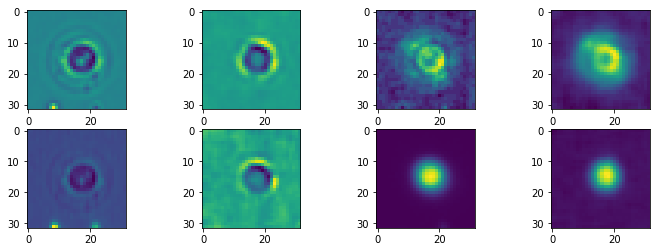

(4, 256, 128)
Epoch:  39 Iteration:  0 Loss:  167.23991
(32, 32, 4) (4, 32, 32, 1)


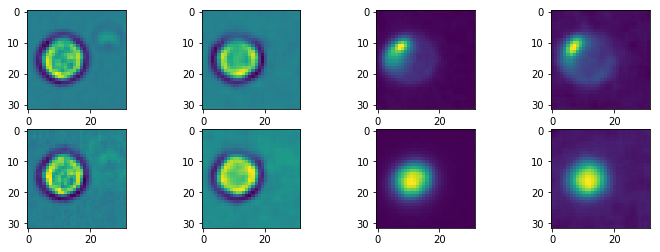

(4, 256, 128)
Epoch:  39 Iteration:  100 Loss:  162.58273
(32, 32, 4) (4, 32, 32, 1)


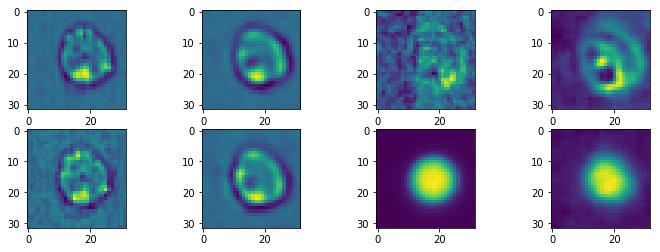

(4, 256, 128)
Epoch:  39 Iteration:  200 Loss:  163.49402
(32, 32, 4) (4, 32, 32, 1)


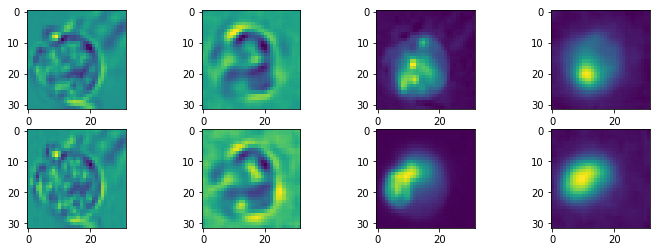

(4, 256, 128)
Epoch:  39 Iteration:  300 Loss:  163.93031
(32, 32, 4) (4, 32, 32, 1)


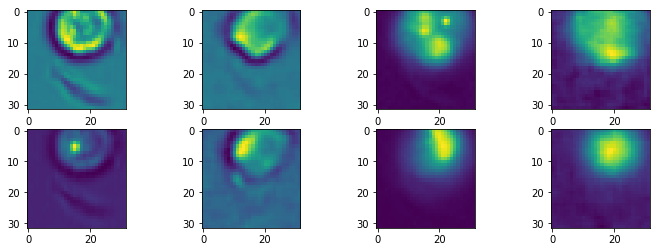

(4, 256, 128)
Epoch:  39 Iteration:  400 Loss:  164.76724
(32, 32, 4) (4, 32, 32, 1)


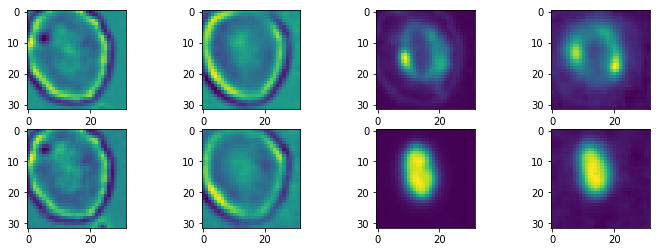

(4, 256, 128)
Epoch:  39 Iteration:  500 Loss:  168.55536
(32, 32, 4) (4, 32, 32, 1)


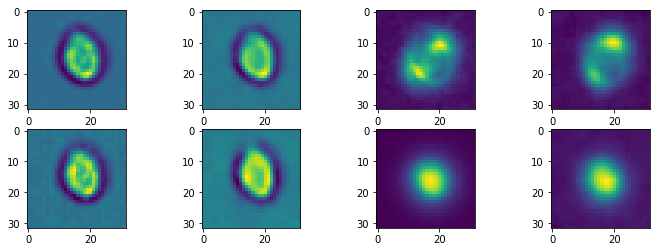

(4, 256, 128)
Epoch:  39 Iteration:  600 Loss:  170.53705
(32, 32, 4) (4, 32, 32, 1)


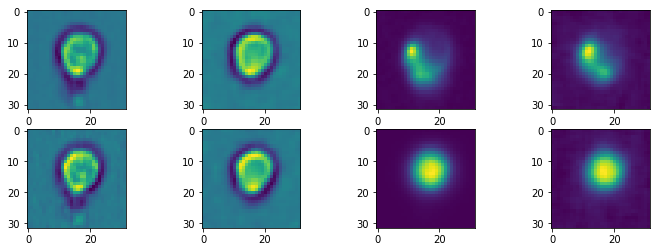

(4, 256, 128)
Epoch:  39 Iteration:  700 Loss:  170.65598
(32, 32, 4) (4, 32, 32, 1)


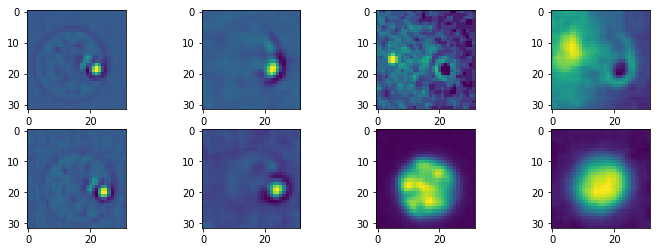

(4, 256, 128)
Epoch:  40 Iteration:  0 Loss:  164.18141
(32, 32, 4) (4, 32, 32, 1)


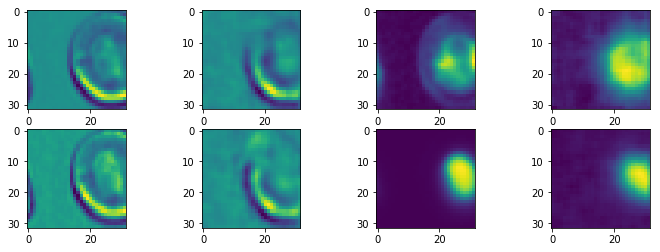

(4, 256, 128)
Epoch:  40 Iteration:  100 Loss:  163.59341
(32, 32, 4) (4, 32, 32, 1)


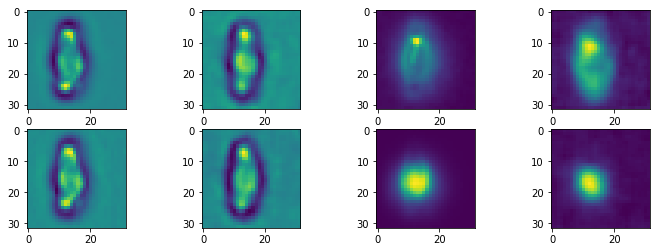

(4, 256, 128)
Epoch:  40 Iteration:  200 Loss:  161.45792
(32, 32, 4) (4, 32, 32, 1)


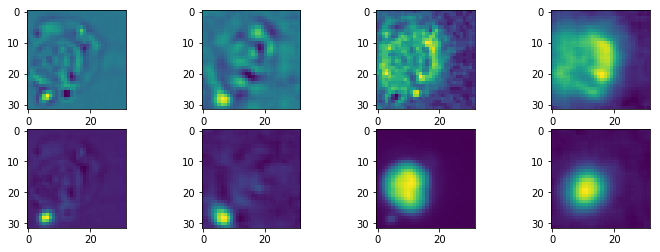

(4, 256, 128)
Epoch:  40 Iteration:  300 Loss:  163.66676
(32, 32, 4) (4, 32, 32, 1)


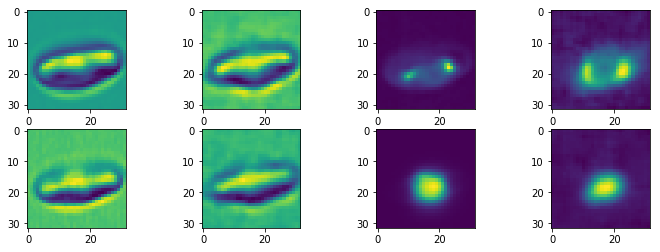

(4, 256, 128)
Epoch:  40 Iteration:  400 Loss:  165.58746
(32, 32, 4) (4, 32, 32, 1)


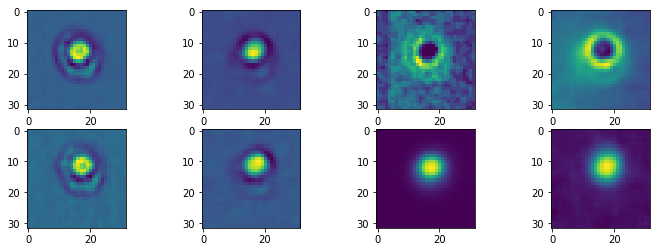

(4, 256, 128)
Epoch:  40 Iteration:  500 Loss:  168.60587
(32, 32, 4) (4, 32, 32, 1)


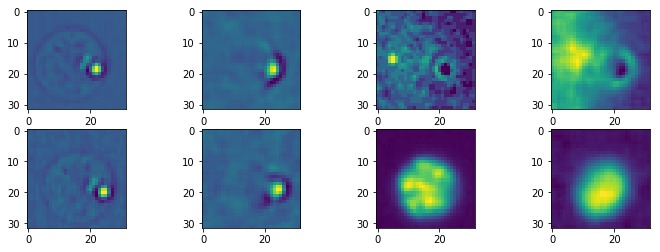

(4, 256, 128)
Epoch:  40 Iteration:  600 Loss:  167.68246
(32, 32, 4) (4, 32, 32, 1)


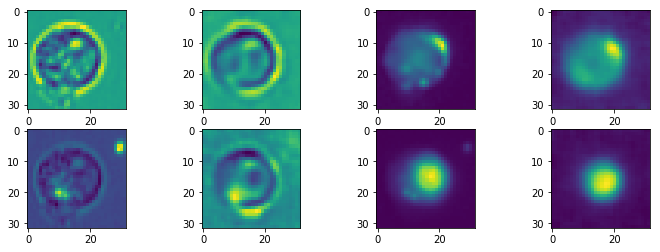

(4, 256, 128)
Epoch:  40 Iteration:  700 Loss:  169.18701
(32, 32, 4) (4, 32, 32, 1)


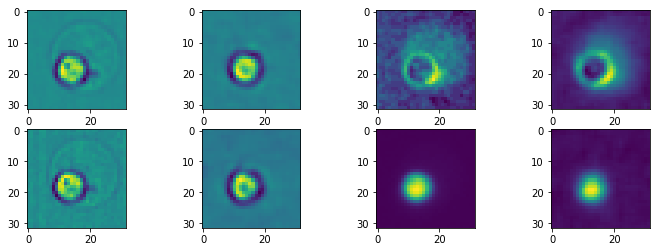

(4, 256, 128)
Epoch:  41 Iteration:  0 Loss:  166.11221
(32, 32, 4) (4, 32, 32, 1)


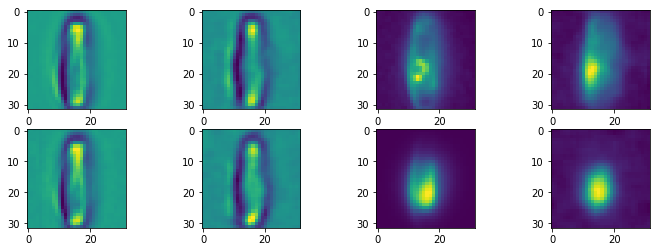

(4, 256, 128)
Epoch:  41 Iteration:  100 Loss:  161.6424
(32, 32, 4) (4, 32, 32, 1)


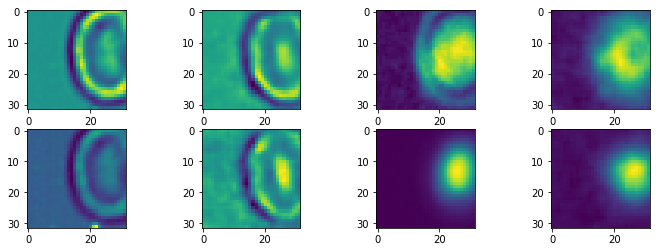

(4, 256, 128)
Epoch:  41 Iteration:  200 Loss:  160.29721
(32, 32, 4) (4, 32, 32, 1)


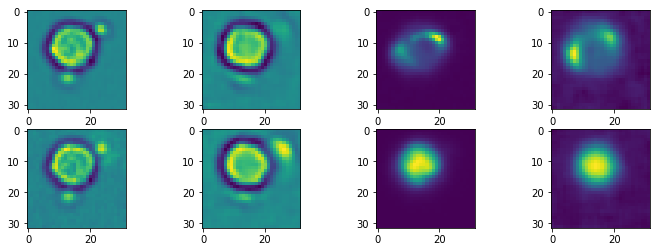

(4, 256, 128)
Epoch:  41 Iteration:  300 Loss:  161.21957
(32, 32, 4) (4, 32, 32, 1)


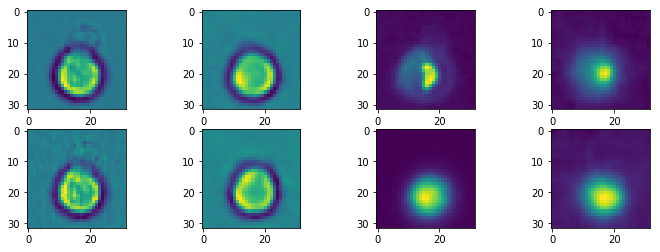

(4, 256, 128)
Epoch:  41 Iteration:  400 Loss:  162.94308
(32, 32, 4) (4, 32, 32, 1)


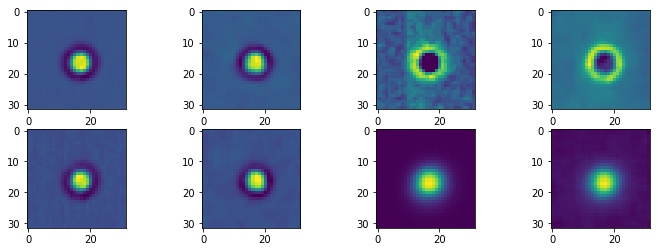

(4, 256, 128)
Epoch:  41 Iteration:  500 Loss:  170.525
(32, 32, 4) (4, 32, 32, 1)


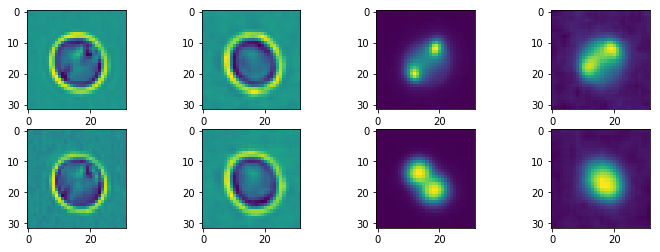

(4, 256, 128)
Epoch:  41 Iteration:  600 Loss:  167.70474
(32, 32, 4) (4, 32, 32, 1)


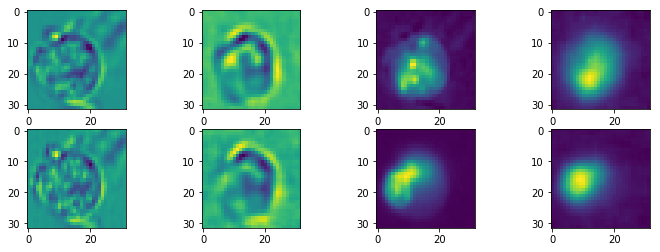

(4, 256, 128)
Epoch:  41 Iteration:  700 Loss:  167.6499
(32, 32, 4) (4, 32, 32, 1)


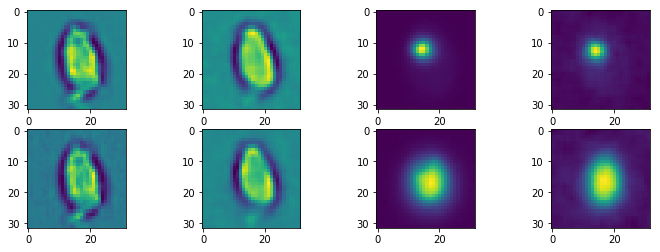

(4, 256, 128)
Epoch:  42 Iteration:  0 Loss:  164.45459
(32, 32, 4) (4, 32, 32, 1)


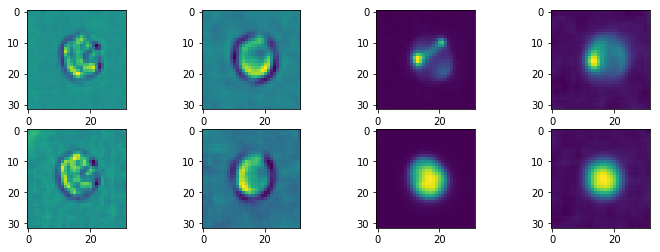

(4, 256, 128)
Epoch:  42 Iteration:  100 Loss:  159.6532
(32, 32, 4) (4, 32, 32, 1)


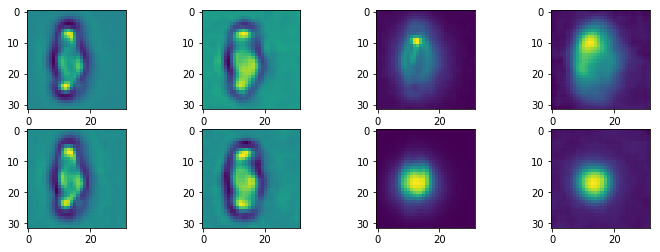

(4, 256, 128)
Epoch:  42 Iteration:  200 Loss:  161.05362
(32, 32, 4) (4, 32, 32, 1)


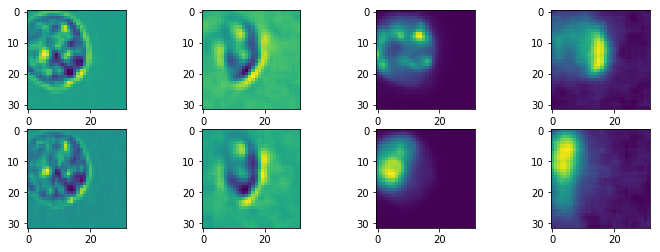

(4, 256, 128)
Epoch:  42 Iteration:  300 Loss:  162.64284
(32, 32, 4) (4, 32, 32, 1)


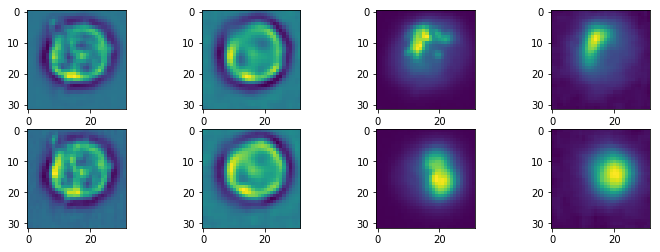

(4, 256, 128)
Epoch:  42 Iteration:  400 Loss:  164.2999
(32, 32, 4) (4, 32, 32, 1)


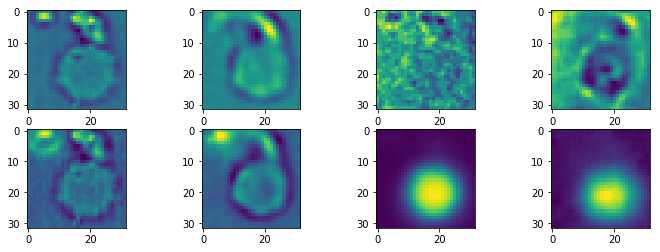

(4, 256, 128)
Epoch:  42 Iteration:  500 Loss:  167.3725
(32, 32, 4) (4, 32, 32, 1)


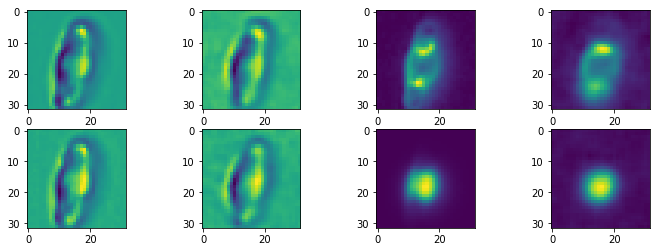

(4, 256, 128)
Epoch:  42 Iteration:  600 Loss:  167.31961
(32, 32, 4) (4, 32, 32, 1)


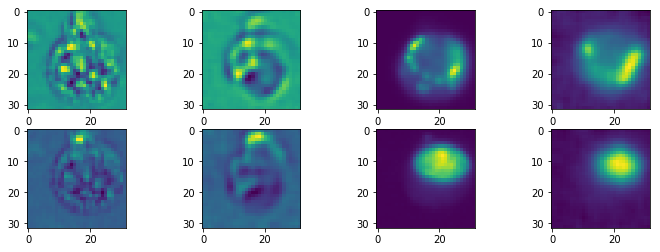

(4, 256, 128)
Epoch:  42 Iteration:  700 Loss:  165.50262
(32, 32, 4) (4, 32, 32, 1)


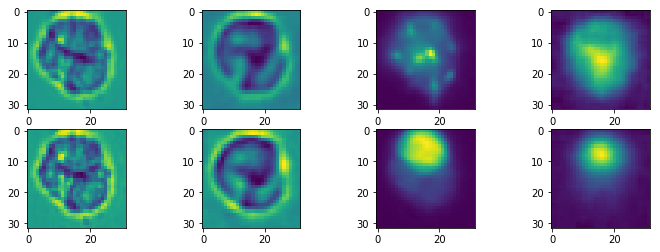

(4, 256, 128)
Epoch:  43 Iteration:  0 Loss:  164.45831
(32, 32, 4) (4, 32, 32, 1)


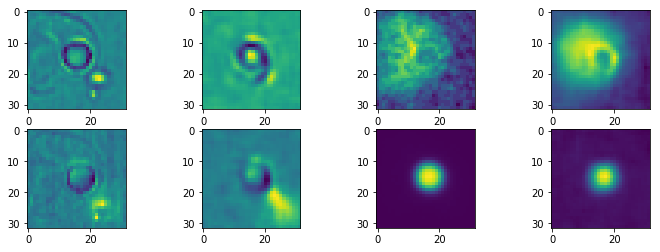

(4, 256, 128)
Epoch:  43 Iteration:  100 Loss:  158.51064
(32, 32, 4) (4, 32, 32, 1)


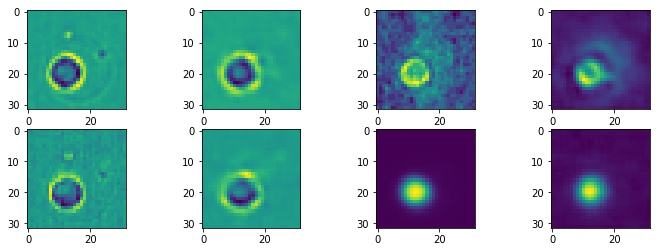

(4, 256, 128)
Epoch:  43 Iteration:  200 Loss:  158.71455
(32, 32, 4) (4, 32, 32, 1)


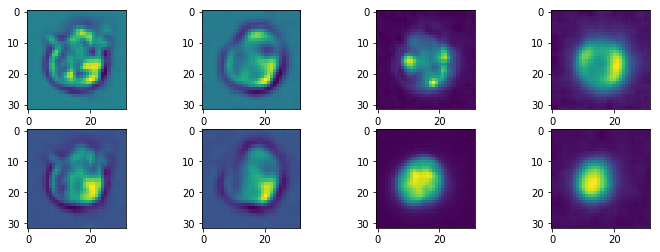

(4, 256, 128)
Epoch:  43 Iteration:  300 Loss:  161.53252
(32, 32, 4) (4, 32, 32, 1)


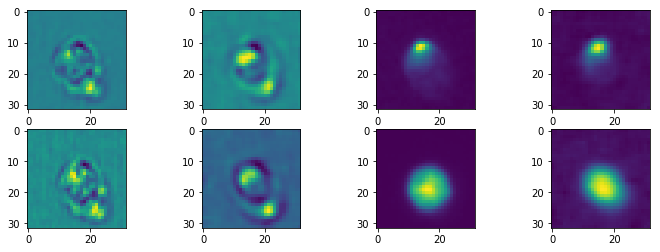

(4, 256, 128)
Epoch:  43 Iteration:  400 Loss:  164.506
(32, 32, 4) (4, 32, 32, 1)


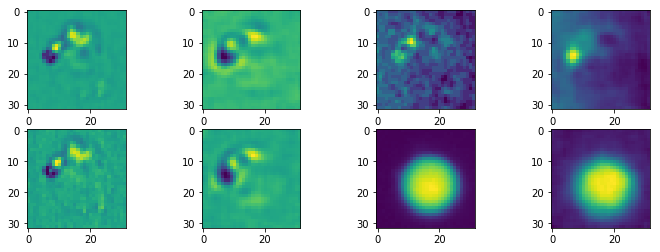

(4, 256, 128)
Epoch:  43 Iteration:  500 Loss:  168.44855
(32, 32, 4) (4, 32, 32, 1)


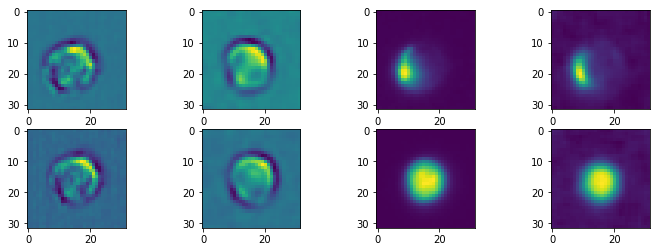

(4, 256, 128)
Epoch:  43 Iteration:  600 Loss:  164.38786
(32, 32, 4) (4, 32, 32, 1)


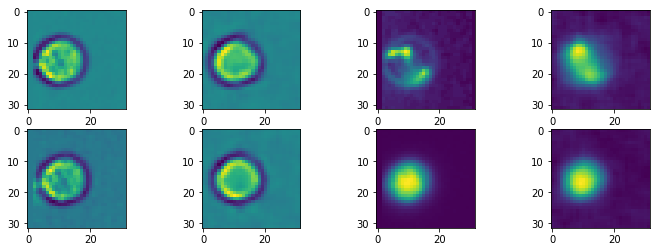

(4, 256, 128)
Epoch:  43 Iteration:  700 Loss:  164.38008
(32, 32, 4) (4, 32, 32, 1)


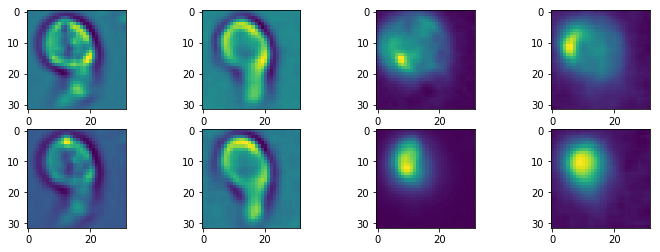

(4, 256, 128)
Epoch:  44 Iteration:  0 Loss:  162.52246
(32, 32, 4) (4, 32, 32, 1)


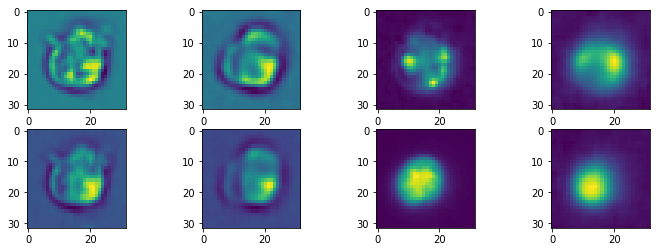

(4, 256, 128)
Epoch:  44 Iteration:  100 Loss:  158.39136
(32, 32, 4) (4, 32, 32, 1)


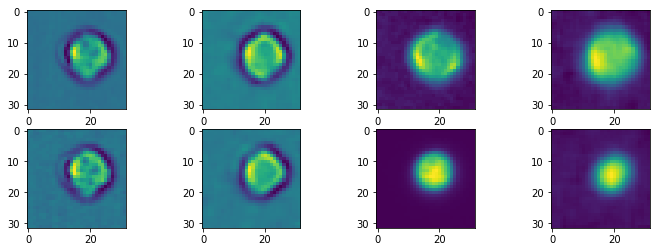

(4, 256, 128)
Epoch:  44 Iteration:  200 Loss:  159.18182
(32, 32, 4) (4, 32, 32, 1)


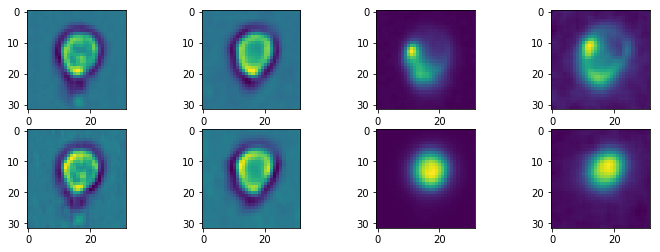

(4, 256, 128)
Epoch:  44 Iteration:  300 Loss:  160.68509
(32, 32, 4) (4, 32, 32, 1)


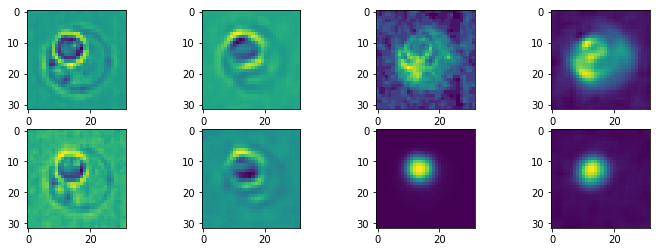

(4, 256, 128)
Epoch:  44 Iteration:  400 Loss:  161.09999
(32, 32, 4) (4, 32, 32, 1)


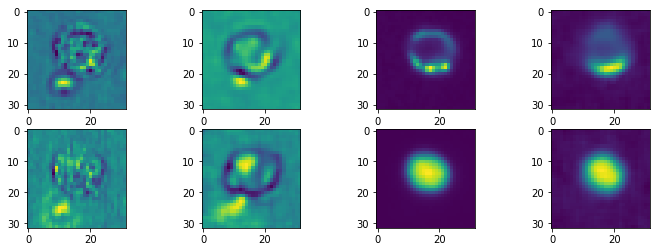

(4, 256, 128)
Epoch:  44 Iteration:  500 Loss:  165.47809
(32, 32, 4) (4, 32, 32, 1)


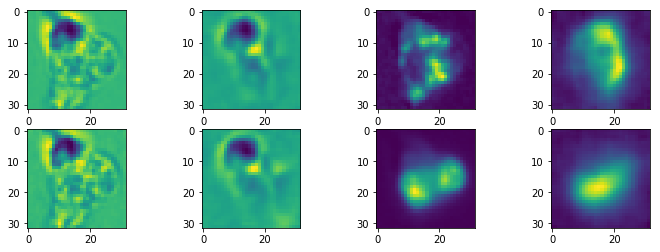

(4, 256, 128)
Epoch:  44 Iteration:  600 Loss:  165.6095
(32, 32, 4) (4, 32, 32, 1)


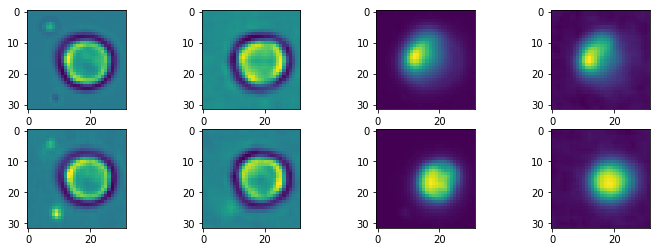

(4, 256, 128)
Epoch:  44 Iteration:  700 Loss:  167.12341
(32, 32, 4) (4, 32, 32, 1)


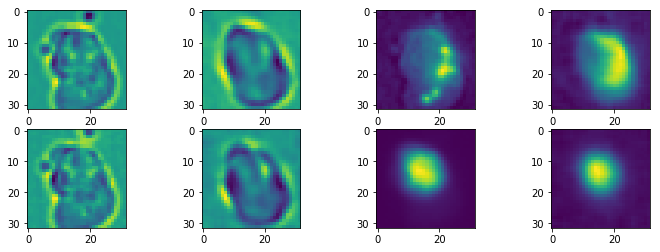

(4, 256, 128)
Epoch:  45 Iteration:  0 Loss:  162.772
(32, 32, 4) (4, 32, 32, 1)


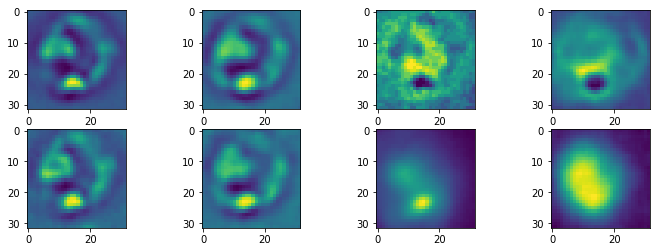

(4, 256, 128)
Epoch:  45 Iteration:  100 Loss:  155.35323
(32, 32, 4) (4, 32, 32, 1)


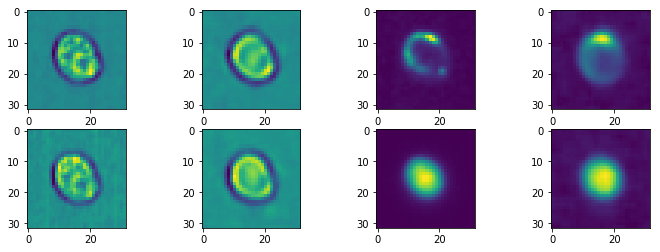

(4, 256, 128)
Epoch:  45 Iteration:  200 Loss:  157.56303
(32, 32, 4) (4, 32, 32, 1)


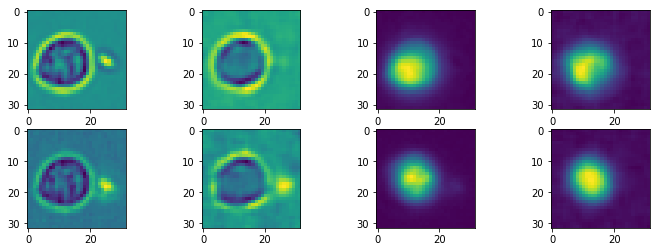

(4, 256, 128)
Epoch:  45 Iteration:  300 Loss:  159.79826
(32, 32, 4) (4, 32, 32, 1)


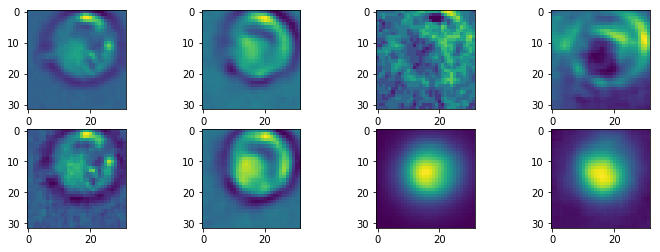

(4, 256, 128)
Epoch:  45 Iteration:  400 Loss:  162.4191
(32, 32, 4) (4, 32, 32, 1)


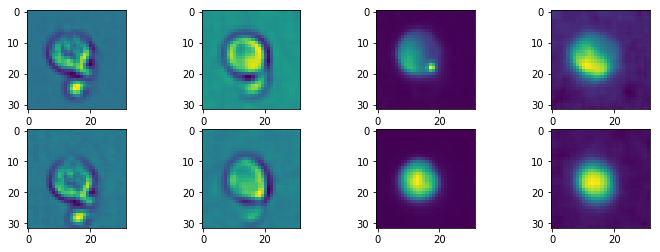

(4, 256, 128)
Epoch:  45 Iteration:  500 Loss:  164.83621
(32, 32, 4) (4, 32, 32, 1)


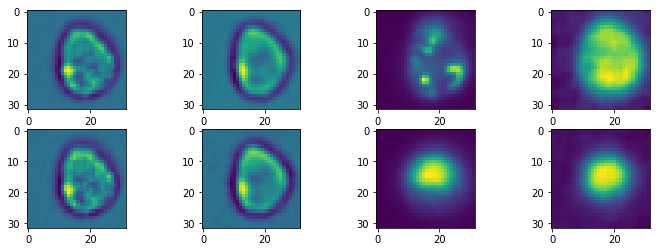

(4, 256, 128)
Epoch:  45 Iteration:  600 Loss:  164.33862
(32, 32, 4) (4, 32, 32, 1)


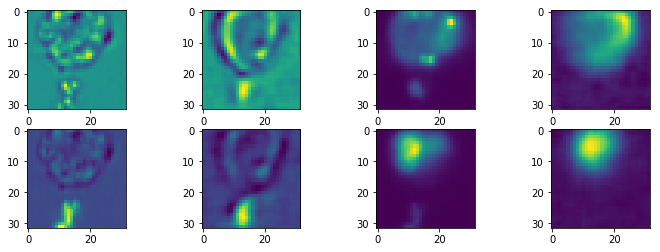

(4, 256, 128)
Epoch:  45 Iteration:  700 Loss:  165.14468
(32, 32, 4) (4, 32, 32, 1)


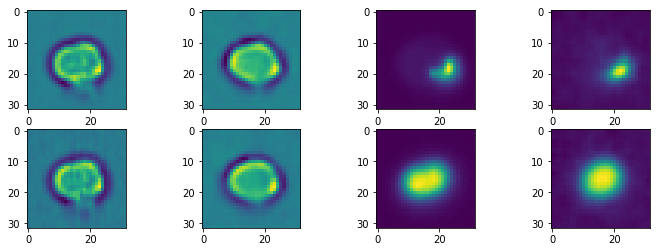

(4, 256, 128)
Epoch:  46 Iteration:  0 Loss:  159.46162
(32, 32, 4) (4, 32, 32, 1)


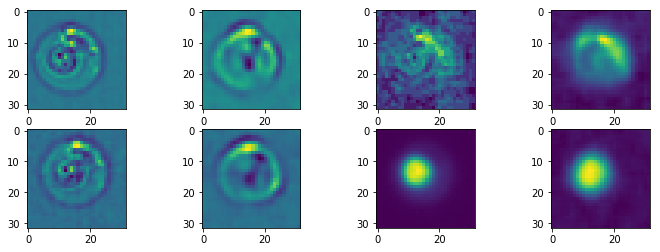

(4, 256, 128)
Epoch:  46 Iteration:  100 Loss:  156.98575
(32, 32, 4) (4, 32, 32, 1)


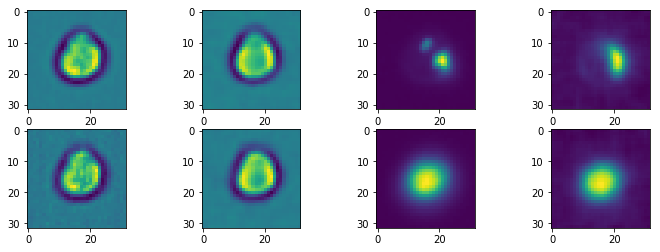

(4, 256, 128)
Epoch:  46 Iteration:  200 Loss:  155.939
(32, 32, 4) (4, 32, 32, 1)


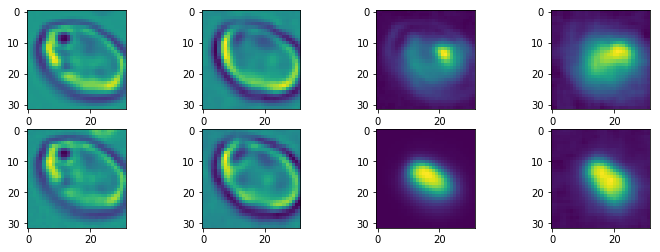

(4, 256, 128)
Epoch:  46 Iteration:  300 Loss:  157.02519
(32, 32, 4) (4, 32, 32, 1)


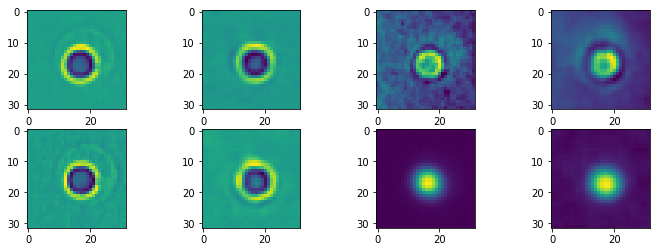

(4, 256, 128)
Epoch:  46 Iteration:  400 Loss:  159.66977
(32, 32, 4) (4, 32, 32, 1)


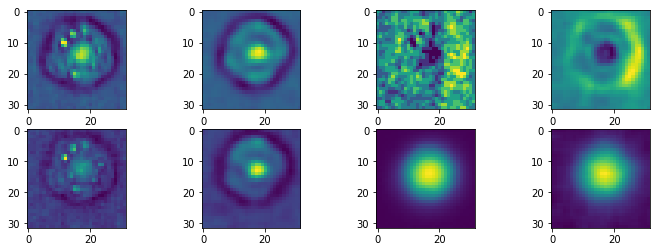

(4, 256, 128)
Epoch:  46 Iteration:  500 Loss:  164.5682
(32, 32, 4) (4, 32, 32, 1)


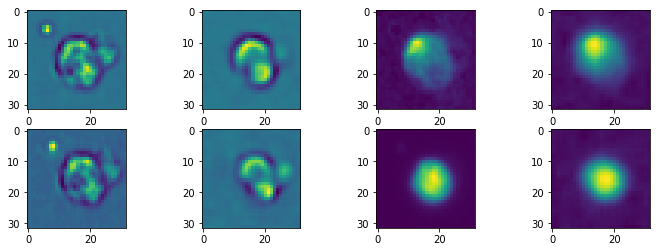

(4, 256, 128)
Epoch:  46 Iteration:  600 Loss:  163.53534
(32, 32, 4) (4, 32, 32, 1)


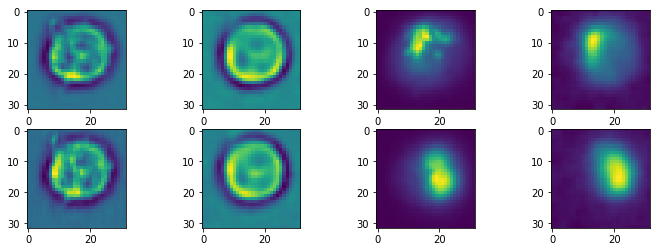

(4, 256, 128)
Epoch:  46 Iteration:  700 Loss:  164.39566
(32, 32, 4) (4, 32, 32, 1)


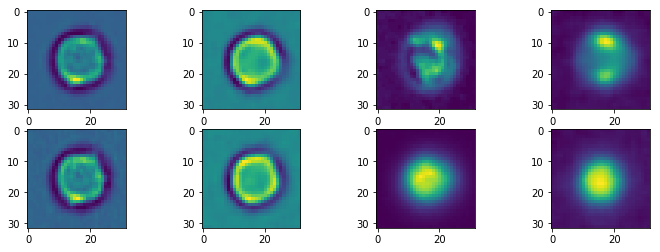

(4, 256, 128)
Epoch:  47 Iteration:  0 Loss:  158.98636
(32, 32, 4) (4, 32, 32, 1)


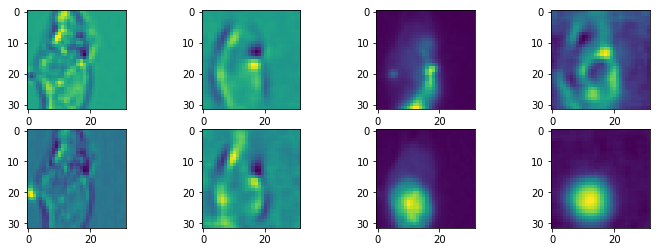

(4, 256, 128)
Epoch:  47 Iteration:  100 Loss:  155.87338
(32, 32, 4) (4, 32, 32, 1)


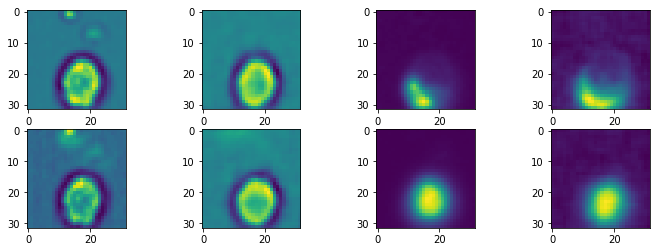

(4, 256, 128)
Epoch:  47 Iteration:  200 Loss:  156.23341
(32, 32, 4) (4, 32, 32, 1)


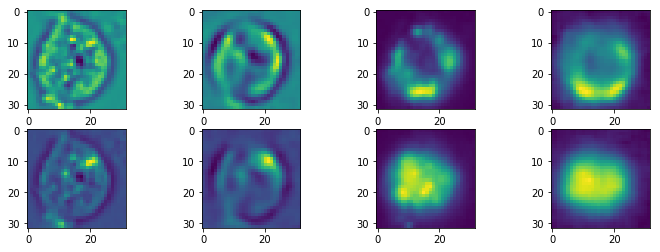

(4, 256, 128)
Epoch:  47 Iteration:  300 Loss:  157.51776
(32, 32, 4) (4, 32, 32, 1)


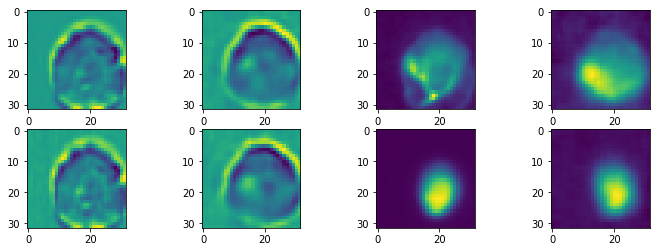

(4, 256, 128)
Epoch:  47 Iteration:  400 Loss:  159.8264
(32, 32, 4) (4, 32, 32, 1)


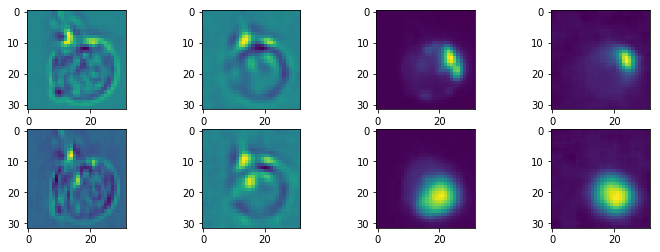

(4, 256, 128)
Epoch:  47 Iteration:  500 Loss:  163.884
(32, 32, 4) (4, 32, 32, 1)


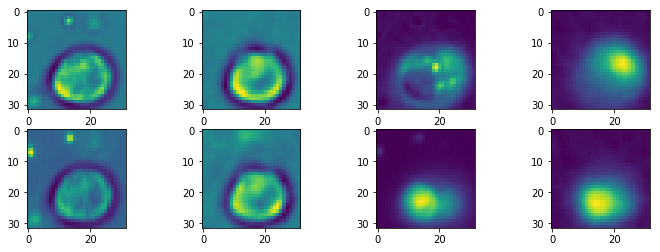

(4, 256, 128)
Epoch:  47 Iteration:  600 Loss:  162.61978
(32, 32, 4) (4, 32, 32, 1)


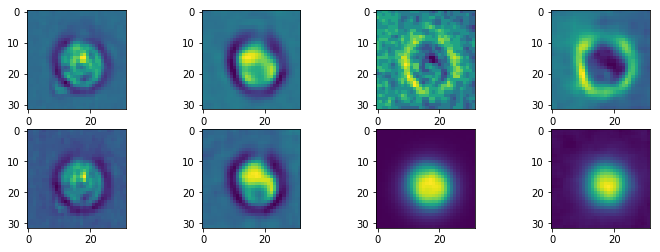

(4, 256, 128)
Epoch:  47 Iteration:  700 Loss:  163.86298
(32, 32, 4) (4, 32, 32, 1)


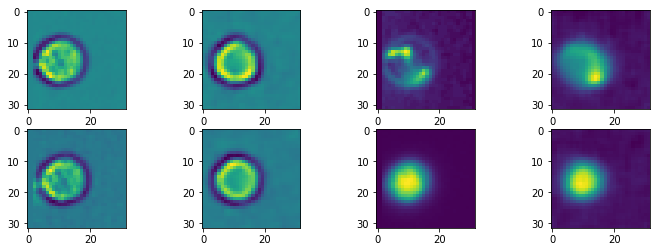

(4, 256, 128)
Epoch:  48 Iteration:  0 Loss:  159.24875
(32, 32, 4) (4, 32, 32, 1)


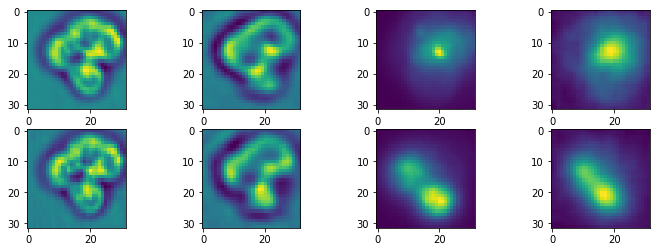

(4, 256, 128)
Epoch:  48 Iteration:  100 Loss:  154.15746
(32, 32, 4) (4, 32, 32, 1)


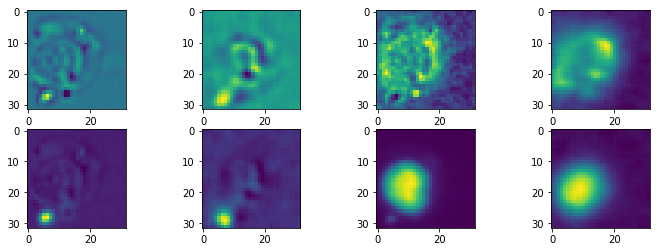

(4, 256, 128)
Epoch:  48 Iteration:  200 Loss:  157.29573
(32, 32, 4) (4, 32, 32, 1)


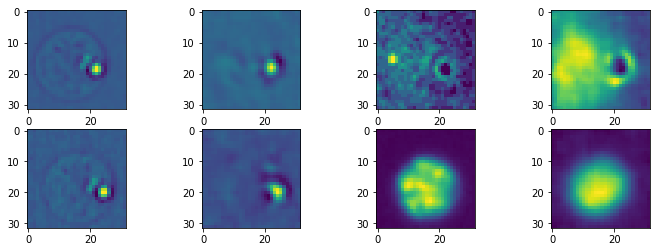

(4, 256, 128)
Epoch:  48 Iteration:  300 Loss:  158.03485
(32, 32, 4) (4, 32, 32, 1)


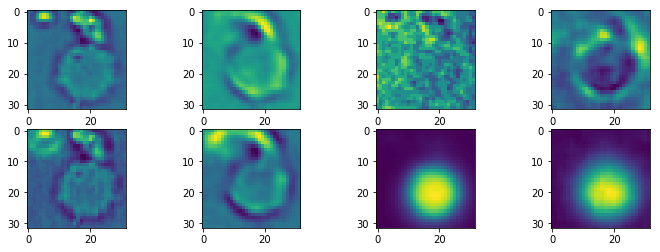

(4, 256, 128)
Epoch:  48 Iteration:  400 Loss:  160.1844
(32, 32, 4) (4, 32, 32, 1)


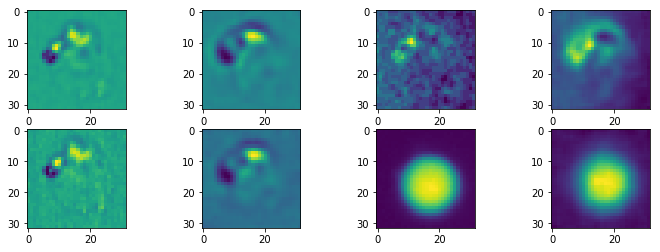

(4, 256, 128)
Epoch:  48 Iteration:  500 Loss:  163.84863
(32, 32, 4) (4, 32, 32, 1)


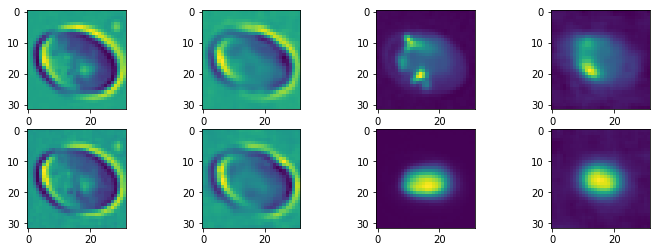

(4, 256, 128)
Epoch:  48 Iteration:  600 Loss:  164.25134
(32, 32, 4) (4, 32, 32, 1)


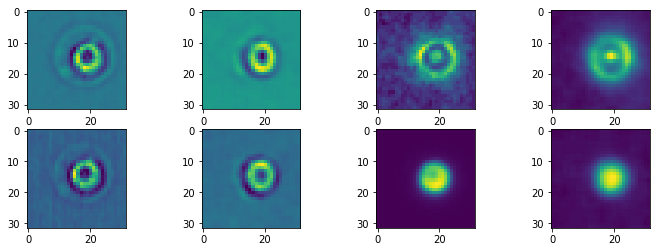

(4, 256, 128)
Epoch:  48 Iteration:  700 Loss:  162.73116
(32, 32, 4) (4, 32, 32, 1)


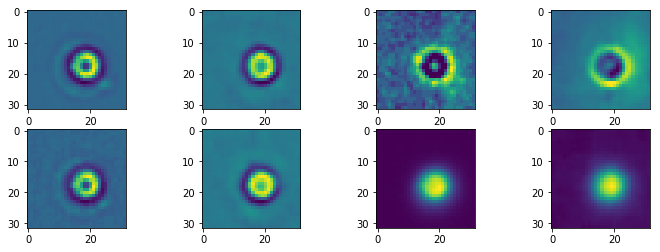

(4, 256, 128)
Epoch:  49 Iteration:  0 Loss:  158.63608
(32, 32, 4) (4, 32, 32, 1)


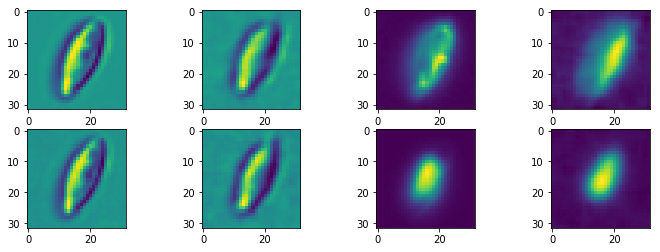

(4, 256, 128)
Epoch:  49 Iteration:  100 Loss:  154.81813
(32, 32, 4) (4, 32, 32, 1)


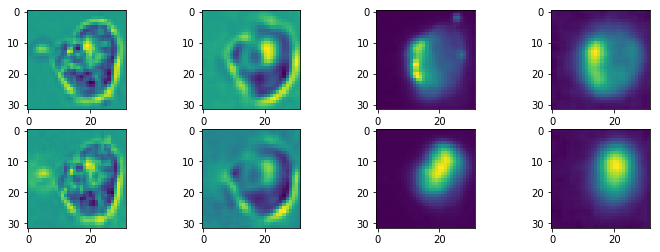

(4, 256, 128)
Epoch:  49 Iteration:  200 Loss:  155.05582
(32, 32, 4) (4, 32, 32, 1)


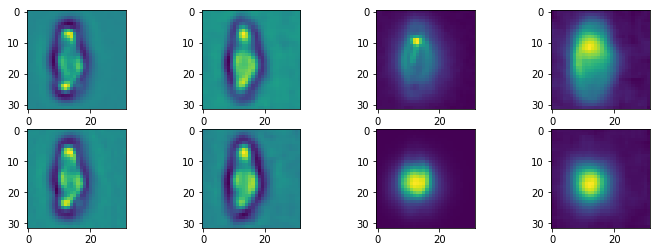

(4, 256, 128)
Epoch:  49 Iteration:  300 Loss:  156.086
(32, 32, 4) (4, 32, 32, 1)


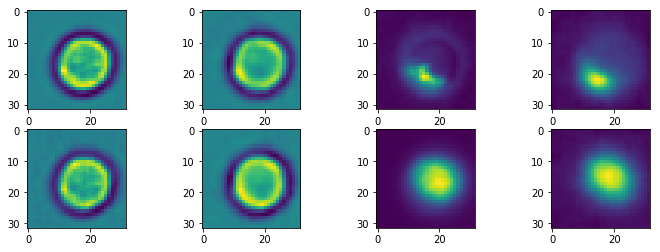

(4, 256, 128)
Epoch:  49 Iteration:  400 Loss:  157.40773
(32, 32, 4) (4, 32, 32, 1)


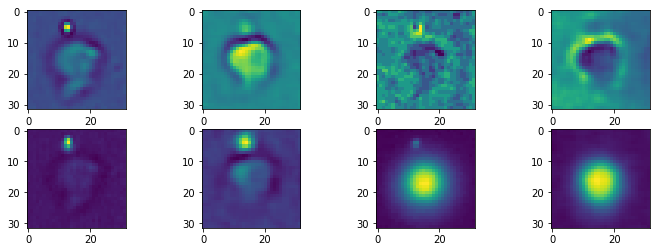

(4, 256, 128)
Epoch:  49 Iteration:  500 Loss:  162.35533
(32, 32, 4) (4, 32, 32, 1)


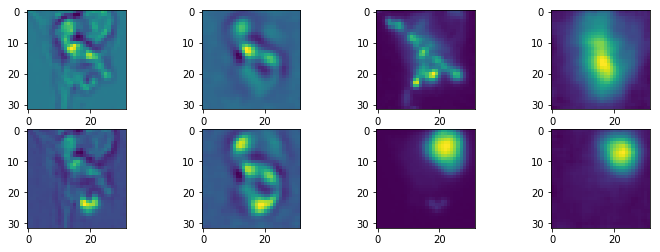

(4, 256, 128)
Epoch:  49 Iteration:  600 Loss:  162.89151
(32, 32, 4) (4, 32, 32, 1)


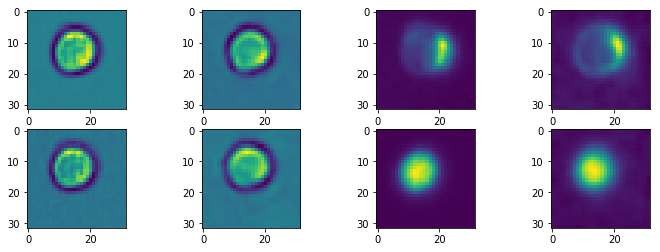

(4, 256, 128)
Epoch:  49 Iteration:  700 Loss:  161.73817
(32, 32, 4) (4, 32, 32, 1)


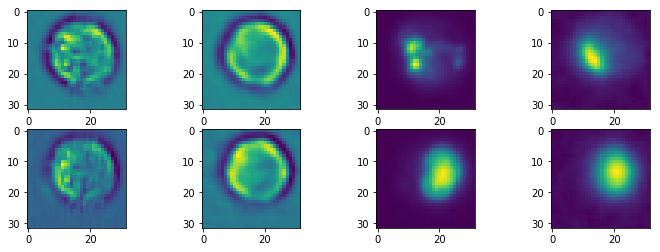

(4, 256, 128)
Epoch:  50 Iteration:  0 Loss:  159.11578
(32, 32, 4) (4, 32, 32, 1)


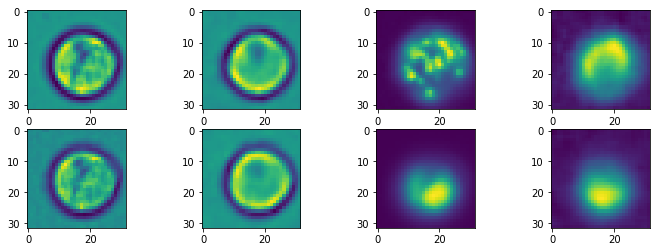

(4, 256, 128)
Epoch:  50 Iteration:  100 Loss:  153.46828
(32, 32, 4) (4, 32, 32, 1)


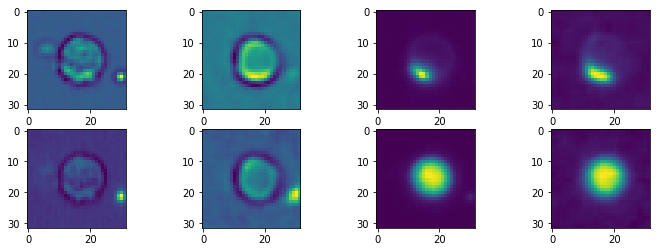

(4, 256, 128)
Epoch:  50 Iteration:  200 Loss:  155.6298
(32, 32, 4) (4, 32, 32, 1)


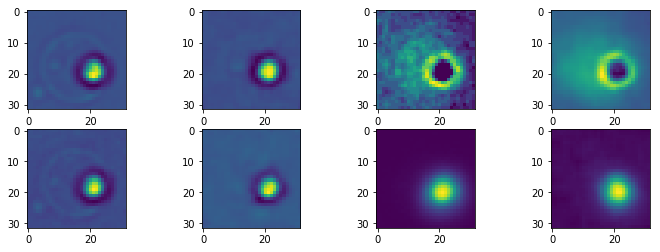

(4, 256, 128)
Epoch:  50 Iteration:  300 Loss:  156.89789
(32, 32, 4) (4, 32, 32, 1)


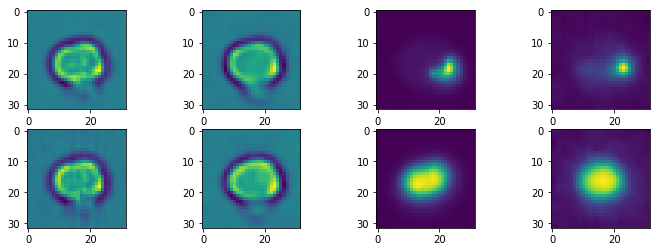

(4, 256, 128)
Epoch:  50 Iteration:  400 Loss:  157.06432
(32, 32, 4) (4, 32, 32, 1)


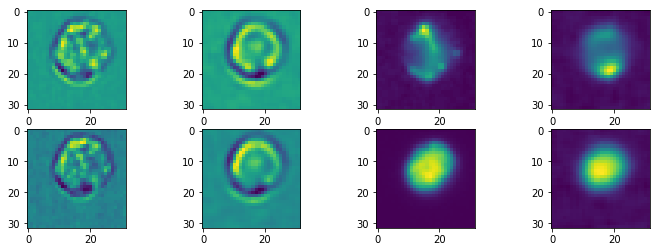

(4, 256, 128)
Epoch:  50 Iteration:  500 Loss:  163.963
(32, 32, 4) (4, 32, 32, 1)


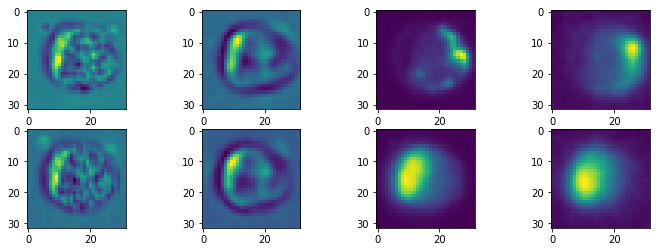

(4, 256, 128)
Epoch:  50 Iteration:  600 Loss:  161.9253
(32, 32, 4) (4, 32, 32, 1)


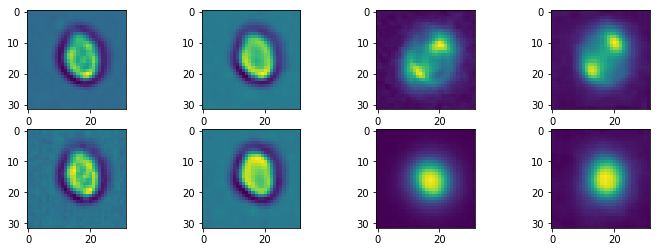

(4, 256, 128)
Epoch:  50 Iteration:  700 Loss:  161.2457
(32, 32, 4) (4, 32, 32, 1)


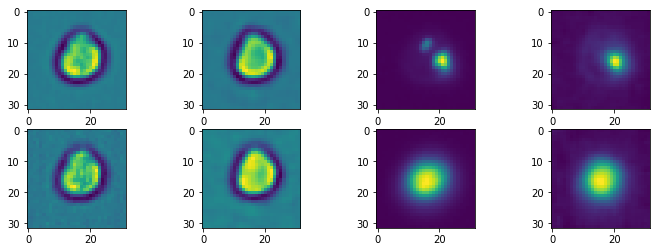

(4, 256, 128)
Epoch:  51 Iteration:  0 Loss:  156.34122
(32, 32, 4) (4, 32, 32, 1)


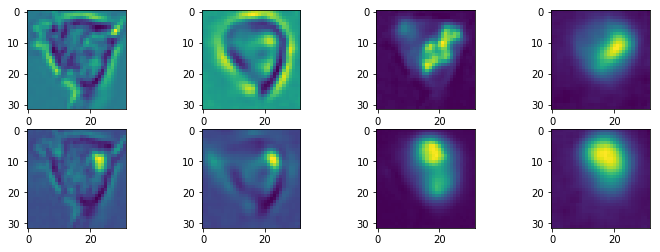

(4, 256, 128)
Epoch:  51 Iteration:  100 Loss:  153.2639
(32, 32, 4) (4, 32, 32, 1)


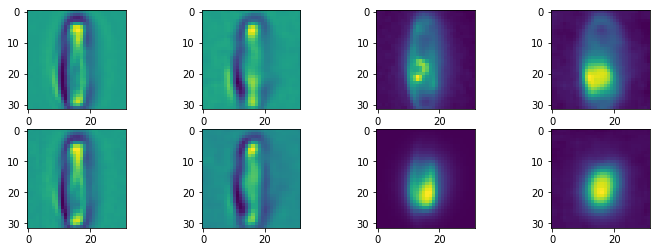

(4, 256, 128)
Epoch:  51 Iteration:  200 Loss:  155.15771
(32, 32, 4) (4, 32, 32, 1)


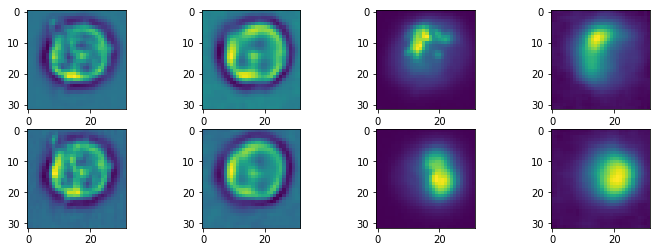

(4, 256, 128)
Epoch:  51 Iteration:  300 Loss:  154.87758
(32, 32, 4) (4, 32, 32, 1)


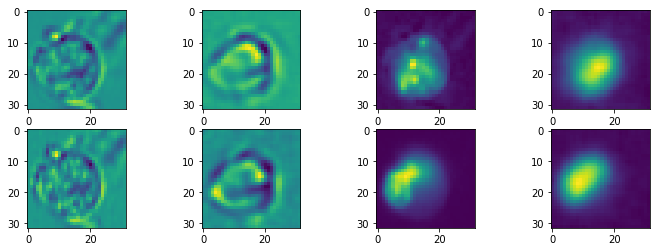

(4, 256, 128)
Epoch:  51 Iteration:  400 Loss:  156.72989
(32, 32, 4) (4, 32, 32, 1)


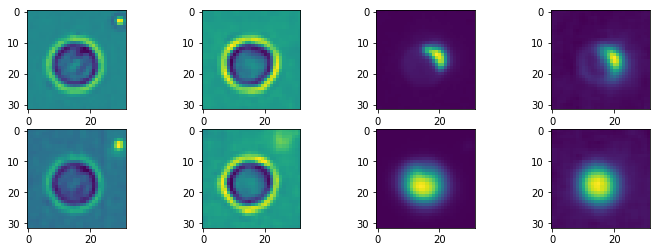

(4, 256, 128)
Epoch:  51 Iteration:  500 Loss:  160.76694
(32, 32, 4) (4, 32, 32, 1)


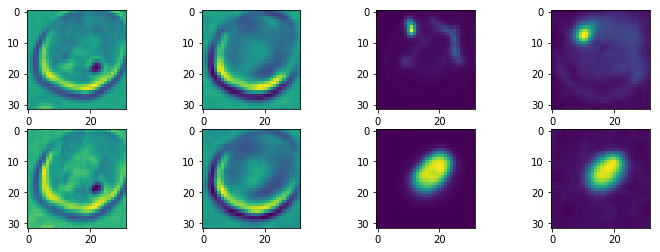

(4, 256, 128)
Epoch:  51 Iteration:  600 Loss:  160.17804
(32, 32, 4) (4, 32, 32, 1)


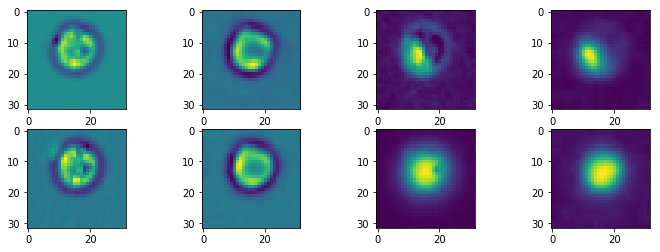

(4, 256, 128)
Epoch:  51 Iteration:  700 Loss:  162.23257
(32, 32, 4) (4, 32, 32, 1)


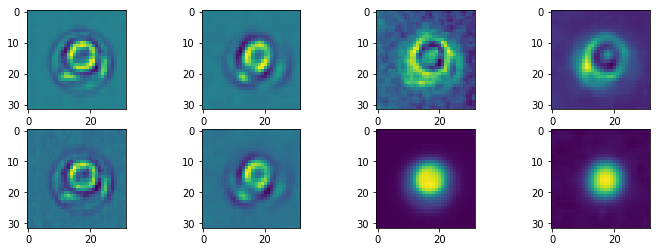

(4, 256, 128)
Epoch:  52 Iteration:  0 Loss:  157.21432
(32, 32, 4) (4, 32, 32, 1)


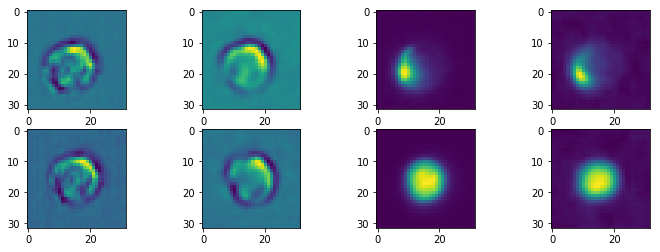

(4, 256, 128)
Epoch:  52 Iteration:  100 Loss:  152.56813
(32, 32, 4) (4, 32, 32, 1)


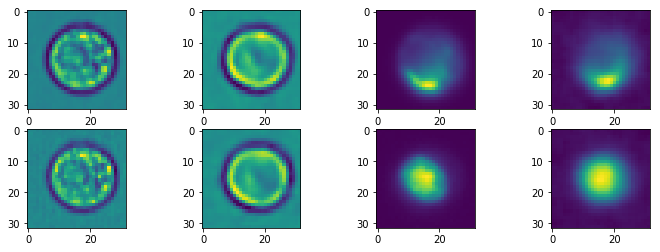

(4, 256, 128)
Epoch:  52 Iteration:  200 Loss:  153.96054
(32, 32, 4) (4, 32, 32, 1)


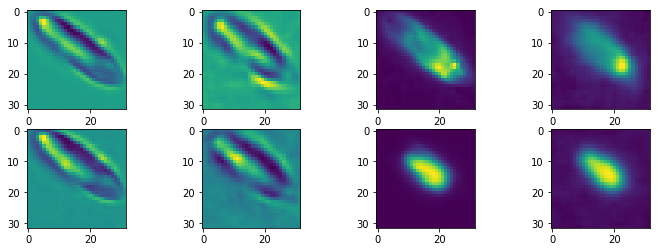

(4, 256, 128)
Epoch:  52 Iteration:  300 Loss:  155.996
(32, 32, 4) (4, 32, 32, 1)


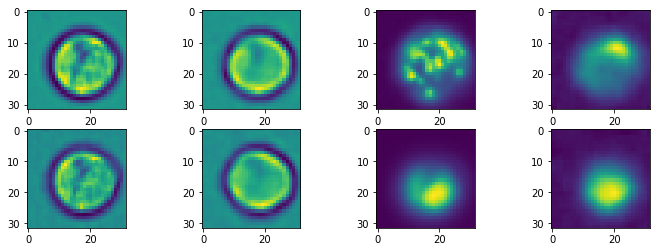

(4, 256, 128)
Epoch:  52 Iteration:  400 Loss:  158.0066
(32, 32, 4) (4, 32, 32, 1)


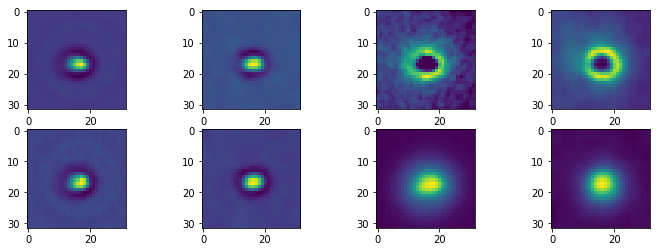

(4, 256, 128)
Epoch:  52 Iteration:  500 Loss:  159.62442
(32, 32, 4) (4, 32, 32, 1)


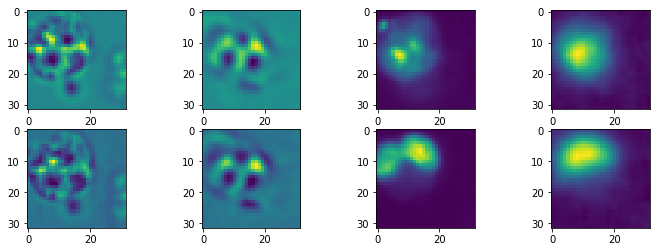

(4, 256, 128)
Epoch:  52 Iteration:  600 Loss:  160.0993
(32, 32, 4) (4, 32, 32, 1)


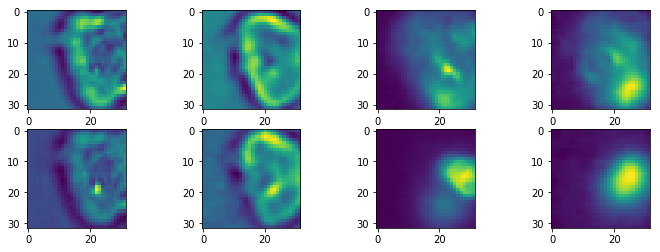

(4, 256, 128)
Epoch:  52 Iteration:  700 Loss:  164.01248
(32, 32, 4) (4, 32, 32, 1)


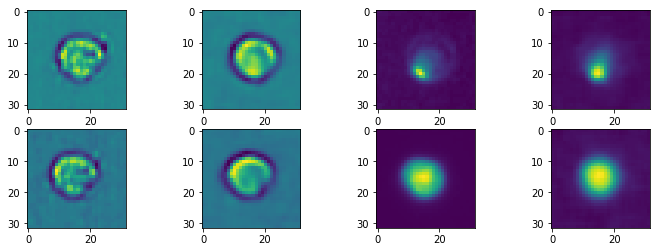

(4, 256, 128)
Epoch:  53 Iteration:  0 Loss:  156.99329
(32, 32, 4) (4, 32, 32, 1)


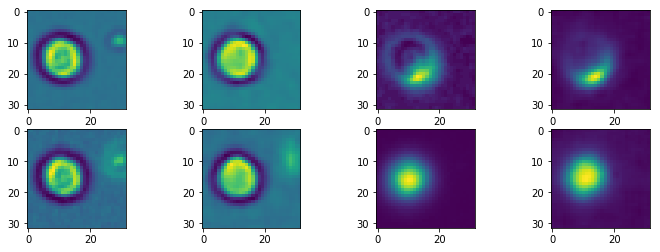

(4, 256, 128)
Epoch:  53 Iteration:  100 Loss:  151.6404
(32, 32, 4) (4, 32, 32, 1)


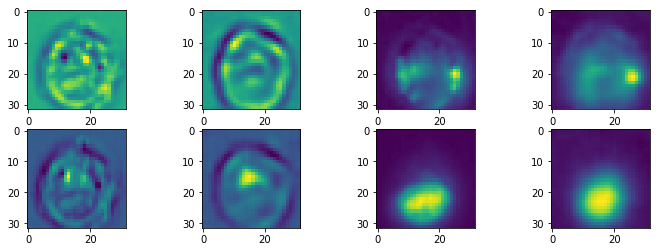

(4, 256, 128)
Epoch:  53 Iteration:  200 Loss:  152.90813
(32, 32, 4) (4, 32, 32, 1)


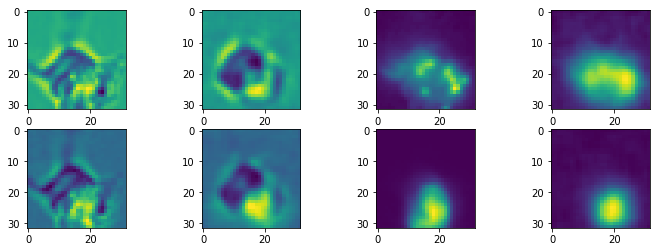

(4, 256, 128)
Epoch:  53 Iteration:  300 Loss:  157.25679
(32, 32, 4) (4, 32, 32, 1)


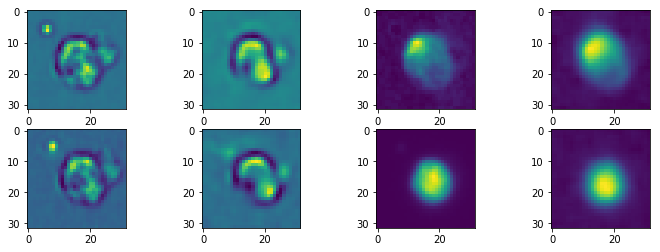

(4, 256, 128)
Epoch:  53 Iteration:  400 Loss:  156.99725
(32, 32, 4) (4, 32, 32, 1)


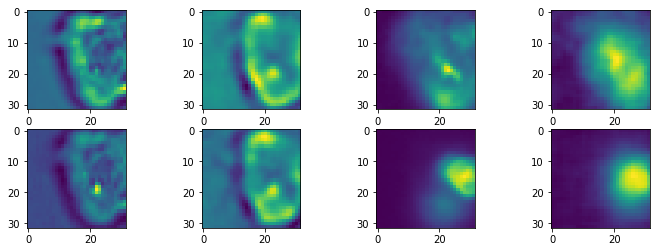

(4, 256, 128)
Epoch:  53 Iteration:  500 Loss:  160.23647
(32, 32, 4) (4, 32, 32, 1)


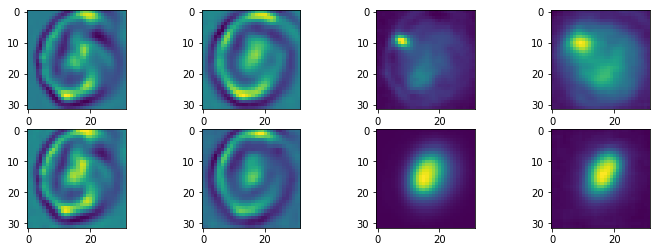

(4, 256, 128)
Epoch:  53 Iteration:  600 Loss:  160.33322
(32, 32, 4) (4, 32, 32, 1)


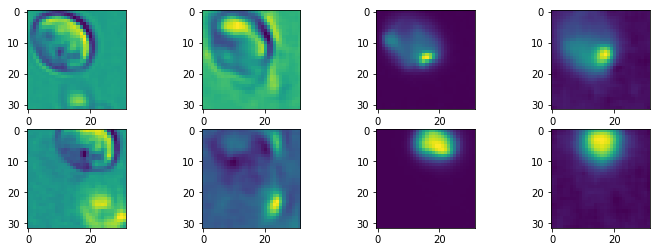

(4, 256, 128)
Epoch:  53 Iteration:  700 Loss:  160.07793
(32, 32, 4) (4, 32, 32, 1)


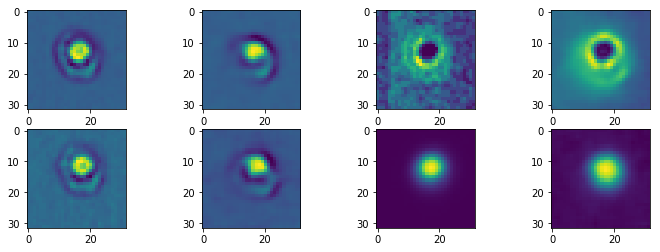

(4, 256, 128)
Epoch:  54 Iteration:  0 Loss:  156.6099
(32, 32, 4) (4, 32, 32, 1)


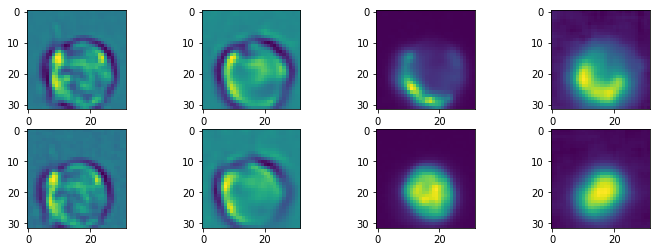

(4, 256, 128)
Epoch:  54 Iteration:  100 Loss:  152.79329
(32, 32, 4) (4, 32, 32, 1)


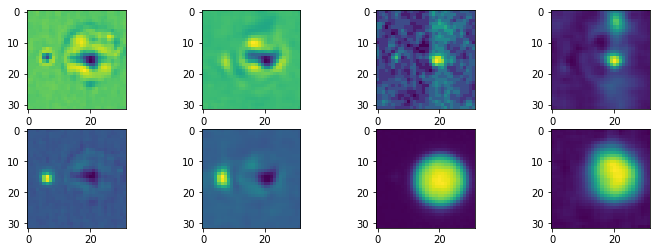

(4, 256, 128)
Epoch:  54 Iteration:  200 Loss:  152.69928
(32, 32, 4) (4, 32, 32, 1)


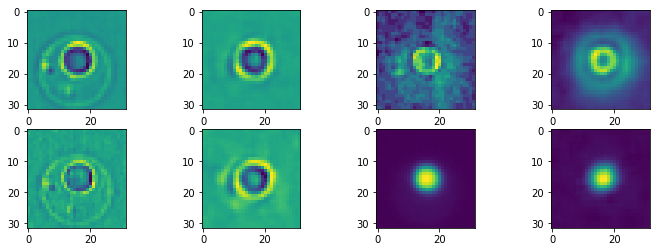

(4, 256, 128)
Epoch:  54 Iteration:  300 Loss:  154.30629
(32, 32, 4) (4, 32, 32, 1)


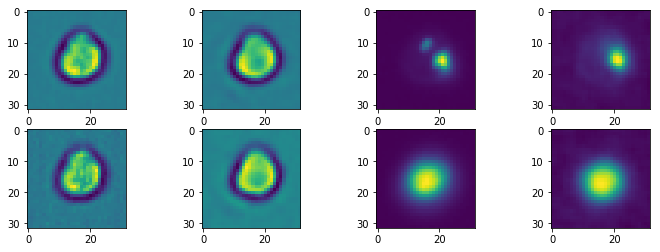

(4, 256, 128)
Epoch:  54 Iteration:  400 Loss:  154.6253
(32, 32, 4) (4, 32, 32, 1)


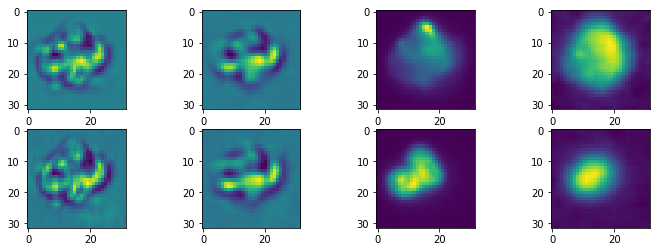

(4, 256, 128)
Epoch:  54 Iteration:  500 Loss:  161.09326
(32, 32, 4) (4, 32, 32, 1)


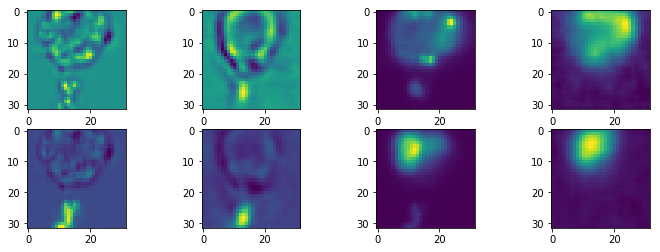

(4, 256, 128)
Epoch:  54 Iteration:  600 Loss:  159.5536
(32, 32, 4) (4, 32, 32, 1)


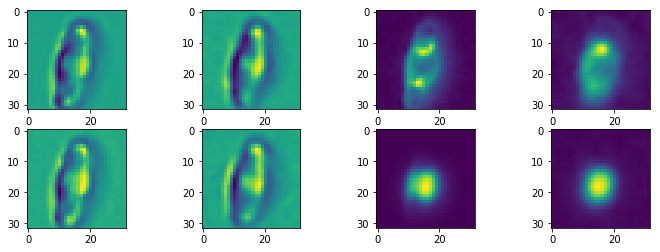

(4, 256, 128)
Epoch:  54 Iteration:  700 Loss:  160.10052
(32, 32, 4) (4, 32, 32, 1)


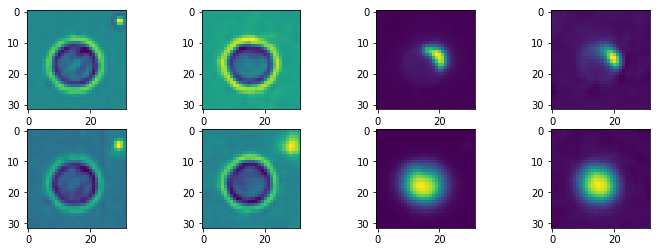

(4, 256, 128)
Epoch:  55 Iteration:  0 Loss:  153.0545
(32, 32, 4) (4, 32, 32, 1)


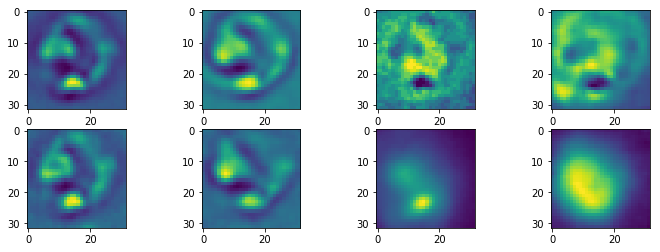

(4, 256, 128)
Epoch:  55 Iteration:  100 Loss:  151.61105
(32, 32, 4) (4, 32, 32, 1)


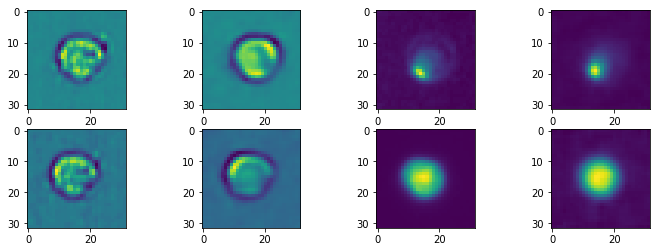

(4, 256, 128)
Epoch:  55 Iteration:  200 Loss:  151.27026
(32, 32, 4) (4, 32, 32, 1)


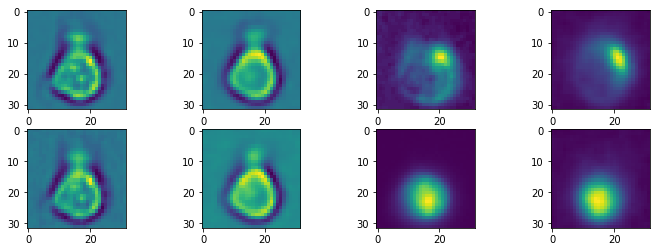

(4, 256, 128)
Epoch:  55 Iteration:  300 Loss:  154.1285
(32, 32, 4) (4, 32, 32, 1)


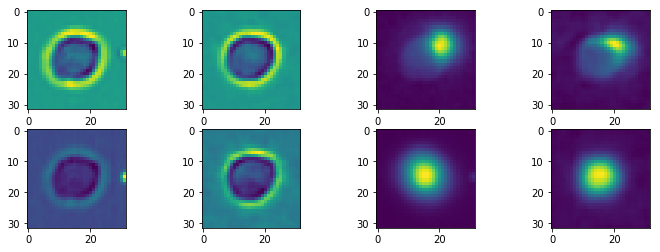

(4, 256, 128)
Epoch:  55 Iteration:  400 Loss:  154.74548
(32, 32, 4) (4, 32, 32, 1)


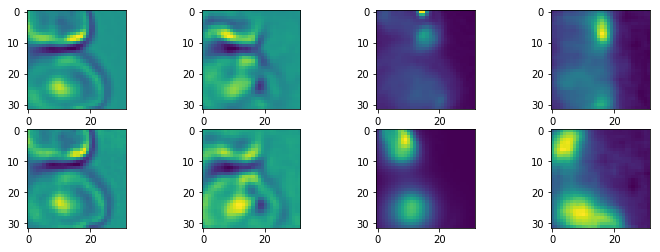

(4, 256, 128)
Epoch:  55 Iteration:  500 Loss:  159.22702
(32, 32, 4) (4, 32, 32, 1)


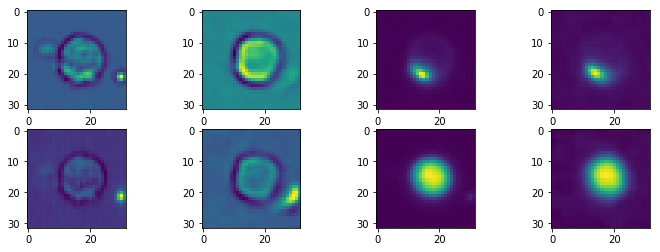

(4, 256, 128)
Epoch:  55 Iteration:  600 Loss:  159.78255
(32, 32, 4) (4, 32, 32, 1)


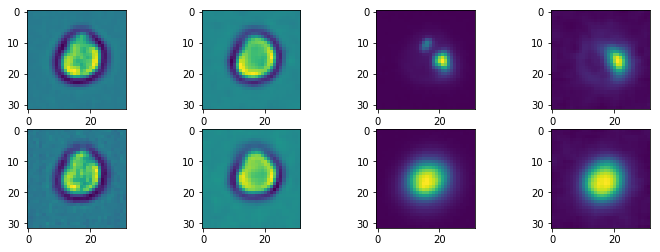

(4, 256, 128)
Epoch:  55 Iteration:  700 Loss:  159.57486
(32, 32, 4) (4, 32, 32, 1)


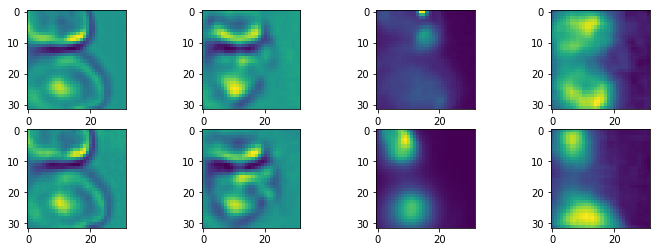

(4, 256, 128)
Epoch:  56 Iteration:  0 Loss:  155.10214
(32, 32, 4) (4, 32, 32, 1)


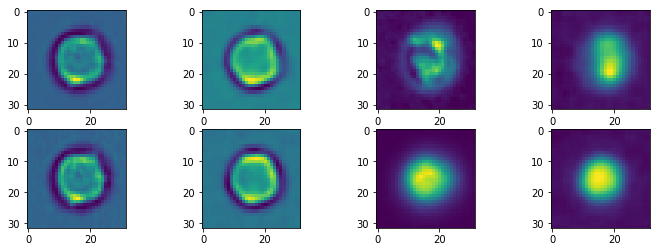

(4, 256, 128)
Epoch:  56 Iteration:  100 Loss:  149.24886
(32, 32, 4) (4, 32, 32, 1)


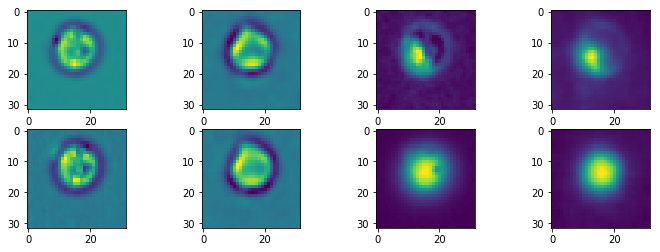

(4, 256, 128)
Epoch:  56 Iteration:  200 Loss:  149.10974
(32, 32, 4) (4, 32, 32, 1)


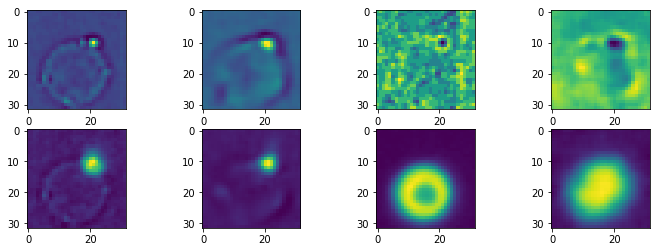

(4, 256, 128)
Epoch:  56 Iteration:  300 Loss:  152.54732
(32, 32, 4) (4, 32, 32, 1)


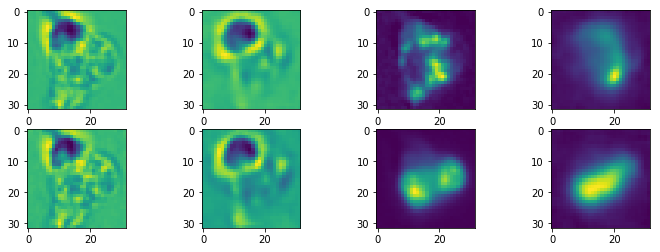

(4, 256, 128)
Epoch:  56 Iteration:  400 Loss:  155.0676
(32, 32, 4) (4, 32, 32, 1)


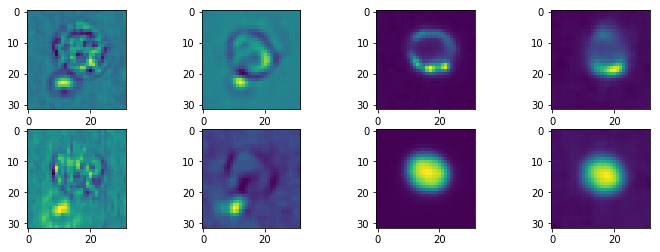

(4, 256, 128)
Epoch:  56 Iteration:  500 Loss:  158.91234
(32, 32, 4) (4, 32, 32, 1)


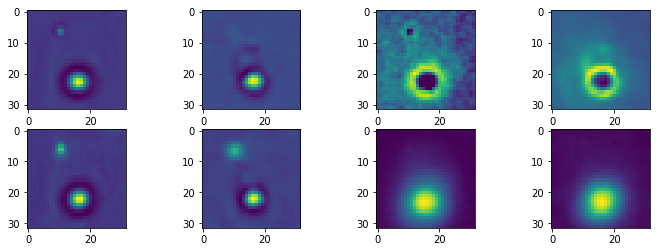

(4, 256, 128)
Epoch:  56 Iteration:  600 Loss:  159.03194
(32, 32, 4) (4, 32, 32, 1)


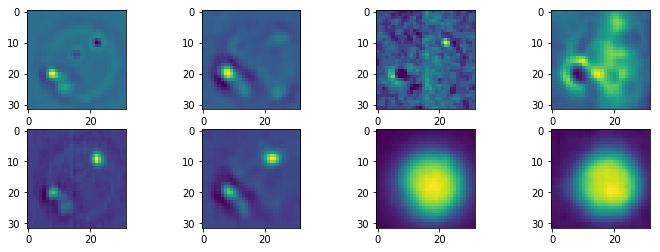

(4, 256, 128)
Epoch:  56 Iteration:  700 Loss:  159.45856
(32, 32, 4) (4, 32, 32, 1)


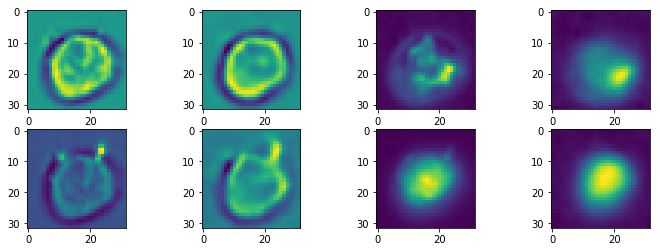

(4, 256, 128)
Epoch:  57 Iteration:  0 Loss:  155.34113
(32, 32, 4) (4, 32, 32, 1)


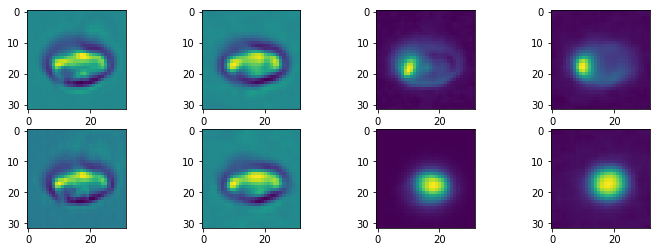

(4, 256, 128)
Epoch:  57 Iteration:  100 Loss:  149.9714
(32, 32, 4) (4, 32, 32, 1)


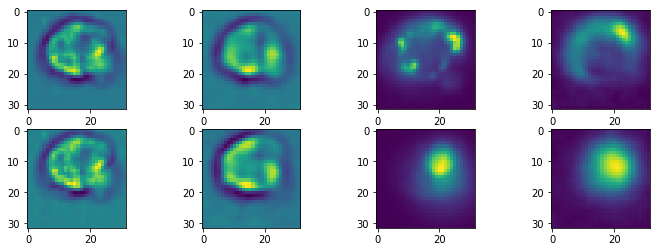

(4, 256, 128)
Epoch:  57 Iteration:  200 Loss:  152.87927
(32, 32, 4) (4, 32, 32, 1)


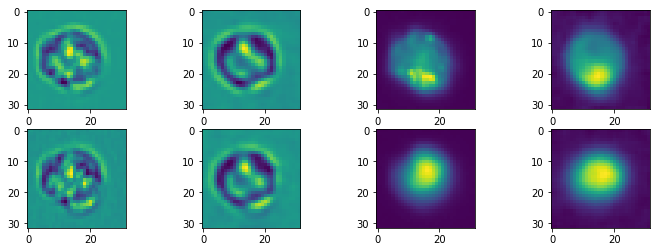

(4, 256, 128)
Epoch:  57 Iteration:  300 Loss:  152.33711
(32, 32, 4) (4, 32, 32, 1)


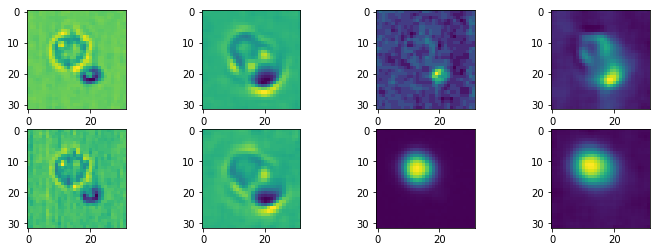

(4, 256, 128)
Epoch:  57 Iteration:  400 Loss:  154.41931
(32, 32, 4) (4, 32, 32, 1)


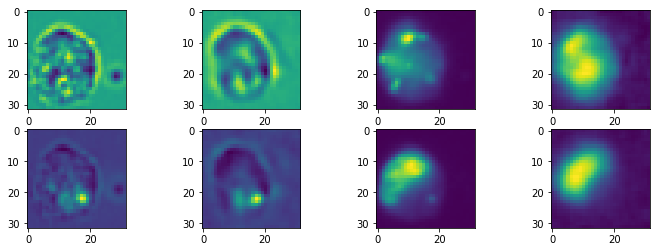

(4, 256, 128)
Epoch:  57 Iteration:  500 Loss:  159.24931
(32, 32, 4) (4, 32, 32, 1)


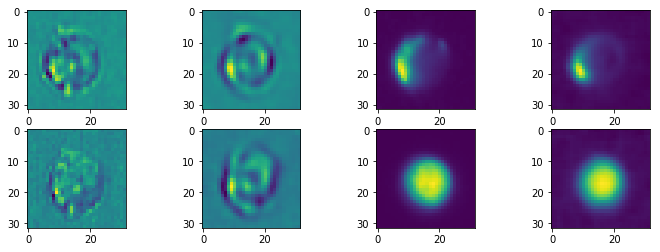

(4, 256, 128)
Epoch:  57 Iteration:  600 Loss:  159.40901
(32, 32, 4) (4, 32, 32, 1)


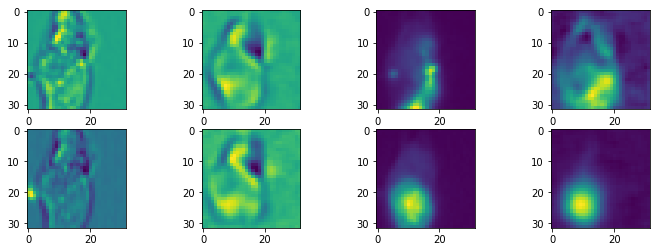

(4, 256, 128)
Epoch:  57 Iteration:  700 Loss:  158.61642
(32, 32, 4) (4, 32, 32, 1)


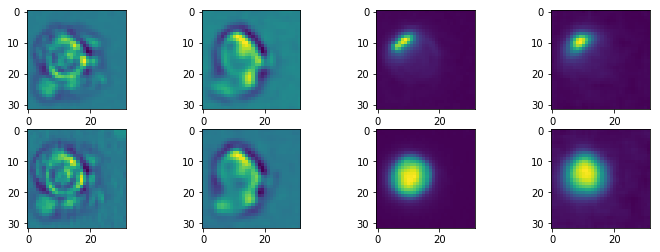

(4, 256, 128)
Epoch:  58 Iteration:  0 Loss:  151.59793
(32, 32, 4) (4, 32, 32, 1)


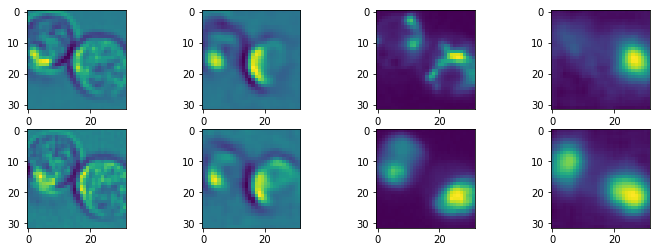

(4, 256, 128)
Epoch:  58 Iteration:  100 Loss:  148.20198
(32, 32, 4) (4, 32, 32, 1)


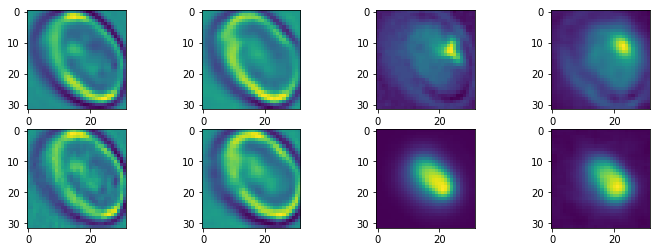

(4, 256, 128)
Epoch:  58 Iteration:  200 Loss:  150.3644
(32, 32, 4) (4, 32, 32, 1)


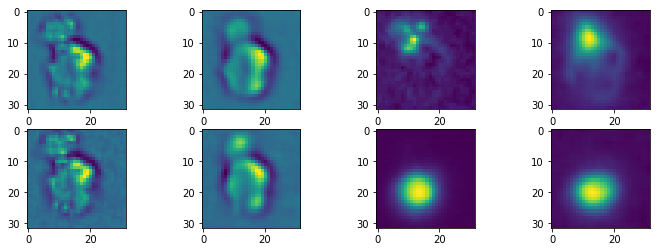

(4, 256, 128)
Epoch:  58 Iteration:  300 Loss:  153.00919
(32, 32, 4) (4, 32, 32, 1)


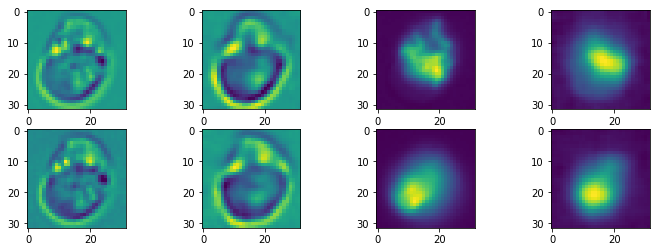

(4, 256, 128)
Epoch:  58 Iteration:  400 Loss:  155.28397
(32, 32, 4) (4, 32, 32, 1)


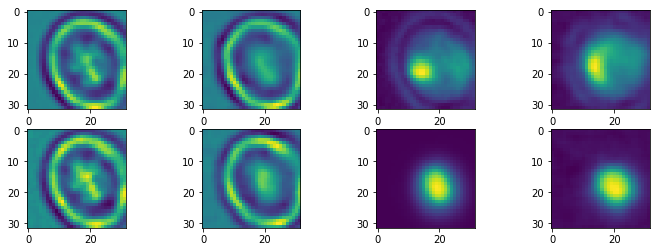

(4, 256, 128)
Epoch:  58 Iteration:  500 Loss:  159.83072
(32, 32, 4) (4, 32, 32, 1)


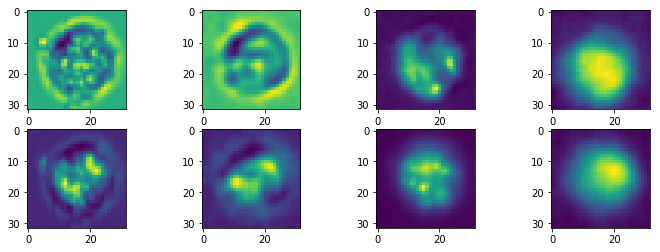

(4, 256, 128)
Epoch:  58 Iteration:  600 Loss:  158.77336
(32, 32, 4) (4, 32, 32, 1)


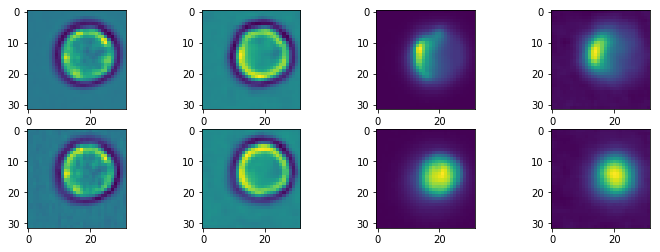

(4, 256, 128)
Epoch:  58 Iteration:  700 Loss:  160.11781
(32, 32, 4) (4, 32, 32, 1)


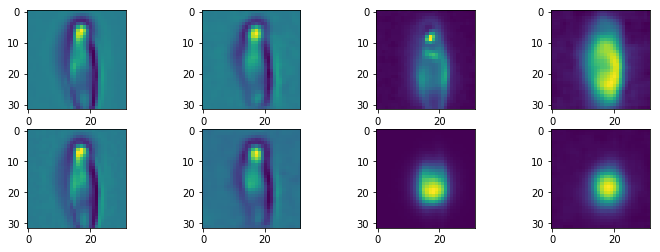

(4, 256, 128)
Epoch:  59 Iteration:  0 Loss:  154.85312
(32, 32, 4) (4, 32, 32, 1)


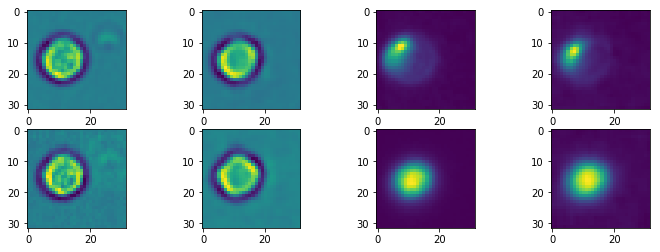

(4, 256, 128)
Epoch:  59 Iteration:  100 Loss:  149.96573
(32, 32, 4) (4, 32, 32, 1)


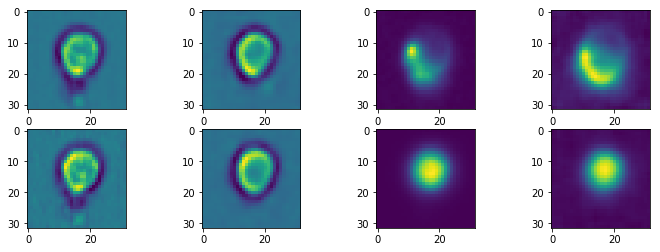

(4, 256, 128)
Epoch:  59 Iteration:  200 Loss:  150.41586
(32, 32, 4) (4, 32, 32, 1)


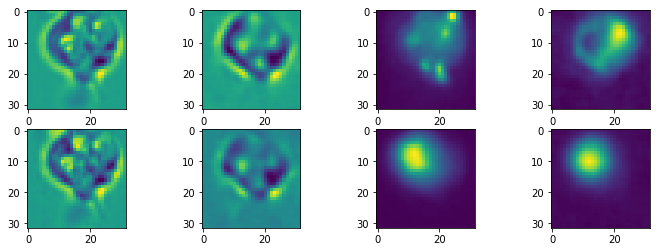

(4, 256, 128)
Epoch:  59 Iteration:  300 Loss:  153.43259
(32, 32, 4) (4, 32, 32, 1)


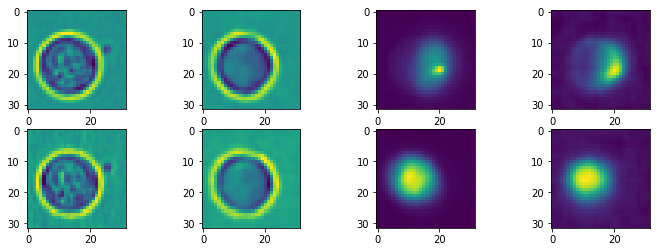

(4, 256, 128)
Epoch:  59 Iteration:  400 Loss:  153.63213
(32, 32, 4) (4, 32, 32, 1)


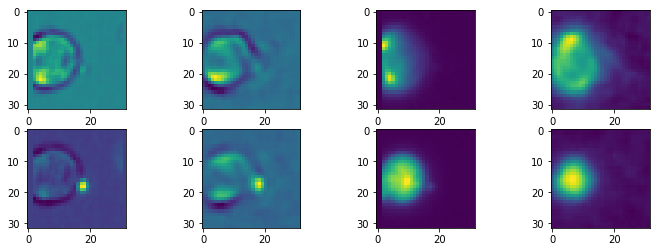

(4, 256, 128)
Epoch:  59 Iteration:  500 Loss:  158.16423
(32, 32, 4) (4, 32, 32, 1)


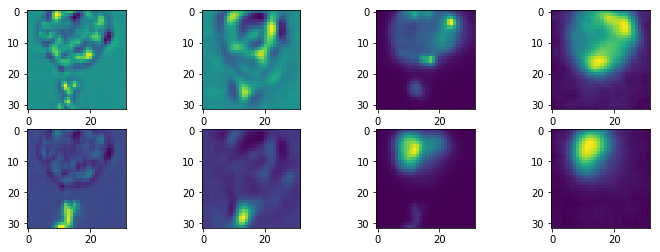

(4, 256, 128)
Epoch:  59 Iteration:  600 Loss:  157.96
(32, 32, 4) (4, 32, 32, 1)


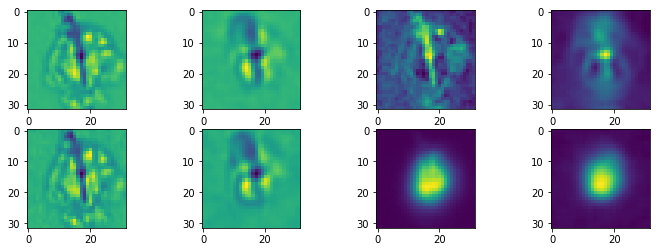

(4, 256, 128)
Epoch:  59 Iteration:  700 Loss:  156.73021
(32, 32, 4) (4, 32, 32, 1)


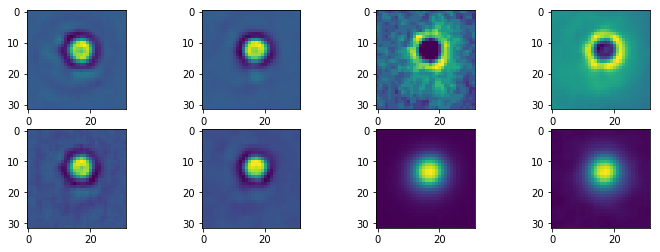

Done


In [7]:

p_mmdict = mmdict #{"Fish6_15_cjw_64.tif.mm": m3}
#             "plate04_all.mm": m4}

p_width = 32
p_height = 32
p_nchannels = 4
p_channels = [0,1,3,4]
p_nepochs = 60
p_batchsize = 256
p_learning_rate = 0.0001  #.00005
p_restore = False
p_latent_size = 128 #128 + 64
p_droprate = 0.9
p_stdev = .04
p_slam = .00005
p_denoise = None
enc_sizes = [(128, 3), (256, 3), (512, 3)]  #128, 3)]
######enc_sizes = [(64, 3), (128, 3), (256,3), (512,3)] #, (64, 3), (128,3)] #, (32, 3), (64, 3)]
#enc_sizes = [(16, 5), (32, 3), (64,3), (128,3)] #, (64, 3), (128,3)] #, (32, 3), (64, 3)]
dec_sizes = list(reversed(enc_sizes))
#dec_sizes.append((p_nchannels,7))

params = dict()

params['width'] = p_width
params['height'] = p_height
params['nchannels'] = p_nchannels
params['channels'] = p_channels
params['nepochs'] = p_nepochs
params['batchsize'] = p_batchsize
params['learning_rate'] = p_learning_rate
params['restore'] = p_restore
params['latent_size'] = p_latent_size
params['droprate'] = p_droprate
params['stdev'] = p_stdev
params['slam'] = p_slam
params['enc_sizes'] = enc_sizes
params['dec_sizes'] = dec_sizes
params['denoise'] = p_denoise
cpdir = "/media/cjw/Data/cyto/Checkpoints/2018-07-11-Channels/"

if not os.path.exists(cpdir):
    os.makedirs(cpdir)
autoencoder_channels.train(p_mmdict, p_df, params, 100, cpdir)

In [ ]:
x = 4
x